### Extracting and Preparing Data

- First finding all patients where a diagnosis of heart failure was made
- Second extracting and saving all lab test data to a pandas dataframe
- Third comparing each lab test between those patients that remained alive after 30 days of being released from the ICU to those that died before 30 days (e.g. 30 day mortality).
- Finally, saving the dataset to a pickle file

In [2]:
import numpy as np
import pandas as pd
import matplotlib.pyplot as plt
import psycopg2
%matplotlib inline

# Connect to local copy of the MIMIC III database
sqluser = 'postgres'
dbname = 'mimic'
schema_name = 'mimiciii'

# Connect to local postgres version of mimic
con = psycopg2.connect(dbname=dbname, user=sqluser)
cur = con.cursor()
cur.execute('SET search_path to ' + schema_name)

# selecting all patient ids with heart failure diagnosis using ICD9code. There are about 10,000 in total.
data = pd.read_sql_query("SELECT * FROM diagnoses_icd WHERE icd9_code LIKE '%428%'",con)
HF_subject_id = data.subject_id.unique() 

#Next creating dataframe of patient information with id 
patient_list = ', '.join([str(i) for i in HF_subject_id])
query= 'SELECT * FROM patients WHERE subject_id IN (%s)' % patient_list

# creating pandas data frame with patient demographics. Note that dates are shifted to that patients cannot be identified.
HF_patients = pd.read_sql_query(query, con)
HF_patients.head()

# query = 'SELECT * FROM labevents WHERE subject_id IN (%s)' % (patient_list)
# test = pd.read_sql_query(query, con)
# print 'finished'

,row_id,subject_id,gender,dob,dod,dod_hosp,dod_ssn,expire_flag
0,2,3,M,2025-04-11,2102-06-14,NaT,2102-06-14,1
1,8,9,M,2108-01-26,2149-11-14,2149-11-14,2149-11-14,1
2,18,21,M,2047-04-04,2135-02-08,2135-02-08,2135-02-08,1
3,23,26,M,2054-05-04,2128-02-25,NaT,2128-02-25,1
4,26,30,M,1872-10-14 00:00:00,NaT,NaT,NaT,0


**Adding nubmer of admissions**
From the admissions datset, retri

In [3]:
#Next creating dataframe of patient information with id 
patient_list = ', '.join([str(i) for i in HF_subject_id])
query= 'SELECT * FROM admissions WHERE subject_id IN (%s)' % (patient_list)
HF_admissions = pd.read_sql_query(query, con)

In [4]:
#adding number of ICU admissions to dataframe
number_adm = HF_admissions['subject_id'].value_counts()
HF_patients['num_adm'] = [number_adm[i] for i in HF_patients.subject_id]
HF_patients.head()

,row_id,subject_id,gender,dob,dod,dod_hosp,dod_ssn,expire_flag,num_adm
0,2,3,M,2025-04-11,2102-06-14,NaT,2102-06-14,1,1
1,8,9,M,2108-01-26,2149-11-14,2149-11-14,2149-11-14,1,1
2,18,21,M,2047-04-04,2135-02-08,2135-02-08,2135-02-08,1,2
3,23,26,M,2054-05-04,2128-02-25,NaT,2128-02-25,1,1
4,26,30,M,1872-10-14 00:00:00,NaT,NaT,NaT,0,1


**adding mortality dates**

In [39]:
#selecting patients with only one ICU admission
HF_patients_1 = HF_patients[HF_patients['num_adm'] == 1]
HF_admissions_1 = HF_admissions[HF_admissions['subject_id'].isin(HF_patients_1['subject_id'])]
HF_patients_1 = pd.merge(HF_patients_1, HF_admissions_1[['subject_id','hadm_id','admittime','dischtime']], on='subject_id')
HF_patients_1['hospital_time'] = (HF_patients_1['dischtime']-HF_patients_1['admittime'])/np.timedelta64(1, 's')/3600./24.
HF_patients_1['mortality_time'] = (HF_patients_1['dod']-HF_patients_1['dischtime'])/np.timedelta64(1, 's')/3600./24.

HF_patients_1.head()

,row_id,subject_id,gender,dob,dod,dod_hosp,dod_ssn,expire_flag,num_adm,hadm_id,admittime,dischtime,hospital_time,mortality_time
0,2,3,M,2025-04-11,2102-06-14,NaT,2102-06-14,1,1,145834,2101-10-20 19:08:00,2101-10-31 13:58:00,10.784722,225.418056
1,8,9,M,2108-01-26,2149-11-14,2149-11-14,2149-11-14,1,1,150750,2149-11-09 13:06:00,2149-11-14 10:15:00,4.881250,-0.427083
2,23,26,M,2054-05-04,2128-02-25,NaT,2128-02-25,1,1,197661,2126-05-06 15:16:00,2126-05-13 15:00:00,6.988889,652.375000
3,26,30,M,1872-10-14 00:00:00,NaT,NaT,NaT,0,1,104557,2172-10-14 14:17:00,2172-10-19 14:37:00,5.013889,NaN
4,33,37,M,2114-09-17,2185-01-06,2185-01-06,2185-01-06,1,1,188670,2183-08-21 16:48:00,2183-08-26 18:54:00,5.087500,498.212500


**finding available lab tests for these patients (showing the first 50)** 

In [6]:
patient_list_1 = ' ,'.join([str(i) for i in list(HF_patients_1['subject_id'])[0:1000]])
query = 'SELECT * FROM labevents WHERE subject_id IN (%s)' % (patient_list_1)
test = pd.read_sql_query(query, con)
items = test['itemid'].unique()
items = ', '.join([str(i) for i in items])
query = 'SELECT * FROM D_LABITEMS WHERE itemid IN (%s)' % (items)
test2 = pd.read_sql_query(query, con)
test2.iloc[0:50]

,row_id,itemid,label,fluid,category,loinc_code
0,1,50800,SPECIMEN TYPE,BLOOD,BLOOD GAS,None
1,2,50801,Alveolar-arterial Gradient,Blood,Blood Gas,19991-9
2,3,50802,Base Excess,Blood,Blood Gas,11555-0
3,4,50803,"Calculated Bicarbonate, Whole Blood",Blood,Blood Gas,1959-6
4,5,50804,Calculated Total CO2,Blood,Blood Gas,34728-6
5,6,50805,Carboxyhemoglobin,Blood,Blood Gas,20563-3
6,7,50806,"Chloride, Whole Blood",Blood,Blood Gas,2069-3
7,9,50808,Free Calcium,Blood,Blood Gas,1994-3
8,10,50809,Glucose,Blood,Blood Gas,2339-0
9,11,50810,"Hematocrit, Calculated",Blood,Blood Gas,20570-8


Writing a function to pull out a specific lab test and compare 30 day mortality

haptoglobin 1.56351560031e-127
n =  1105


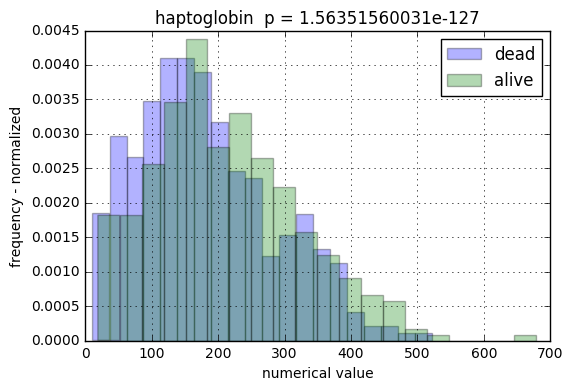

,row_id,subject_id,gender,dob,dod,dod_hosp,dod_ssn,expire_flag,num_adm,hadm_id,admittime,dischtime,hospital_time,mortality_time,haptoglobin,haptoglobin_mean
0,2,3,M,2025-04-11,2102-06-14,NaT,2102-06-14,1,1,145834,2101-10-20 19:08:00,2101-10-31 13:58:00,10.784722,225.418056,[],NaN
1,8,9,M,2108-01-26,2149-11-14,2149-11-14,2149-11-14,1,1,150750,2149-11-09 13:06:00,2149-11-14 10:15:00,4.881250,-0.427083,[],NaN
2,23,26,M,2054-05-04,2128-02-25,NaT,2128-02-25,1,1,197661,2126-05-06 15:16:00,2126-05-13 15:00:00,6.988889,652.375000,[],NaN
3,26,30,M,1872-10-14 00:00:00,NaT,NaT,NaT,0,1,104557,2172-10-14 14:17:00,2172-10-19 14:37:00,5.013889,NaN,[],NaN
4,33,37,M,2114-09-17,2185-01-06,2185-01-06,2185-01-06,1,1,188670,2183-08-21 16:48:00,2183-08-26 18:54:00,5.087500,498.212500,[265.0],265.0


In [88]:
from scipy import stats

HF_patients_1.head()
data = HF_patients_1
plist = patient_list_1

def plot_30d_mortality(number, name, patientlist, dataframe):

    try:
        #making copy of pandas dataframe
        df = dataframe.copy()

        #getting patient IDs and turning them into postgres string for quiery
        patientlist = ' ,'.join([str(i) for i in list(df['subject_id'])[0:]])

        #quiering data
        query = 'SELECT * FROM labevents WHERE itemid IN (' + str(number) + ') AND subject_id IN (%s)' % (patientlist)
        test3 = pd.read_sql_query(query, con)
        patientlist = [i for i in list(df['subject_id'])[0:]]
        df[name] = [list(test3[test3['subject_id'] == i]['valuenum']) for i in patientlist[0:]]

        #make new data column
        df[str(name + '_mean')] = df[name].apply(np.mean)

        #split by mortality after icu visit
        dead = df[(df['mortality_time'] < 30.) & (df['mortality_time'] > -1.)][str(name + '_mean')]
        alive = df[df['mortality_time'] > 30.][str(name + '_mean')]

        #how different are the means
        p = stats.mannwhitneyu(dead,alive)[1]
        n = df[str(name + '_mean')].dropna().shape[0]
        print name, p
        print 'n = ', n

        #plot figure
        plt.figure()
        plt.title(name + '  p = ' + str(p))
        dead.hist(alpha = 0.3, bins = 20, label = 'dead', normed=1.)
        alive.hist(alpha = 0.3, bins = 20, label = 'alive', normed=1.)
        plt.xlabel('numerical value')
        plt.ylabel('frequency - normalized')
        plt.legend()
        plt.show()
        
        return df, n, p
    
    except:
        return 'Error'
        
        

d = plot_30d_mortality(50935, 'haptoglobin', patient_list_1, HF_patients_1)
# d = plot_30d_mortality(50963, 'NTproBNP', plist, data)
# df = plot_30d_mortality(50971, 'potassium', patient_list_1, HF_patients_1)
# df = plot_30d_mortality(50905, 'LDL_cholesterol', patient_list_1, HF_patients_1)
# df = plot_30d_mortality(50820, 'BloodpH', patient_list_1, HF_patients_1)
# df = plot_30d_mortality(50909, 'cortisol', patient_list_1, HF_patients_1)
# df = plot_30d_mortality(50909, 'chloride', patient_list_1, HF_patients_1)
# df = plot_30d_mortality(50852, 'A1C', patient_list_1, HF_patients_1)
d[0].head()

Now plotting histograms for all lab tests

50801 Alveolar-arterial Gradient
Alveolar-arterial Gradient 4.21041006011e-09
n =  1802


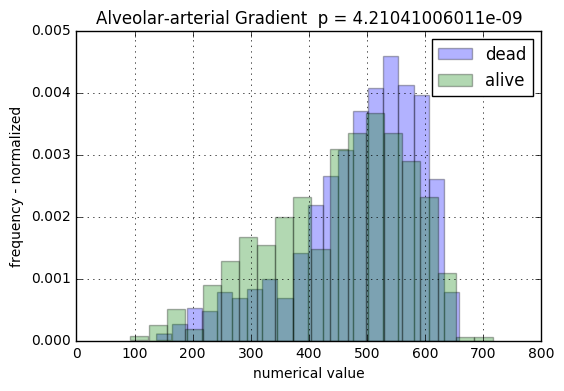

50802 Base Excess
Base Excess 7.53169354637e-56
n =  5575


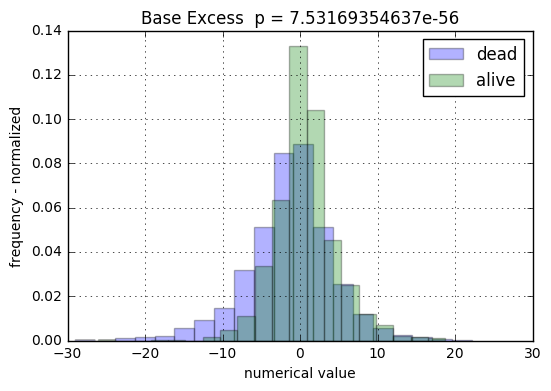

50803 Calculated Bicarbonate, Whole Blood
Calculated Bicarbonate, Whole Blood 1.12330276775e-188
n =  817


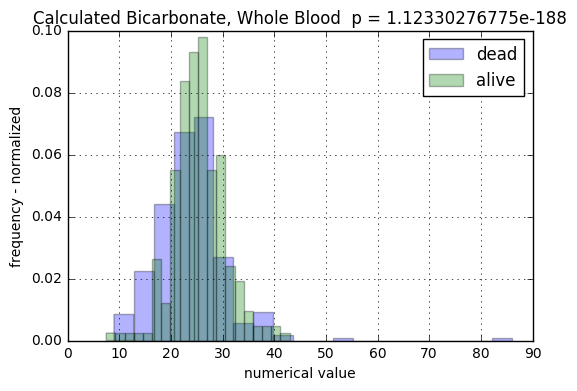

50804 Calculated Total CO2
Calculated Total CO2 6.52642646657e-46
n =  5581


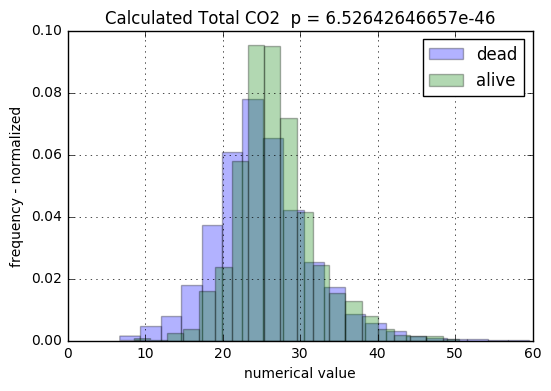

50805 Carboxyhemoglobin
Carboxyhemoglobin 0.0
n =  230


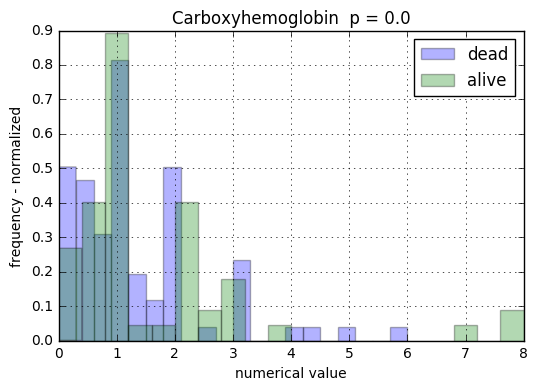

50806 Chloride, Whole Blood
Chloride, Whole Blood 0.00270149355345
n =  2791


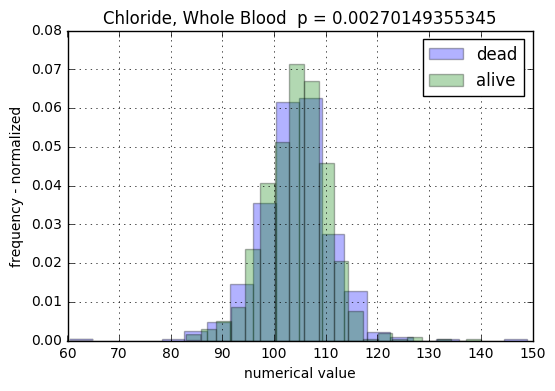

50808 Free Calcium
Free Calcium 9.86135445194e-28
n =  4301


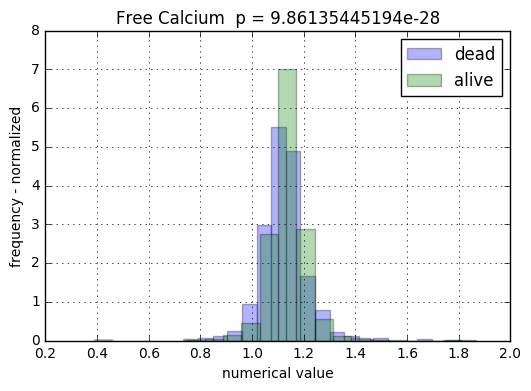

50809 Glucose
Glucose 0.0240564189063
n =  3961


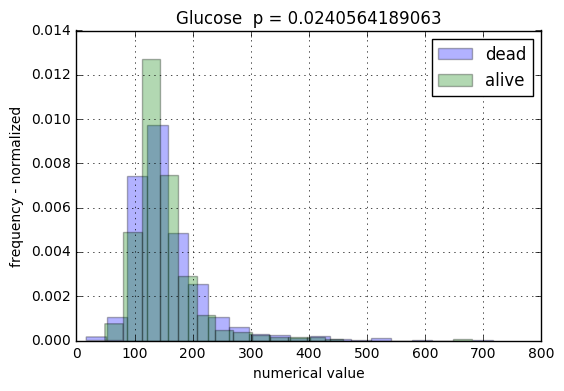

50810 Hematocrit, Calculated
Hematocrit, Calculated 0.173318564031
n =  3795


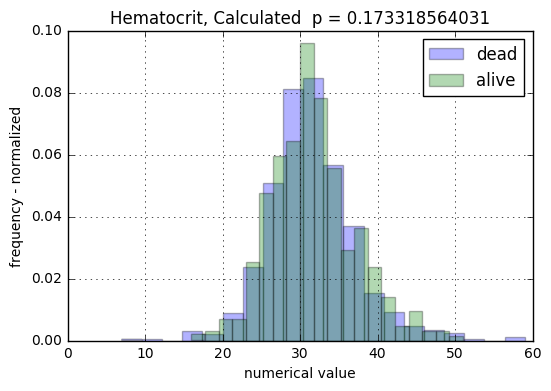

50811 Hemoglobin
Hemoglobin 0.00892655496222
n =  3796


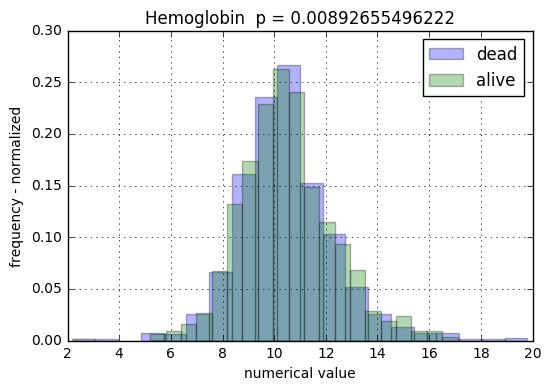

50812 Intubated
Error
50813 Lactate
Lactate 0.0914490997012
n =  5158


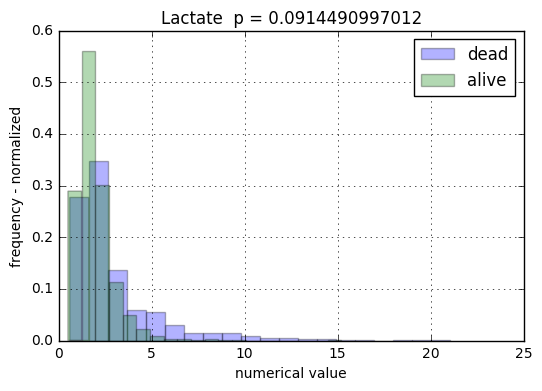

50814 Methemoglobin
Methemoglobin 0.0
n =  233


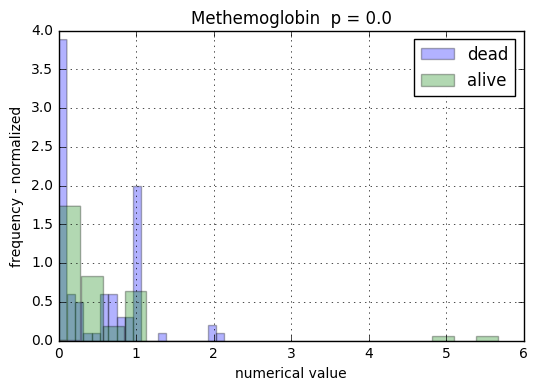

50815 O2 Flow
O2 Flow 4.25140261717e-23
n =  1562


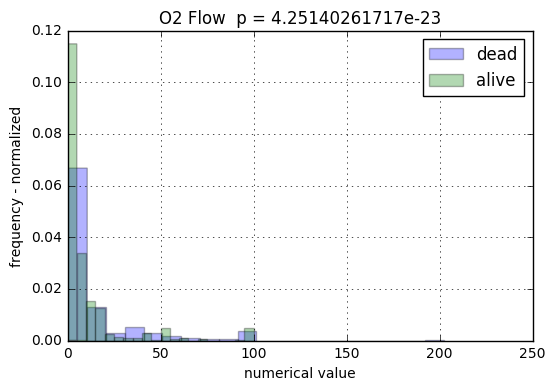

50816 Oxygen
Oxygen 8.37562582859e-14
n =  3126


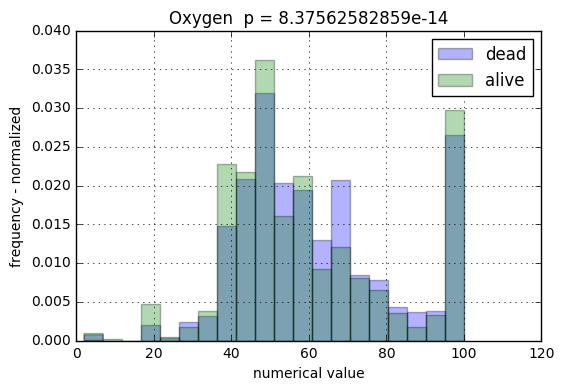

50817 Oxygen Saturation
Oxygen Saturation 1.48088285097e-14
n =  4263


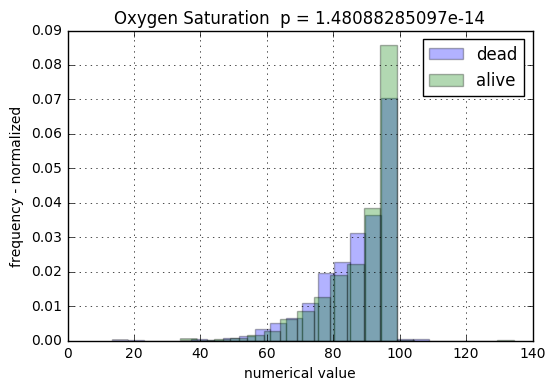

50818 pCO2
pCO2 1.51161935526e-16
n =  5583


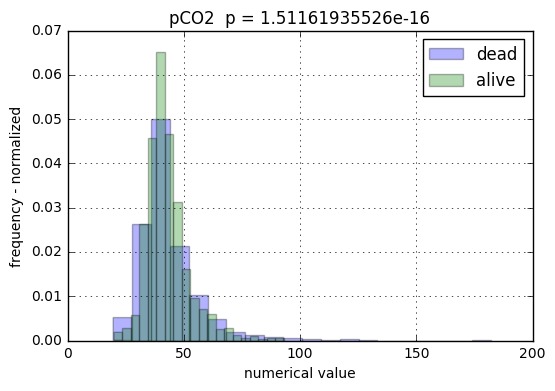

50819 PEEP
PEEP 3.08408985835e-10
n =  2294


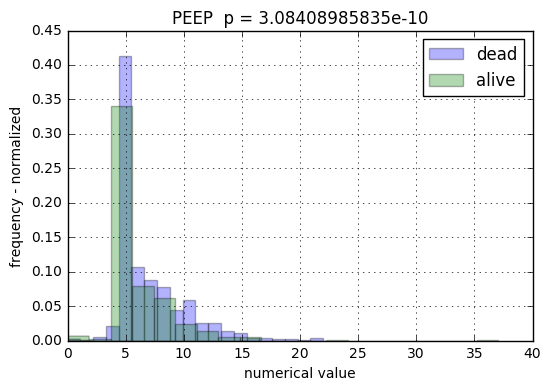

50820 pH
pH 5.25690612577e-46
n =  5726


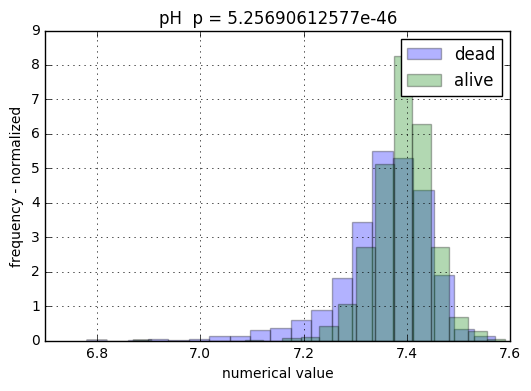

50821 pO2
pO2 1.58013176534e-29
n =  5580


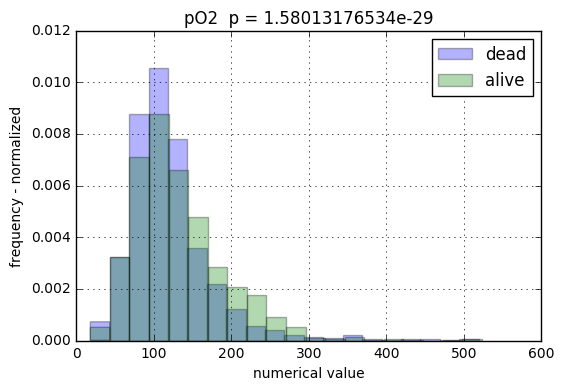

50822 Potassium, Whole Blood
Potassium, Whole Blood 0.00321416215714
n =  4490


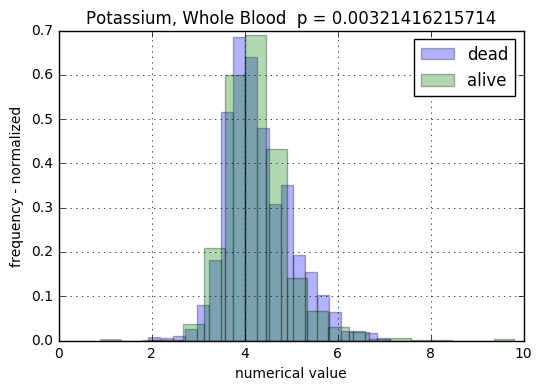

50823 Required O2
Required O2 3.80090551147e-09
n =  1804


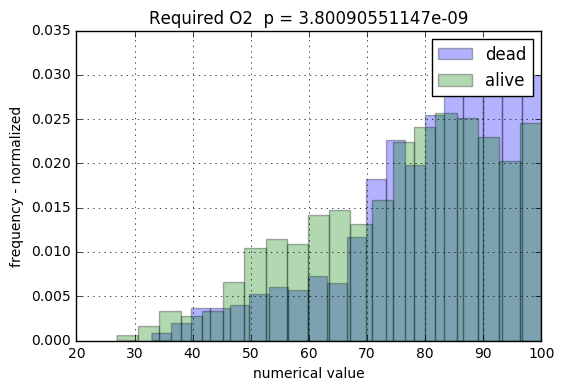

50824 Sodium, Whole Blood
Sodium, Whole Blood 0.11769210817
n =  3359


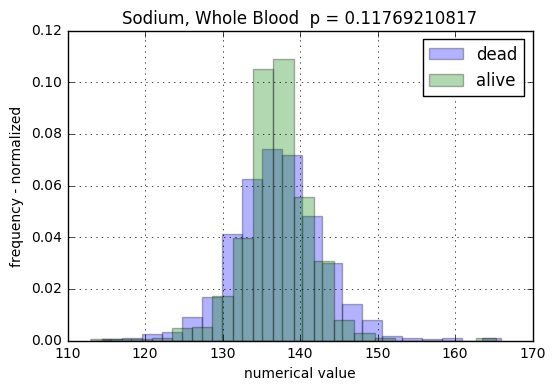

50825 Temperature
Temperature 6.3058009873e-40
n =  3335


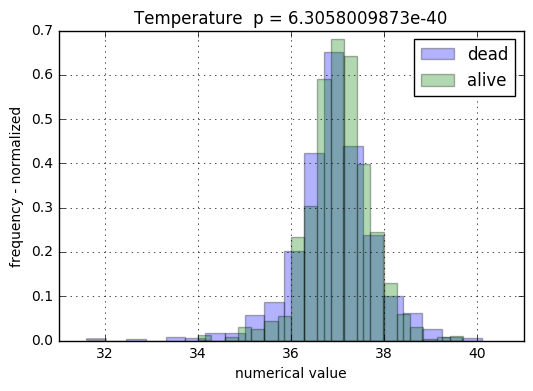

50826 Tidal Volume
Tidal Volume 1.37832167688e-18
n =  2488


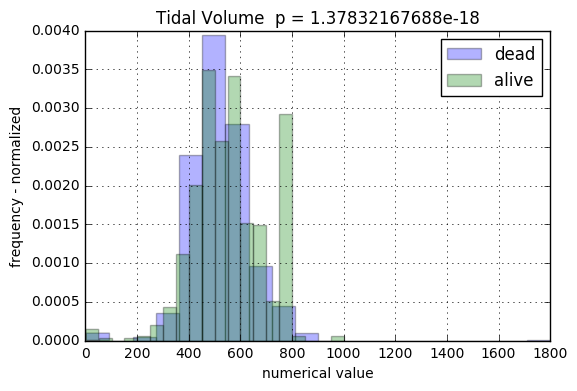

50827 Ventilation Rate
Error
50828 Ventilator
Error
50829 Fluid Type
Error
50830 pCO2, Body Fluid
pCO2, Body Fluid 0.0
n =  6


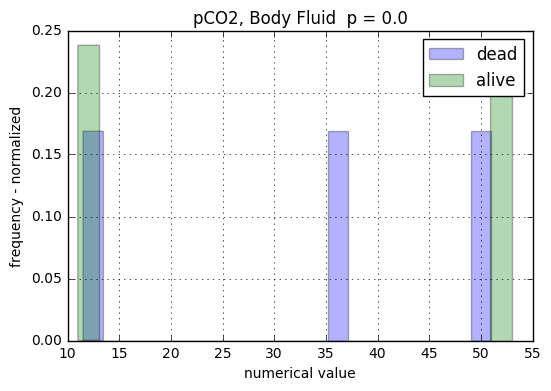

50831 pH
pH 0.0
n =  229


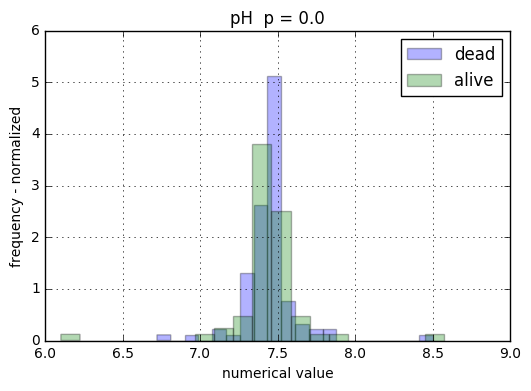

50835 Albumin, Ascites
Albumin, Ascites 0.0
n =  56


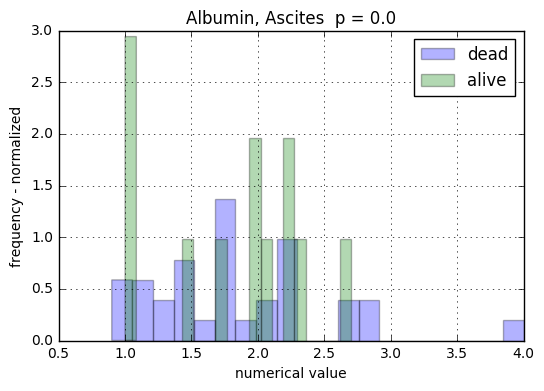

50836 Amylase, Ascites
Amylase, Ascites 0.0
n =  63


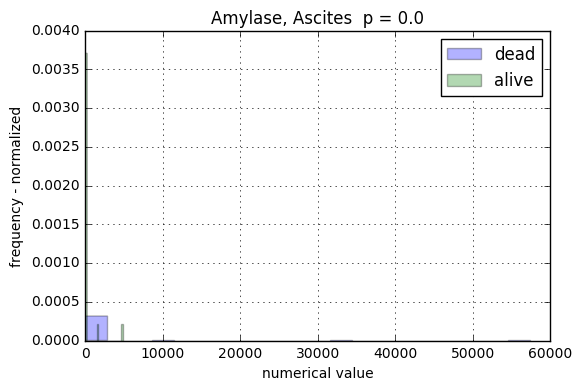

50837 Bicarbonate, Ascites
Bicarbonate, Ascites 0.0
n =  3


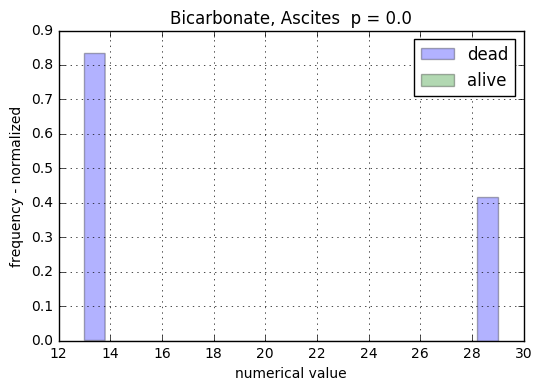

50838 Bilirubin, Total, Ascites
Bilirubin, Total, Ascites 0.0
n =  44


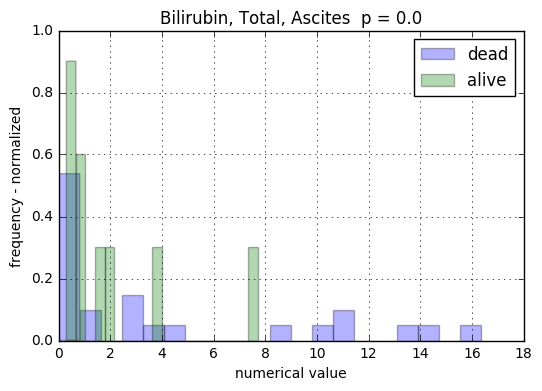

50841 Creatinine, Ascites
Creatinine, Ascites 0.0
n =  33


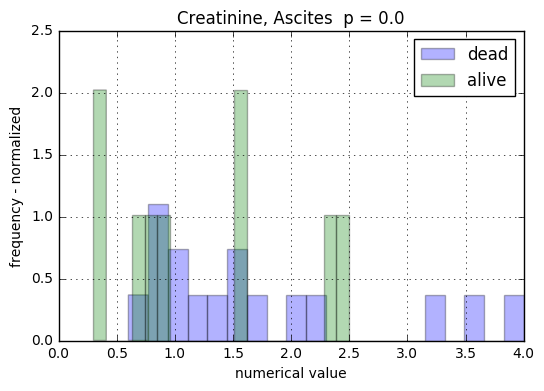

50842 Glucose, Ascites
Glucose, Ascites 0.0
n =  80


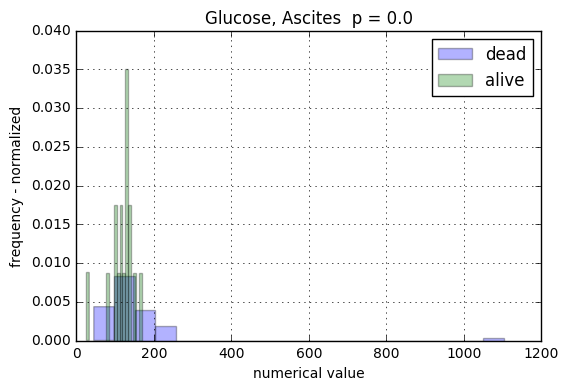

50843 Lactate Dehydrogenase, Ascites
Lactate Dehydrogenase, Ascites 0.0
n =  85


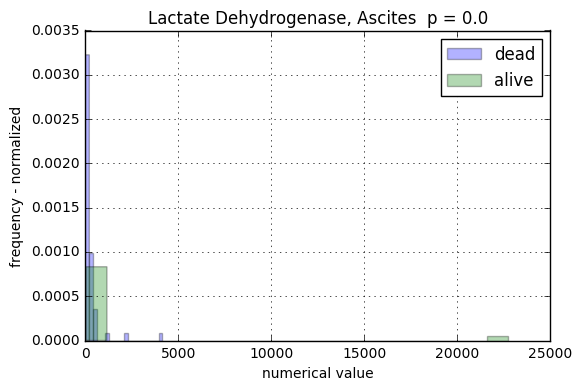

50847 Potassium, Ascites
Potassium, Ascites 0.0
n =  4


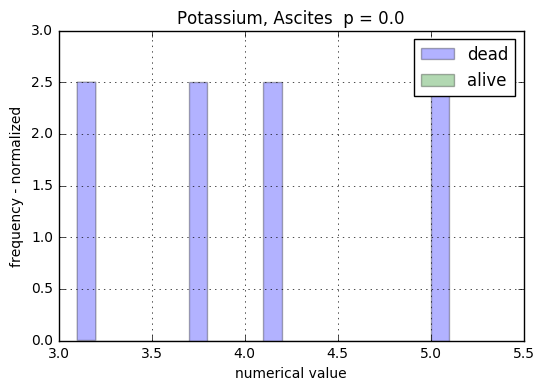

50848 Sodium, Ascites
Sodium, Ascites 0.0
n =  4


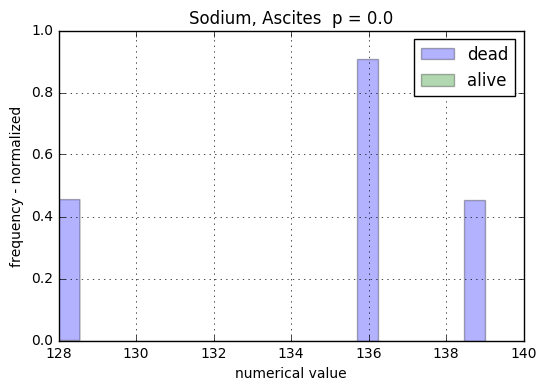

50849 Total Protein, Ascites
Total Protein, Ascites 0.0
n =  100


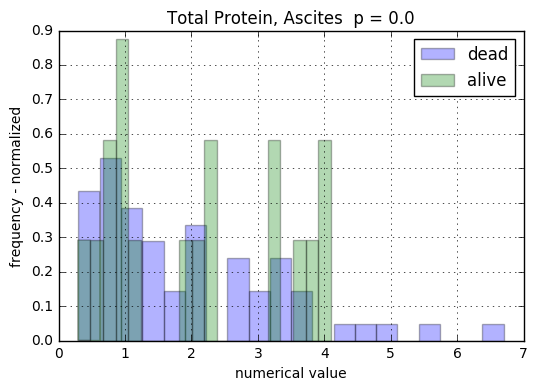

50851 Urea Nitrogen, Ascites
Urea Nitrogen, Ascites 0.0
n =  4


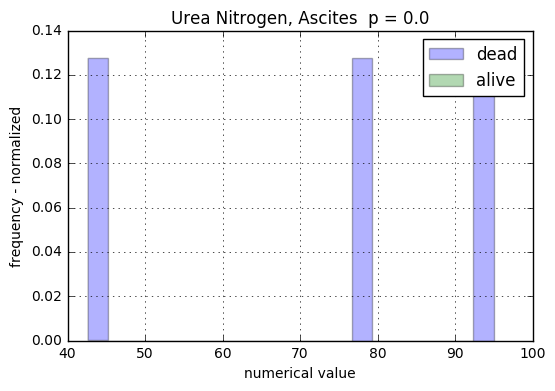

50852 % Hemoglobin A1c
% Hemoglobin A1c 2.89334142873e-242
n =  1927


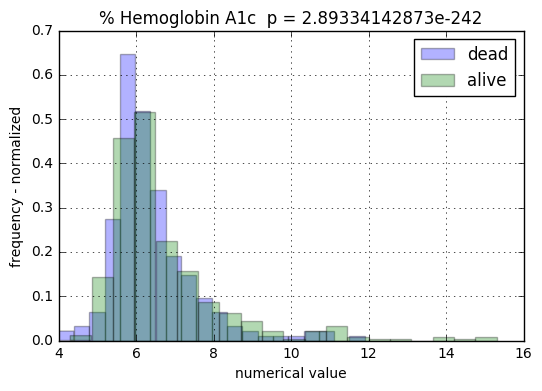

50854 Absolute A1c
Error
50855 Absolute Hemoglobin
Error
50856 Acetaminophen
Acetaminophen 0.0
n =  56


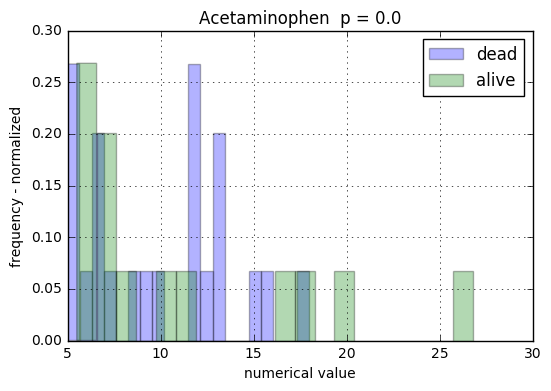

50857 Acetone
Acetone 0.0
n =  1


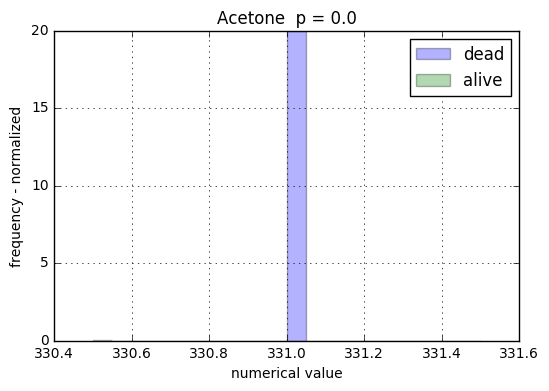

50858 Acid Phosphatase
Acid Phosphatase 0.0
n =  2


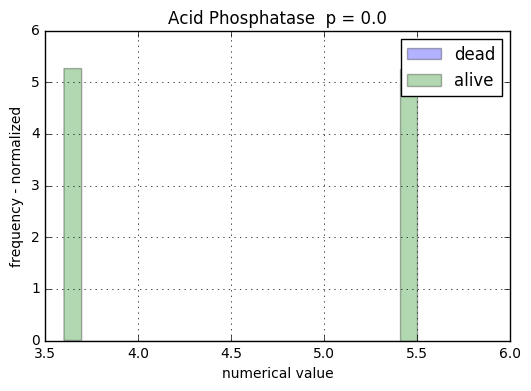

50859 Acid Phosphatase, Non-Prostatic
Acid Phosphatase, Non-Prostatic 0.0
n =  2


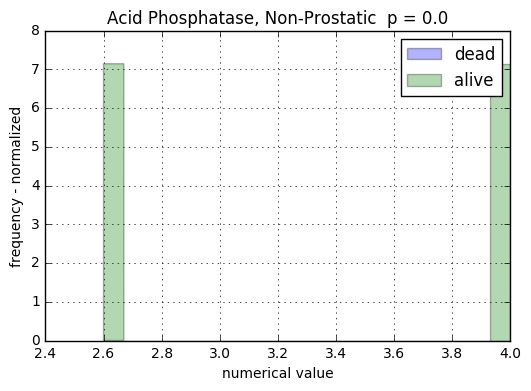

50860 AFP, Maternal Screen
AFP, Maternal Screen 0.0
n =  1


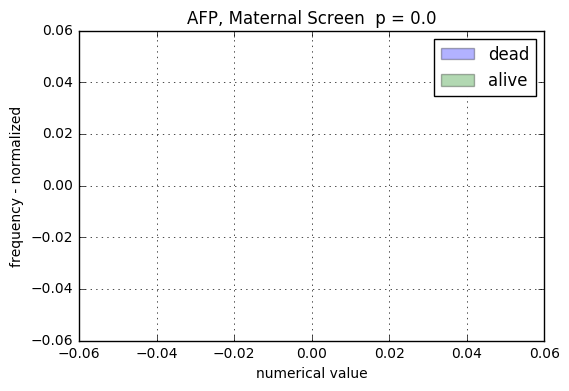

50861 Alanine Aminotransferase (ALT)
Alanine Aminotransferase (ALT) 1.29331294776e-09
n =  5564


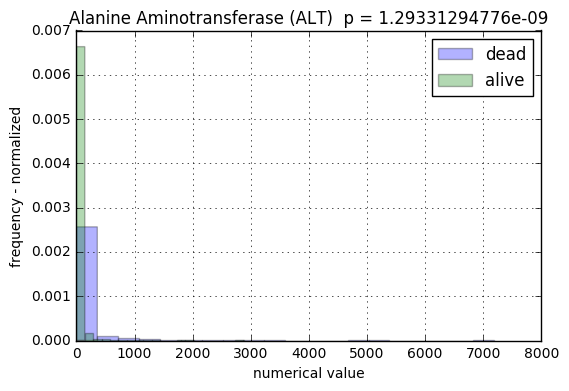

50862 Albumin
Albumin 1.98288566517e-46
n =  5221


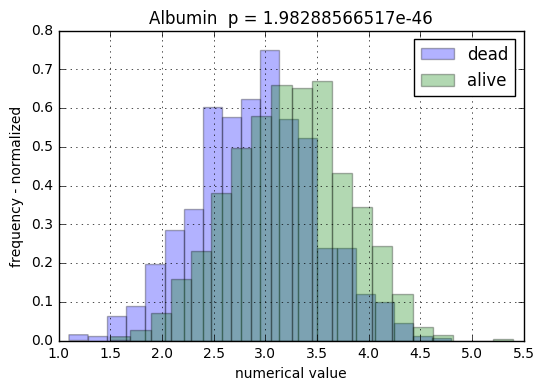

50863 Alkaline Phosphatase
Alkaline Phosphatase 0.0395690634059
n =  5459


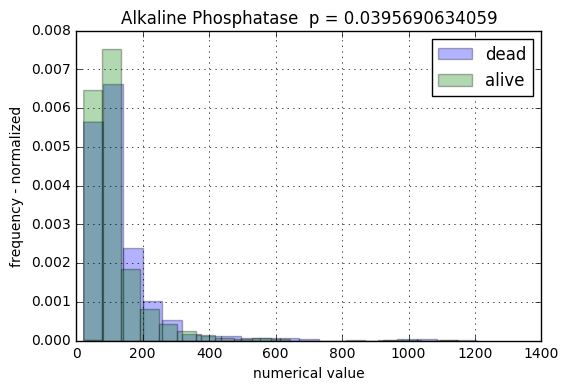

50864 Alpha-Fetoprotein
Alpha-Fetoprotein 0.0
n =  119


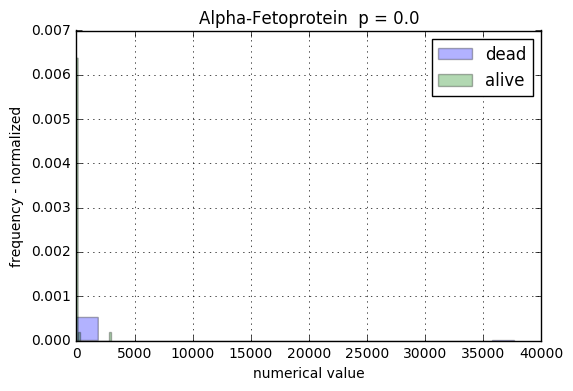

50866 Ammonia
Ammonia 0.0
n =  287


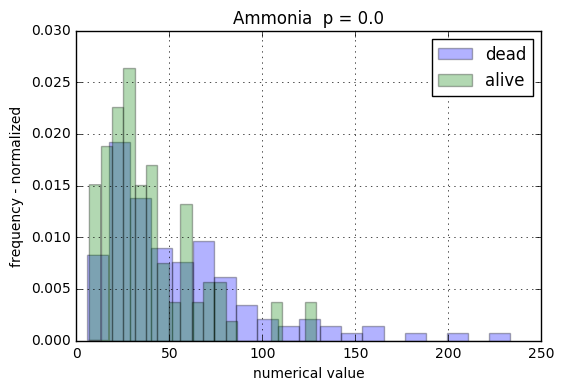

50867 Amylase
Amylase 0.00023257457062
n =  3037


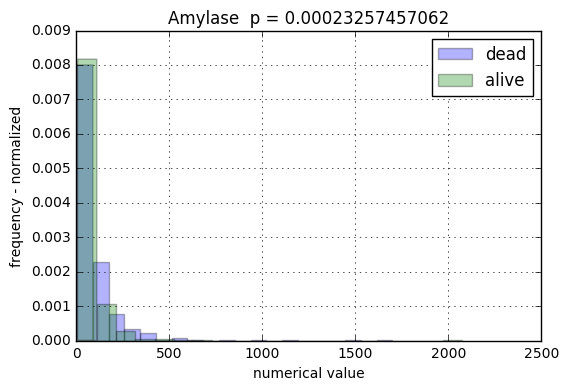

50868 Anion Gap
Anion Gap 1.58829175963e-51
n =  6934


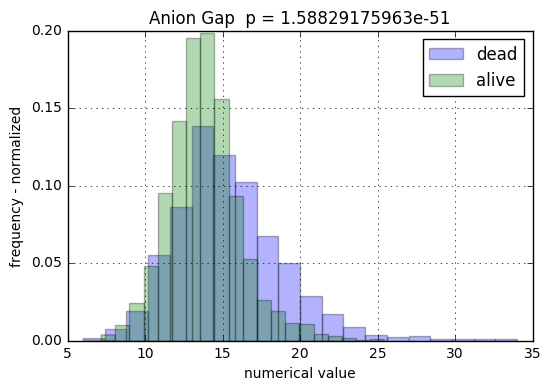

50871 Anti-Mitochondrial Antibody
Error
50872 Anti-Neutrophil Cytoplasmic Antibody
Error
50873 Anti-Nuclear Antibody
Error
50874 Anti-Nuclear Antibody, Titer
Error
50876 Anti-Smooth Muscle Antibody
Error
50877 Anti-Thyroglobulin Antibodies
Anti-Thyroglobulin Antibodies 0.0
n =  3


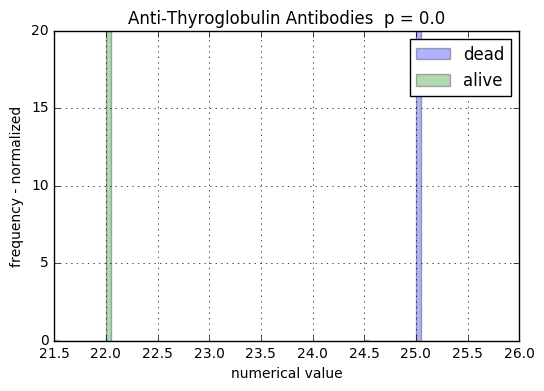

50878 Asparate Aminotransferase (AST)
Asparate Aminotransferase (AST) 5.95197422102e-16
n =  5561


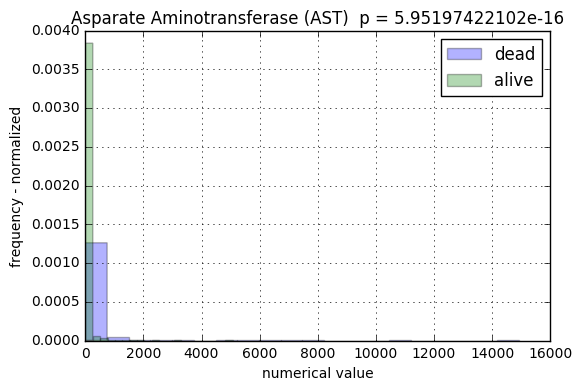

50879 Barbiturate Screen
Error
50880 Benzodiazepine Screen
Error
50881 Beta-2 Microglobulin
Beta-2 Microglobulin 0.0
n =  32


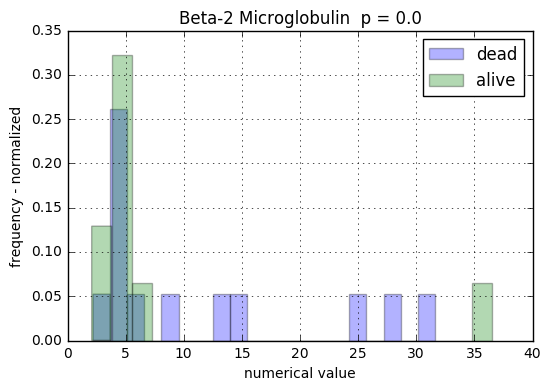

50882 Bicarbonate
Bicarbonate 1.50945443457e-49
n =  6922


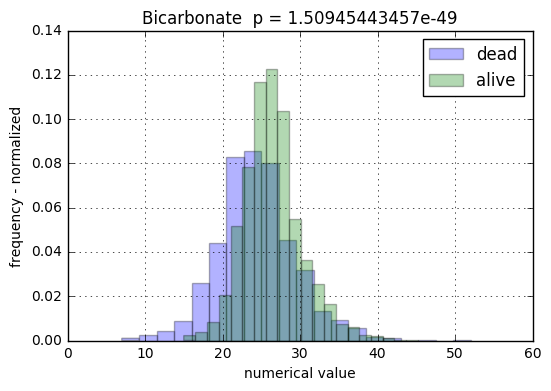

50883 Bilirubin, Direct
Bilirubin, Direct 4.56379204874e-138
n =  1119


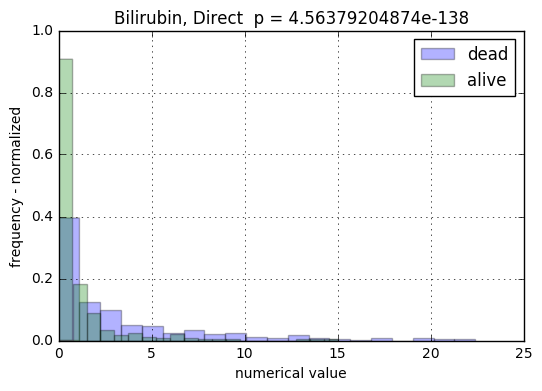

50884 Bilirubin, Indirect
Bilirubin, Indirect 8.80285930903e-144
n =  1071


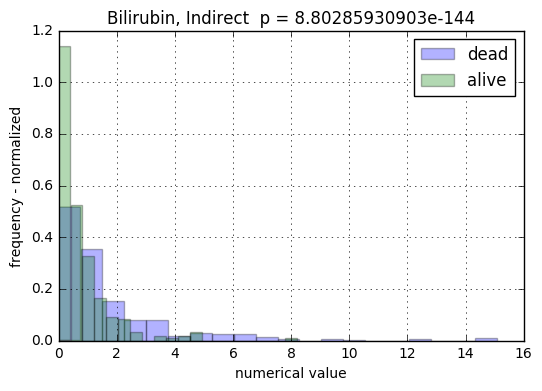

50885 Bilirubin, Total
Bilirubin, Total 9.02943292711e-06
n =  5517


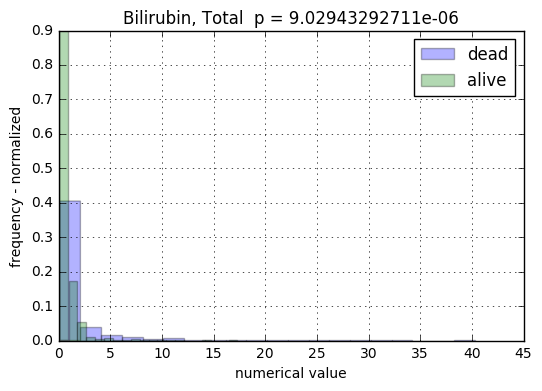

50886 Blood Culture Hold
Error
50887 Blue Top Hold
Error
50889 C-Reactive Protein
C-Reactive Protein 0.0
n =  463


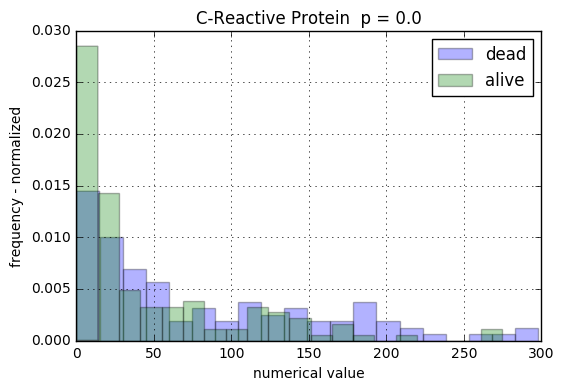

50890 C3
C3 0.0
n =  159


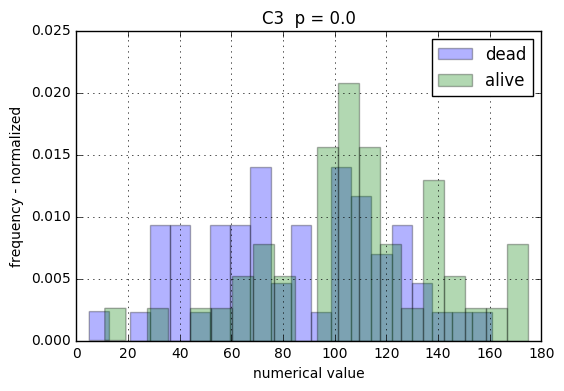

50891 C4
C4 0.0
n =  164


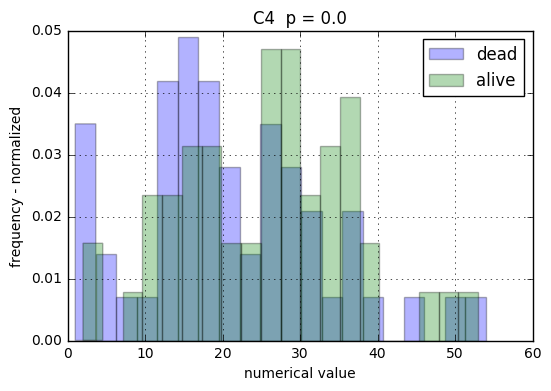

50892 CA-125
CA-125 0.0
n =  49


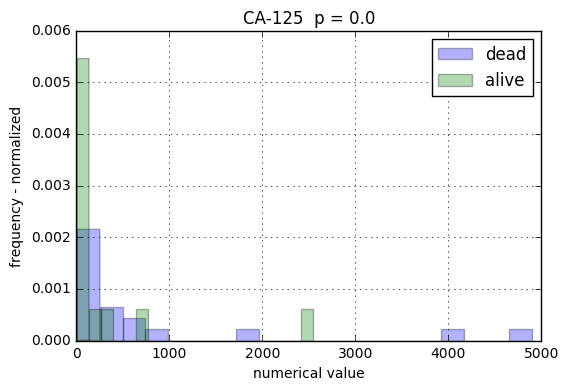

50893 Calcium, Total
Calcium, Total 3.80095084891e-18
n =  6792


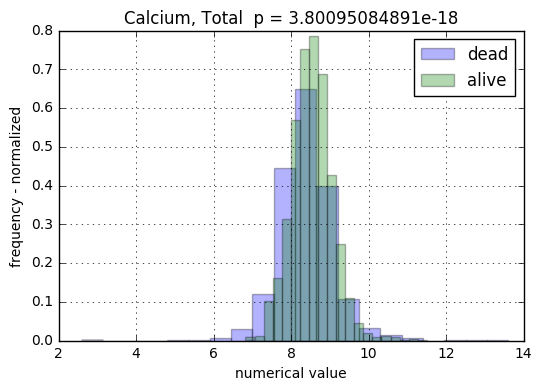

50895 Calculated TBG
Calculated TBG 0.0
n =  67


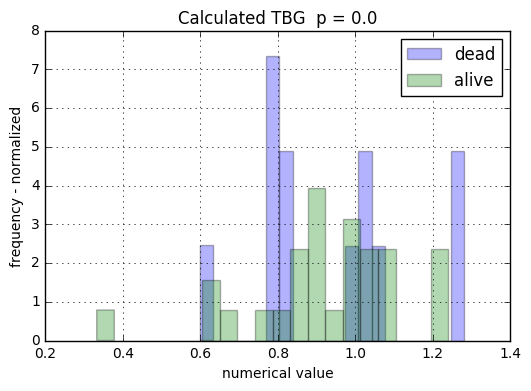

50896 Calculated Thyroxine (T4) Index
Calculated Thyroxine (T4) Index 0.0
n =  67


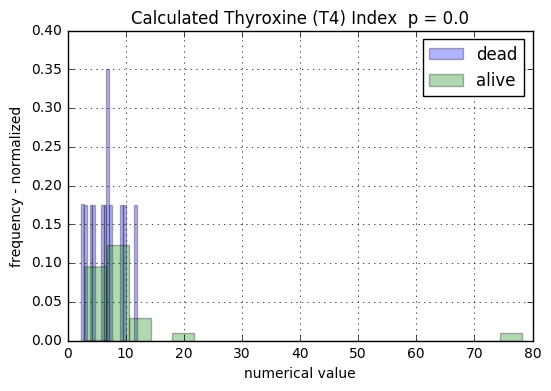

50898 Cancer Antigen 27.29
Cancer Antigen 27.29 0.0
n =  14


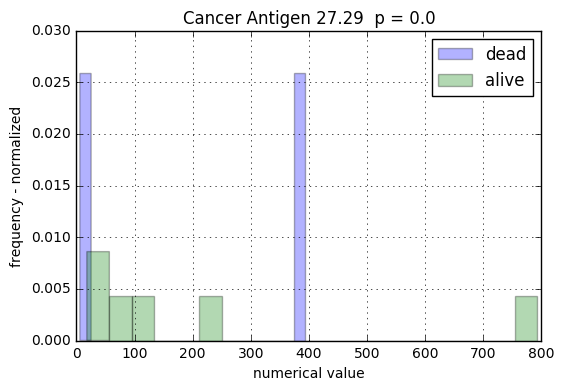

50899 Carbamazepine
Carbamazepine 0.0
n =  10


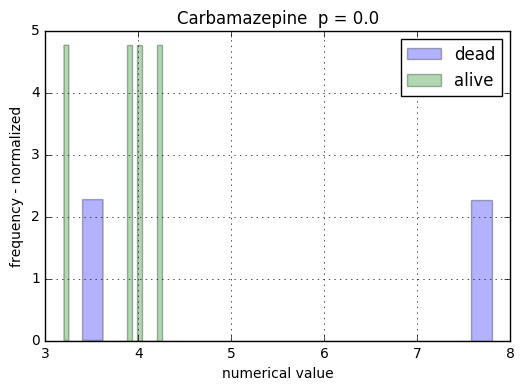

50900 Carcinoembyronic Antigen (CEA)
Carcinoembyronic Antigen (CEA) 0.0
n =  159


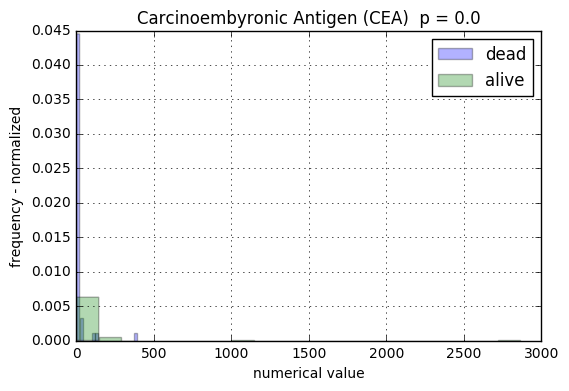

50901 Centromere
Error
50902 Chloride
Chloride 2.38949587003e-06
n =  6934


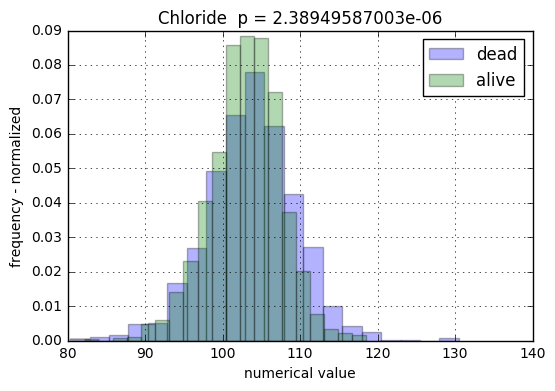

50903 Cholesterol Ratio (Total/HDL)
Cholesterol Ratio (Total/HDL) 1.26759134198e-80
n =  1968


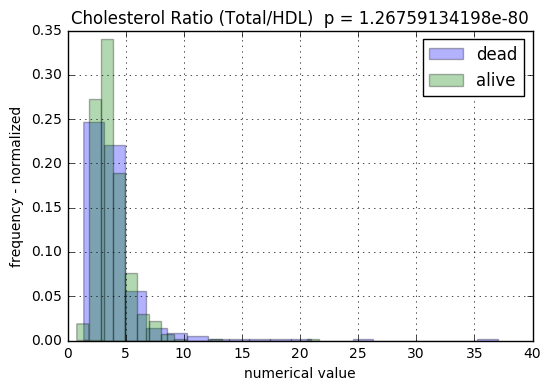

50904 Cholesterol, HDL
Cholesterol, HDL 1.29415463904e-93
n =  1975


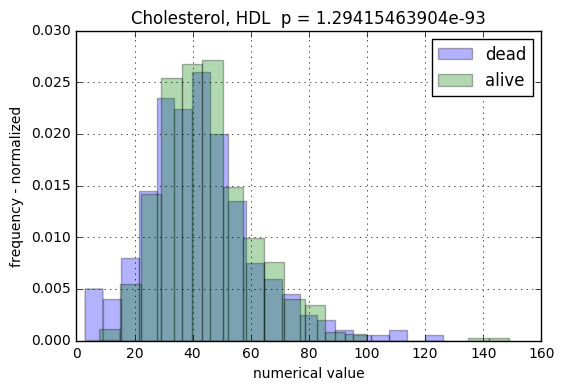

50905 Cholesterol, LDL, Calculated
Cholesterol, LDL, Calculated 2.30003639033e-55
n =  1877


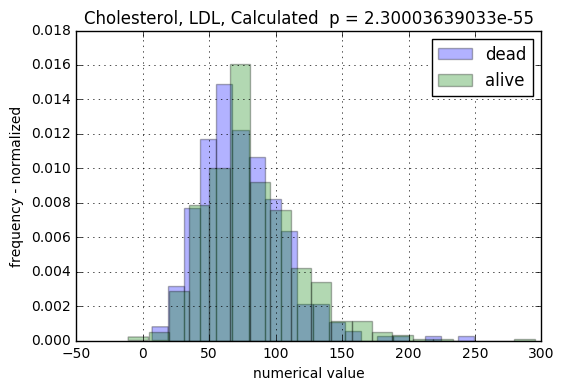

50906 Cholesterol, LDL, Measured
Cholesterol, LDL, Measured 0.0
n =  207


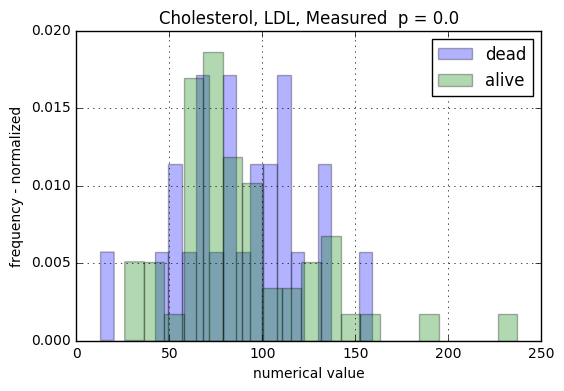

50907 Cholesterol, Total
Cholesterol, Total 3.42077092076e-49
n =  2045


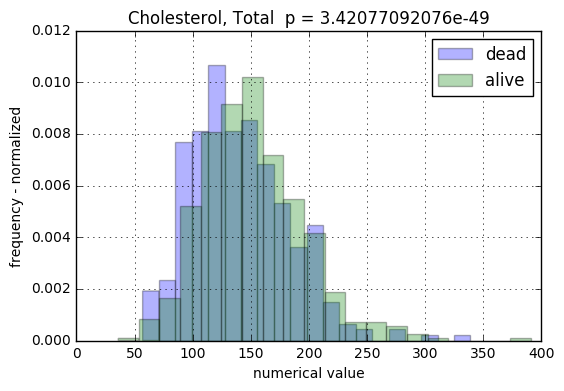

50908 CK-MB Index
CK-MB Index 3.05677636154e-59
n =  1755


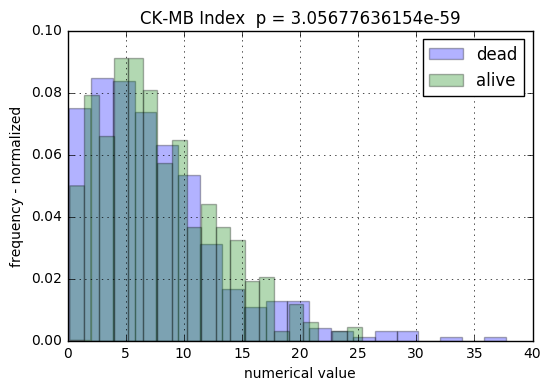

50909 Cortisol
Cortisol 6.85439740065e-64
n =  1087


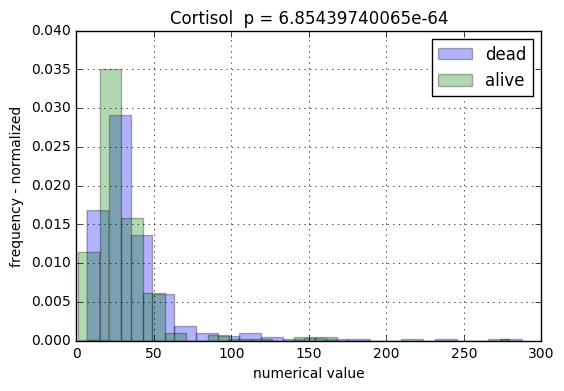

50910 Creatine Kinase (CK)
Creatine Kinase (CK) 0.298187392522
n =  5361


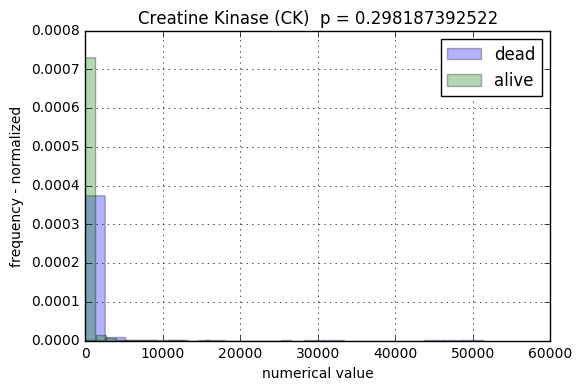

50911 Creatine Kinase, MB Isoenzyme
Creatine Kinase, MB Isoenzyme 9.37667763273e-13
n =  2600


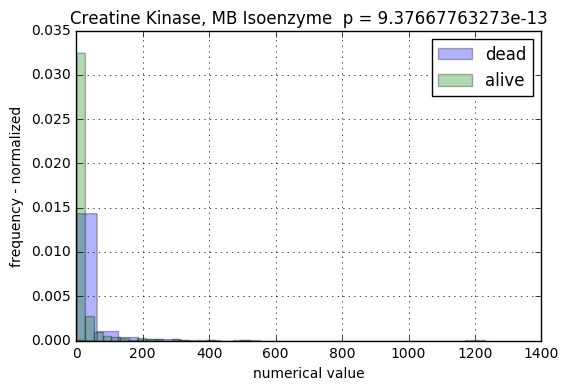

50912 Creatinine
Creatinine 2.35286650214e-25
n =  6927


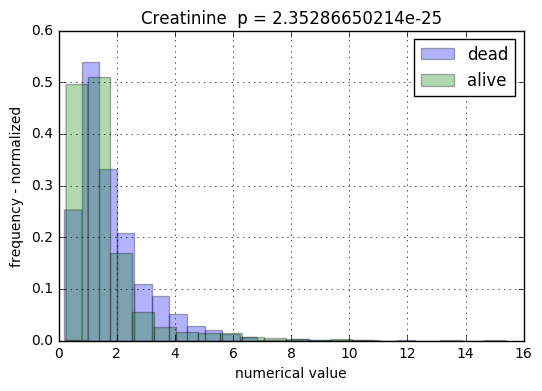

50913 Cryoglobulin
Error
50914 Cyclosporin
Cyclosporin 0.0
n =  40


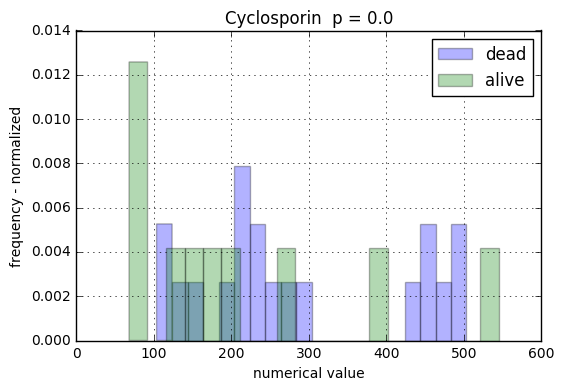

50915 D-Dimer
D-Dimer 0.0
n =  123


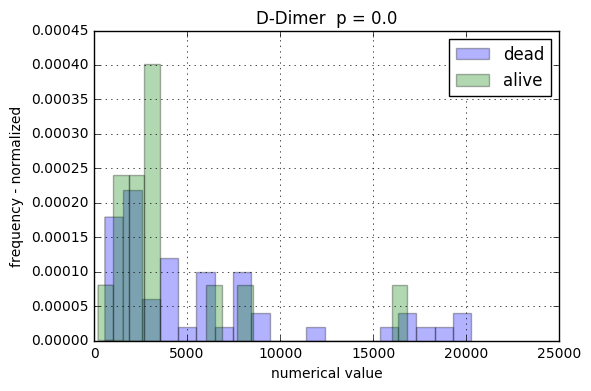

50916 DHEA-Sulfate
DHEA-Sulfate 0.0
n =  5


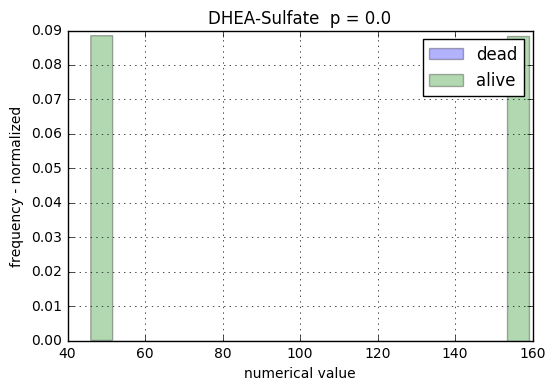

50917 Digoxin
Digoxin 1.07273485601e-196
n =  900


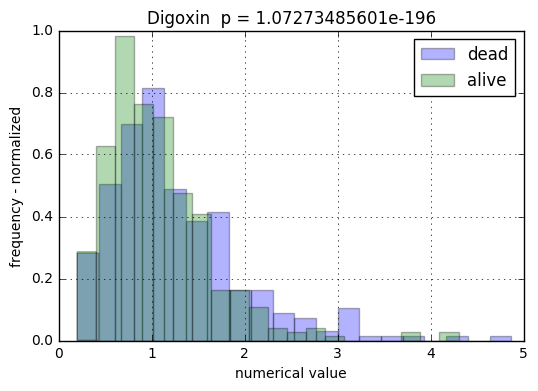

50918 Double Stranded DNA
Error
50919 EDTA Hold
Error
50920 Estimated GFR (MDRD equation)
Error
50922 Ethanol
Ethanol 0.0
n =  35


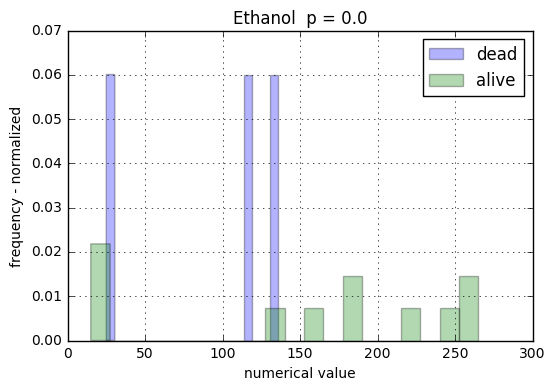

50924 Ferritin
Ferritin 3.8544271513e-126
n =  1904


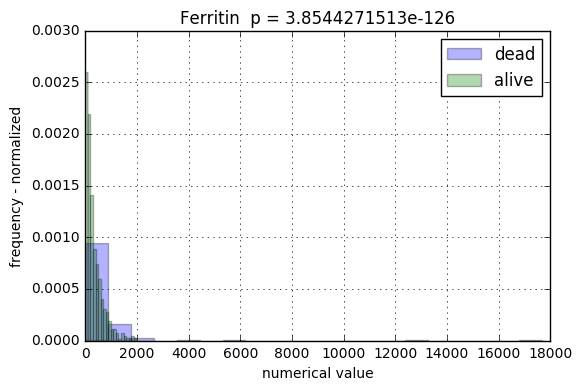

50925 Folate
Folate 1.00039487318e-264
n =  918


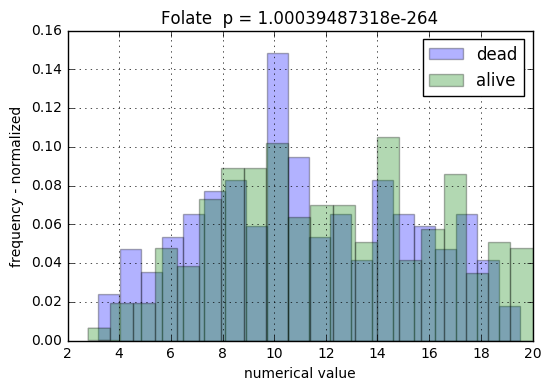

50926 Follicle Stimulating Hormone
Follicle Stimulating Hormone 0.0
n =  19


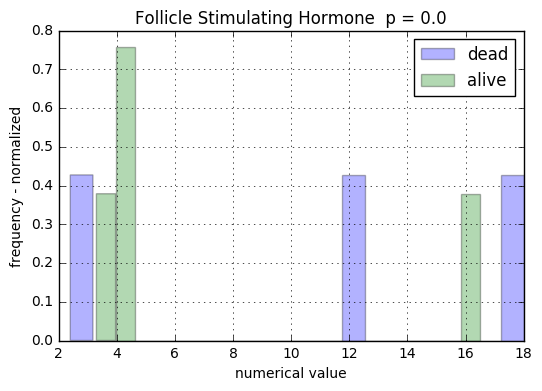

50927 Gamma Glutamyltransferase
Gamma Glutamyltransferase 0.0
n =  247


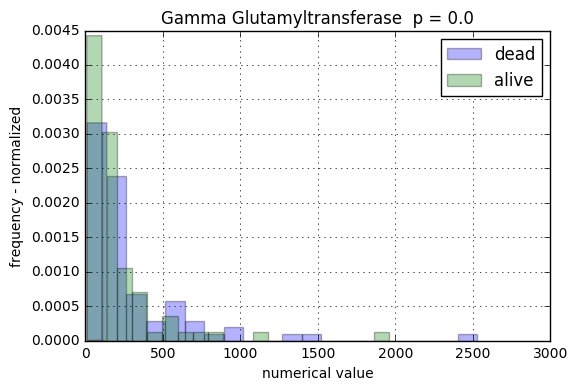

50928 Gastrin
Gastrin 0.0
n =  9


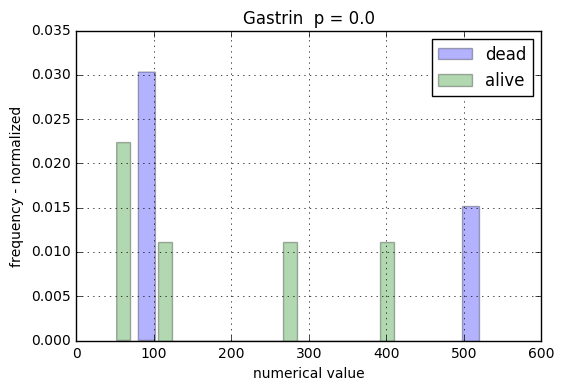

50929 Gentamicin
Gentamicin 0.0
n =  144


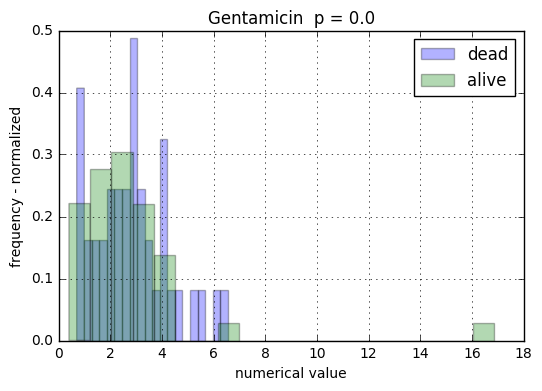

50930 Globulin
Globulin 0.0
n =  652


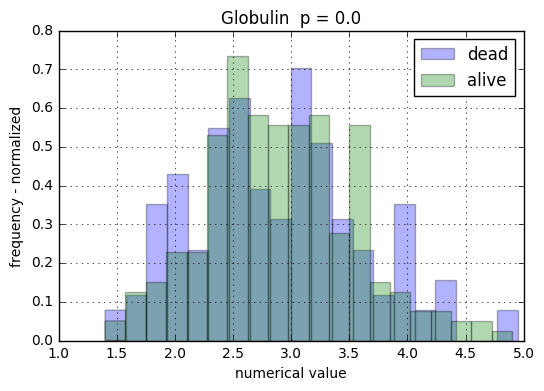

50931 Glucose
Glucose 4.70920165414e-38
n =  6923


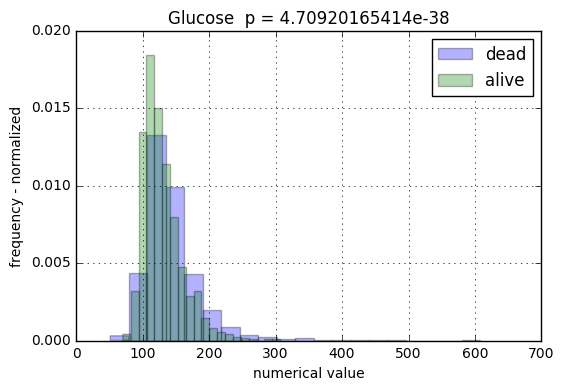

50932 Gray Top Hold (plasma)
Error
50933 Green Top Hold (plasma)
Error
50935 Haptoglobin
Haptoglobin 1.56351560031e-127
n =  1105


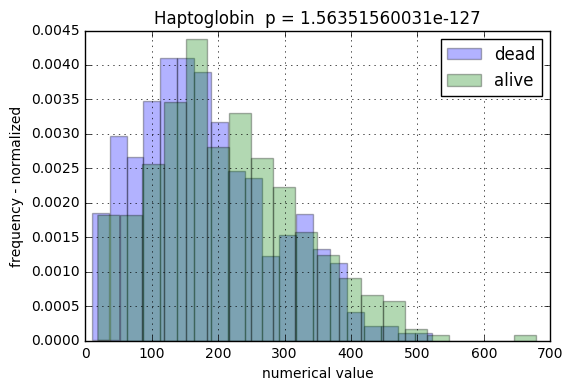

50937 Hepatitis A Virus Antibody
Error
50938 Hepatitis A Virus IgM Antibody
Error
50939 Hepatitis B Core Antibody, IgM
Error
50940 Hepatitis B Surface Antibody
Error
50941 Hepatitis B Surface Antigen
Error
50942 Hepatitis B Virus Core Antibody
Error
50943 Hepatitis C Virus Antibody
Error
50944 HIV Antibody
Error
50945 Homocysteine
Homocysteine 0.0
n =  71


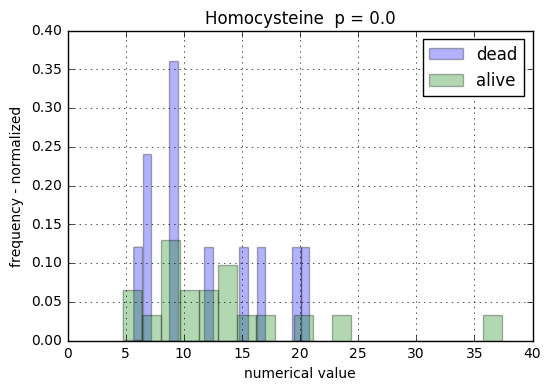

50946 Human Chorionic Gonadotropin
Human Chorionic Gonadotropin 0.0
n =  3


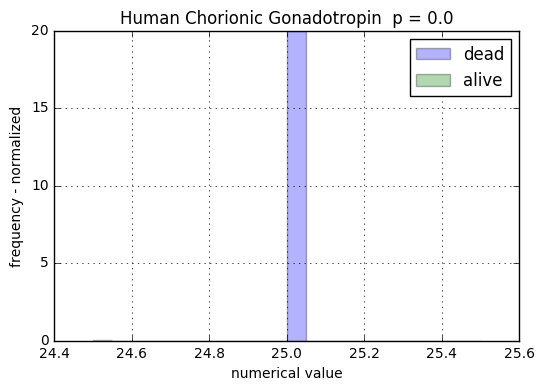

50948 Immunofixation
Error
50949 Immunoglobulin A
Immunoglobulin A 0.0
n =  269


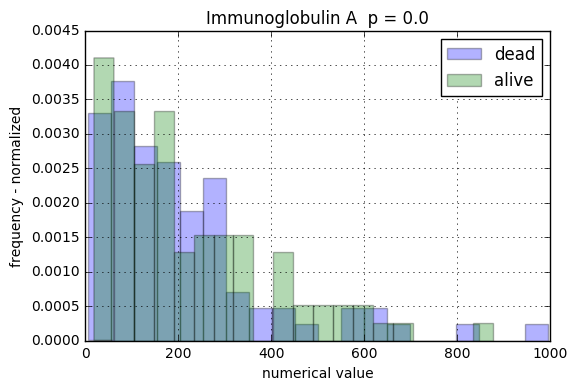

50950 Immunoglobulin G
Immunoglobulin G 0.0
n =  310


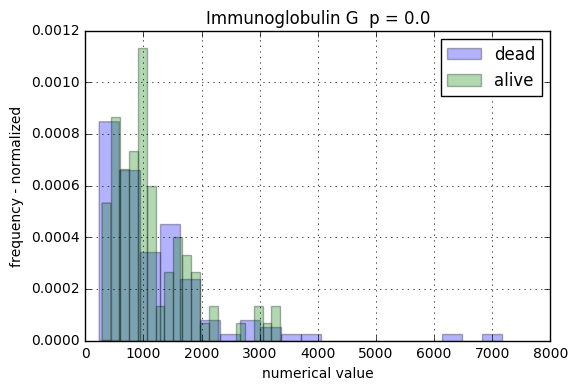

50951 Immunoglobulin M
Immunoglobulin M 0.0
n =  265


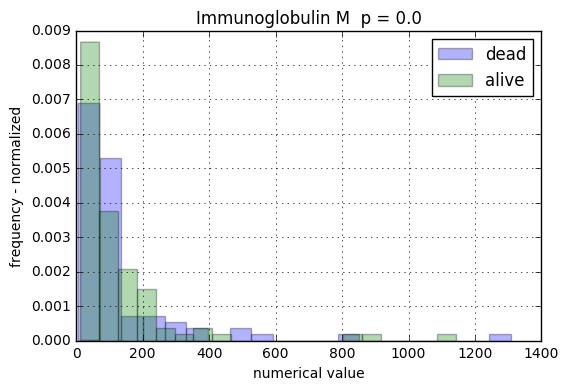

50952 Iron
Iron 6.52177757744e-90
n =  2026


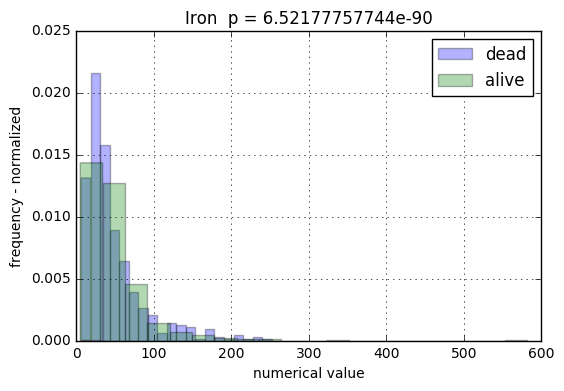

50953 Iron Binding Capacity, Total
Iron Binding Capacity, Total 3.32099528002e-87
n =  1961


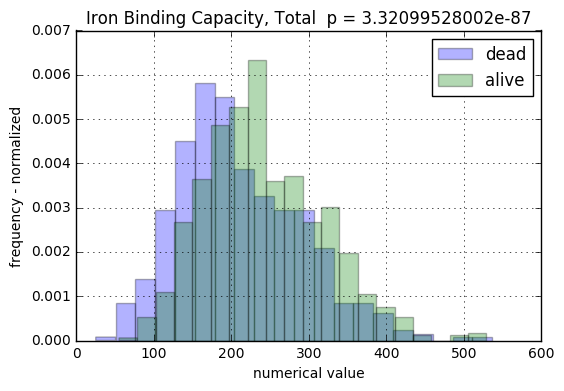

50954 Lactate Dehydrogenase (LD)
Lactate Dehydrogenase (LD) 0.119256456283
n =  4122


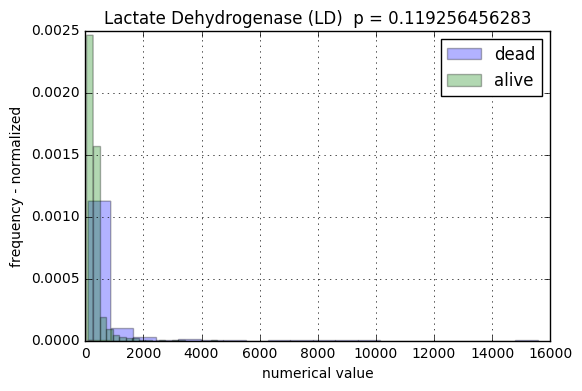

50955 Light Green Top Hold
Error
50956 Lipase
Lipase 0.201915846673
n =  3090


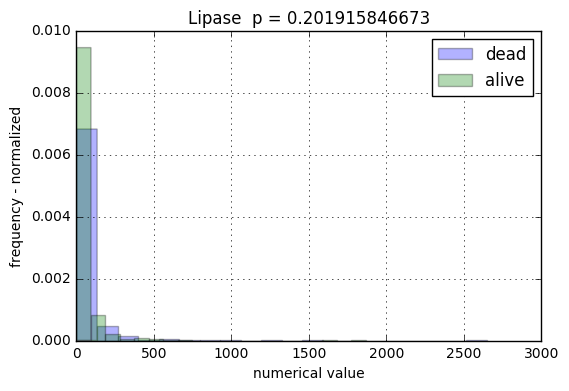

50957 Lithium
Lithium 0.0
n =  13


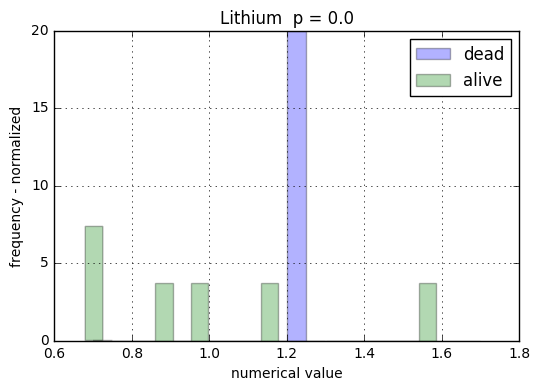

50958 Luteinizing Hormone
Luteinizing Hormone 0.0
n =  11


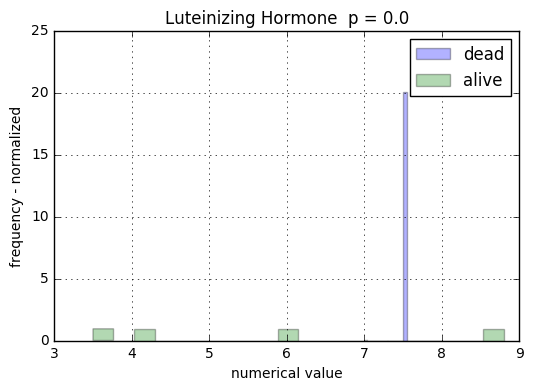

50959 Macro Prolactin
Error
50960 Magnesium
Magnesium 1.6005100996e-13
n =  6898


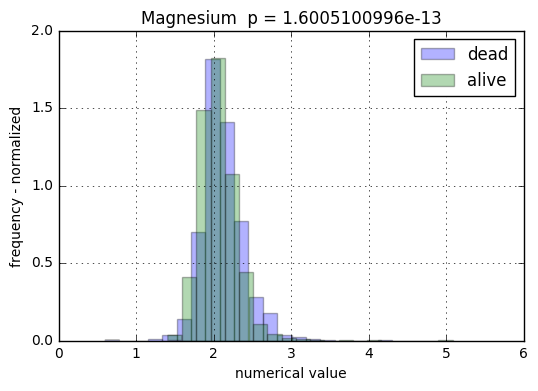

50962 N-Acetylprocainamide (NAPA)
N-Acetylprocainamide (NAPA) 0.0
n =  15


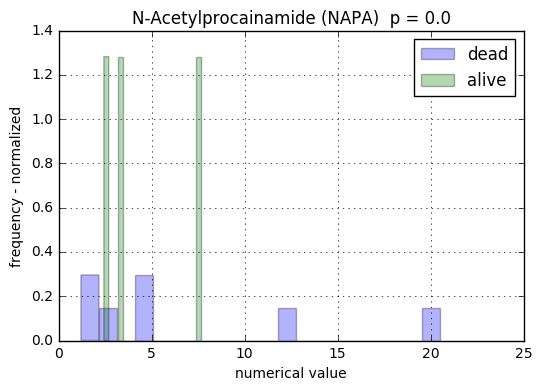

50963 NTproBNP
NTproBNP 1.0157465434e-167
n =  1335


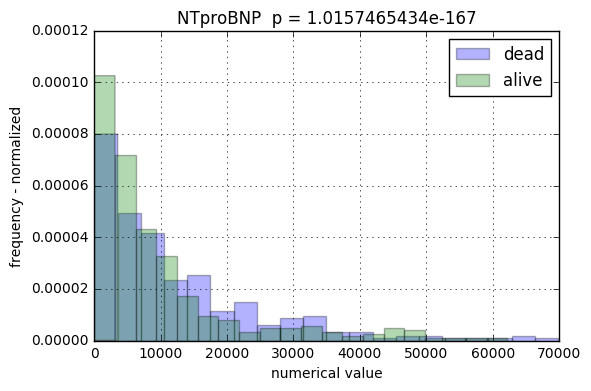

50964 Osmolality, Measured
Osmolality, Measured 2.89992895909e-239
n =  685


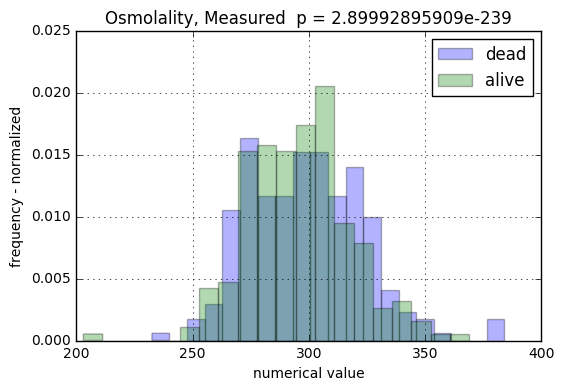

50965 Parathyroid Hormone
Parathyroid Hormone 0.0
n =  338


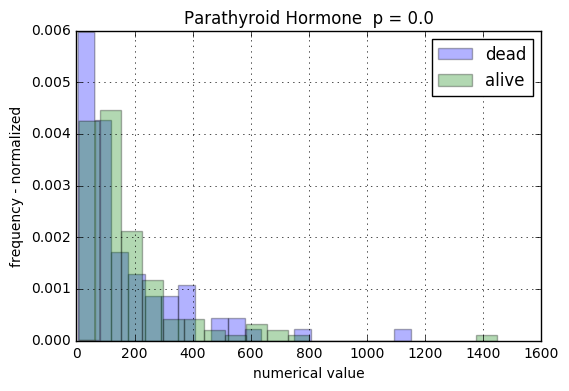

50966 Phenobarbital
Phenobarbital 0.0
n =  18


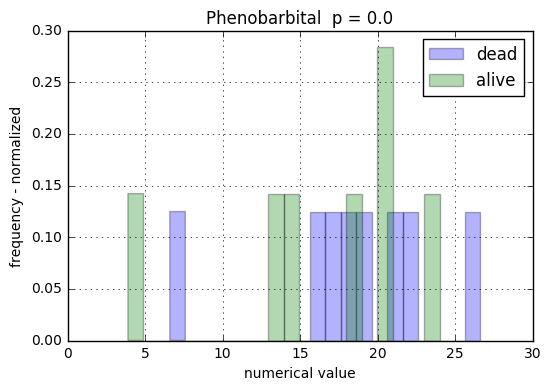

50967 Phenytoin
Phenytoin 0.0
n =  332


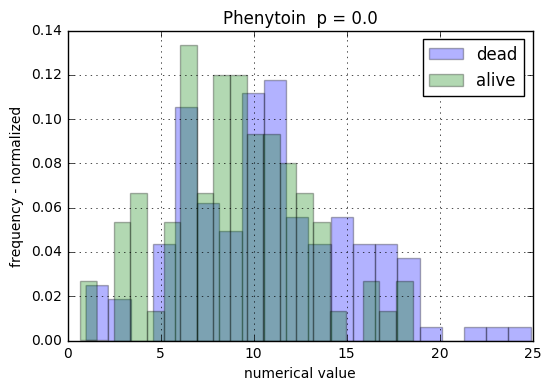

50968 Phenytoin, Free
Phenytoin, Free 0.0
n =  50


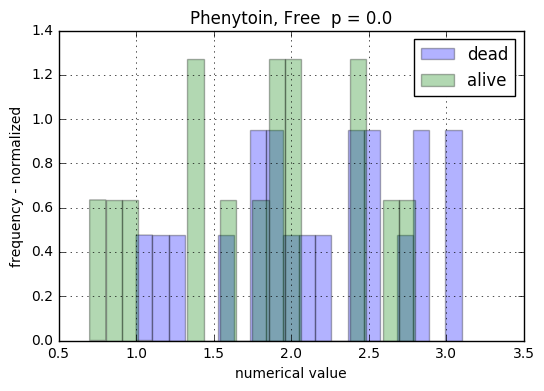

50969 Phenytoin, Percent Free
Phenytoin, Percent Free 0.0
n =  59


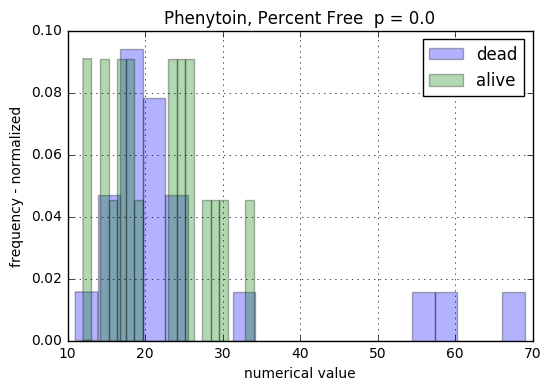

50970 Phosphate
Phosphate 1.53908674675e-28
n =  6795


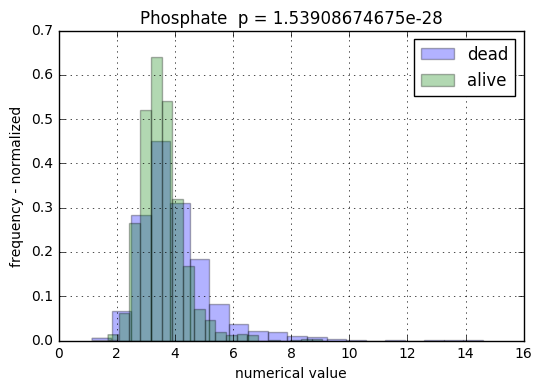

50971 Potassium
Potassium 0.00380490611811
n =  6877


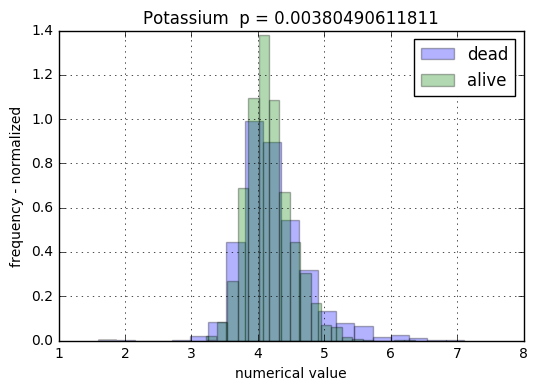

50972 Procainamide
Procainamide 0.0
n =  15


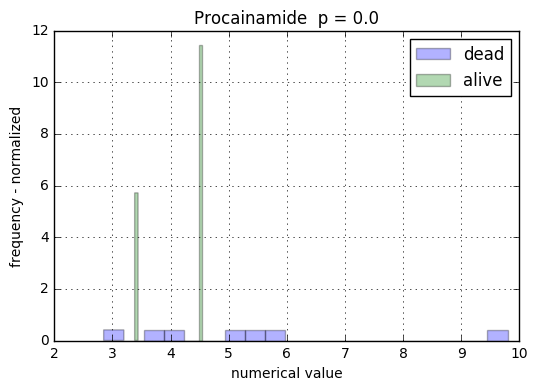

50973 Prolactin
Prolactin 0.0
n =  23


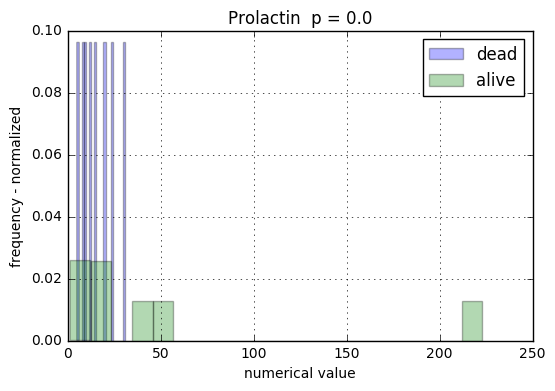

50974 Prostate Specific Antigen
Prostate Specific Antigen 0.0
n =  217


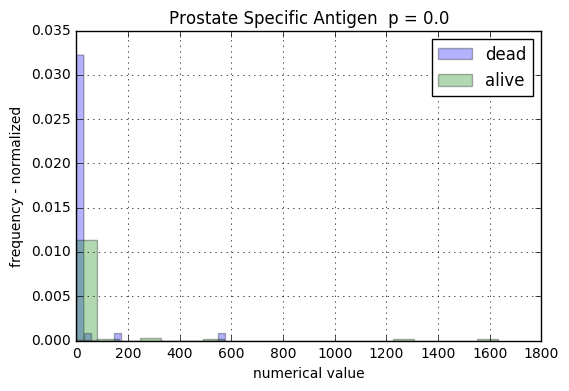

50975 Protein Electrophoresis
Error
50976 Protein, Total
Protein, Total 2.7112237161e-188
n =  1123


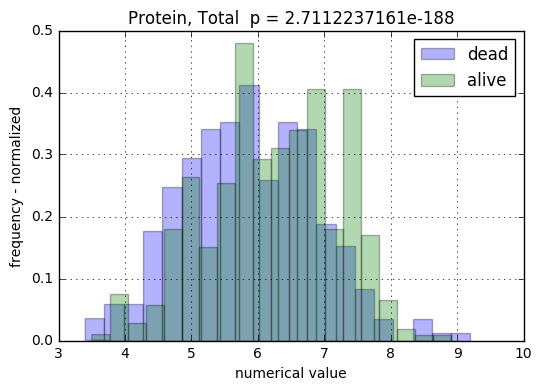

50977 Quinidine
Quinidine 0.0
n =  3


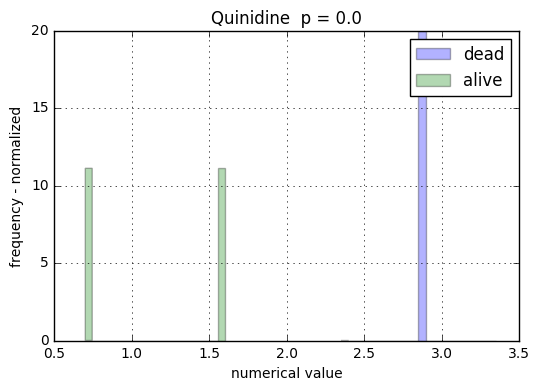

50978 Rapamycin
Rapamycin 0.0
n =  12


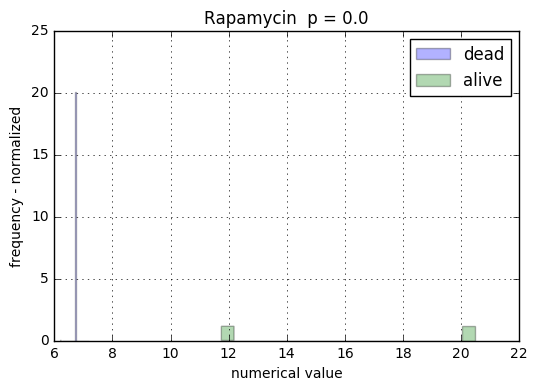

50979 Red Top Hold
Error
50980 Rheumatoid Factor
Rheumatoid Factor 0.0
n =  108


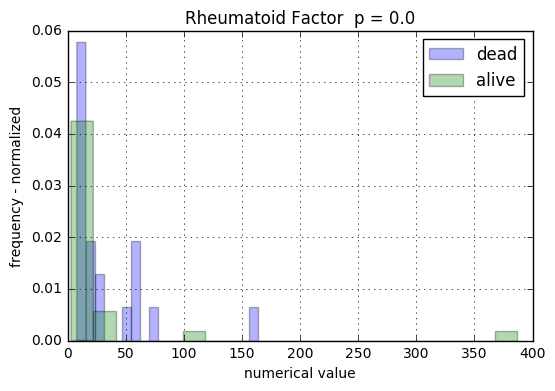

50981 Salicylate
Salicylate 0.0
n =  11


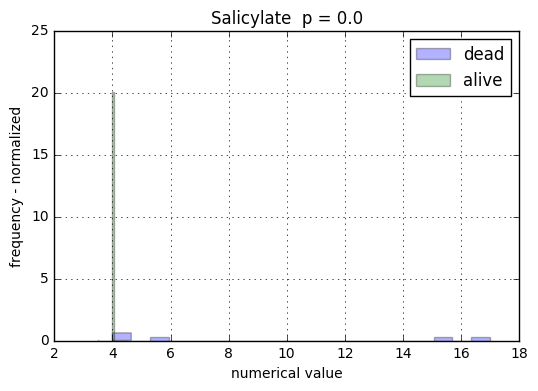

50983 Sodium
Sodium 0.0117684452075
n =  6932


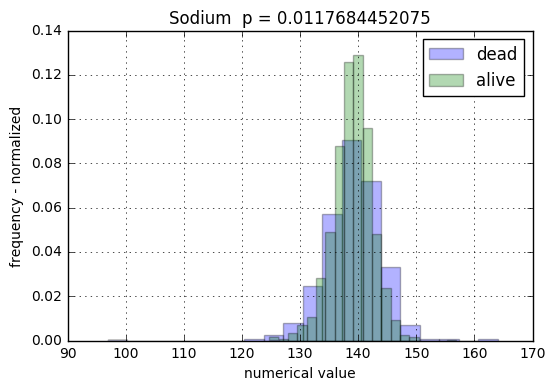

50986 tacroFK
tacroFK 0.0
n =  52


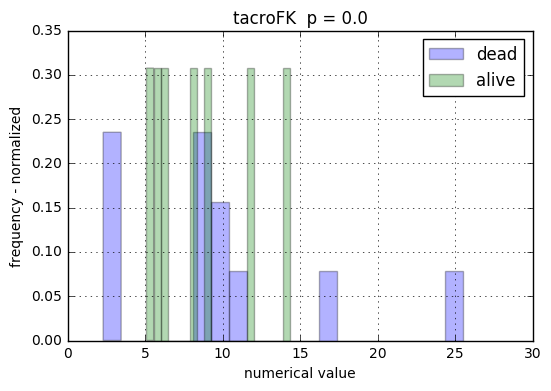

50988 Testosterone
Testosterone 0.0
n =  32


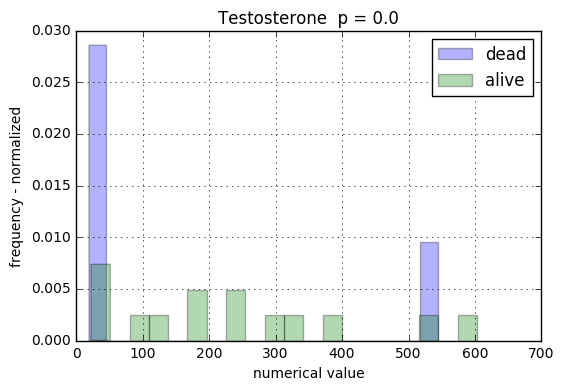

50989 Testosterone, Free
Testosterone, Free 0.0
n =  25


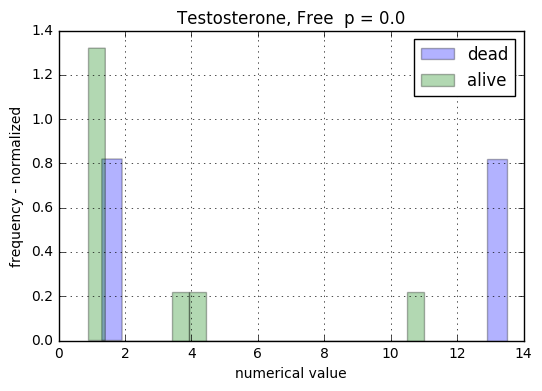

50990 Theophylline
Theophylline 0.0
n =  26


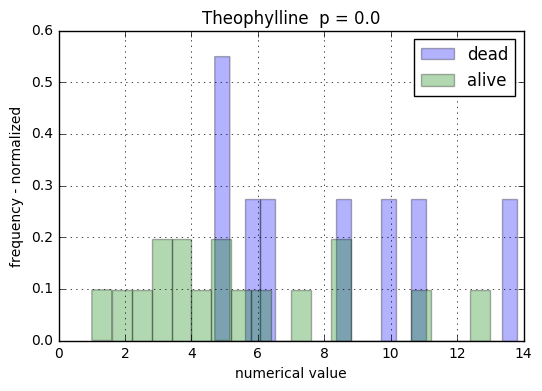

50991 Thyroglobulin
Thyroglobulin 0.0
n =  12


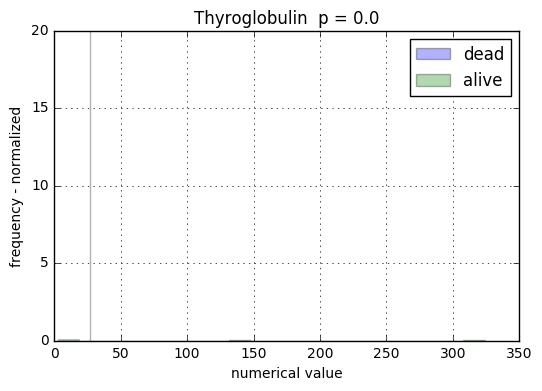

50992 Thyroid Peroxidase Antibodies
Thyroid Peroxidase Antibodies 0.0
n =  11


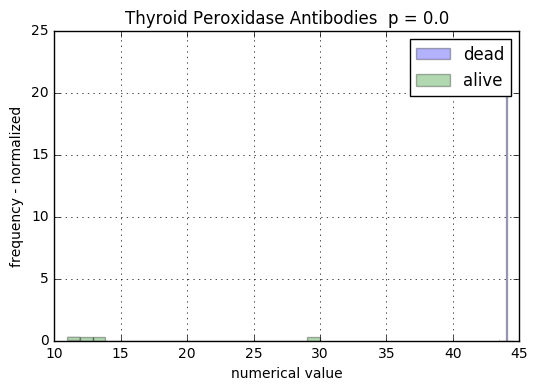

50993 Thyroid Stimulating Hormone
Thyroid Stimulating Hormone 5.05555077005e-40
n =  2803


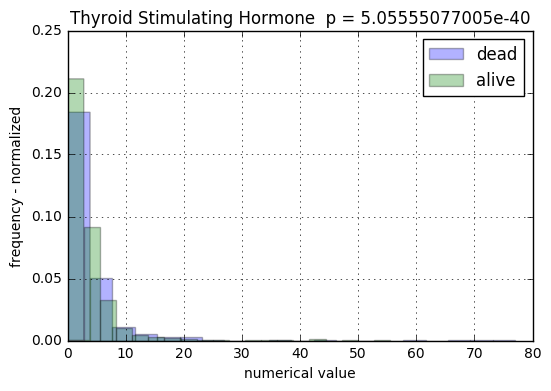

50994 Thyroxine (T4)
Thyroxine (T4) 0.0
n =  400


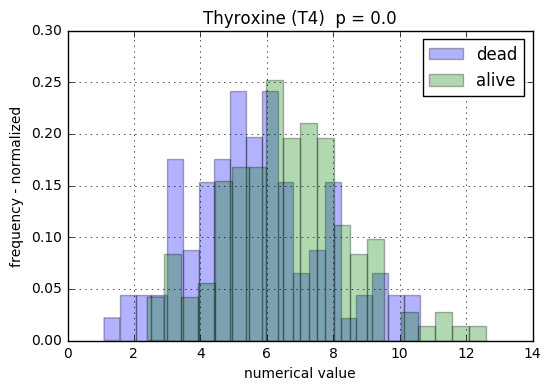

50995 Thyroxine (T4), Free
Thyroxine (T4), Free 7.56065351525e-240
n =  871


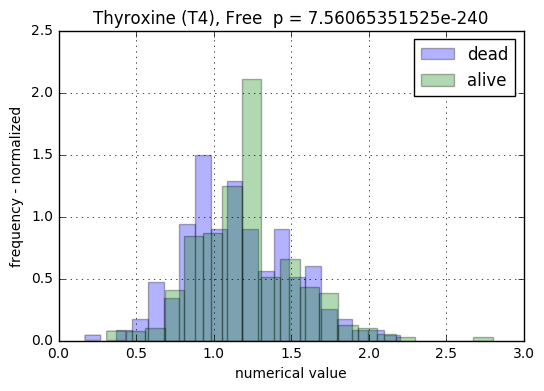

50996 Tissue Transglutaminase Ab, IgA
Tissue Transglutaminase Ab, IgA 0.0
n =  45


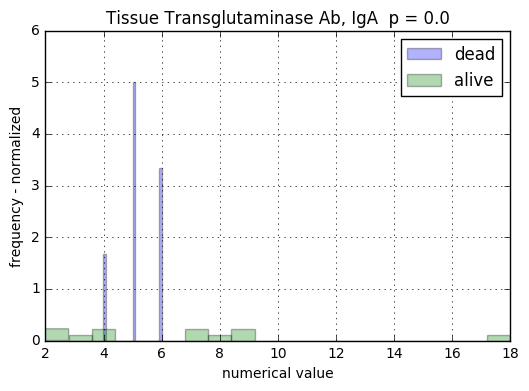

50998 Transferrin
Transferrin 4.79479666744e-88
n =  1958


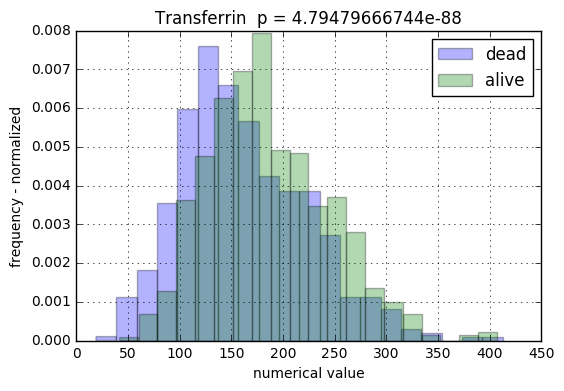

50999 Tricyclic Antidepressant Screen
Error
51000 Triglycerides
Triglycerides 2.29425200545e-68
n =  2319


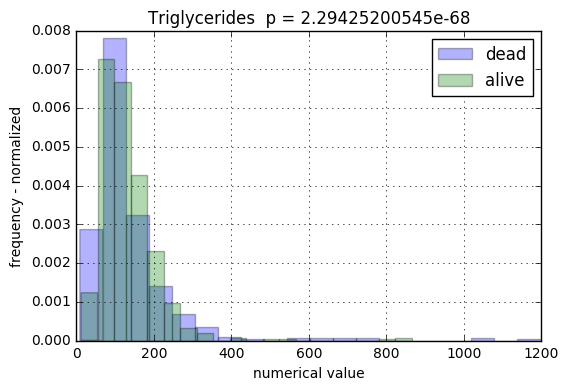

51001 Triiodothyronine (T3)
Triiodothyronine (T3) 0.0
n =  264


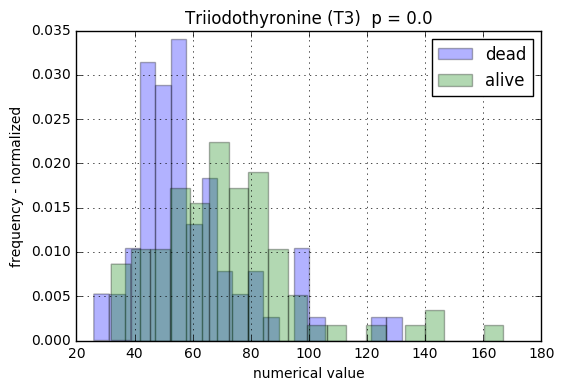

51002 Troponin I
Troponin I 0.0
n =  217


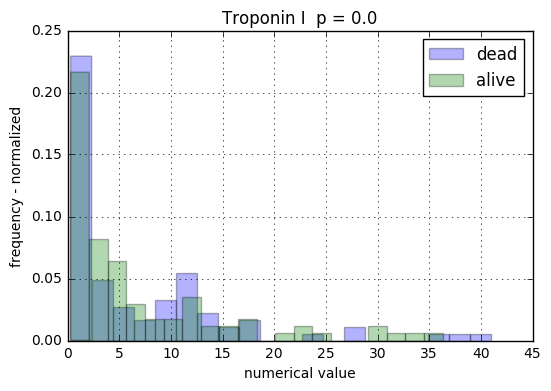

51003 Troponin T
Troponin T 0.0302396628001
n =  2941


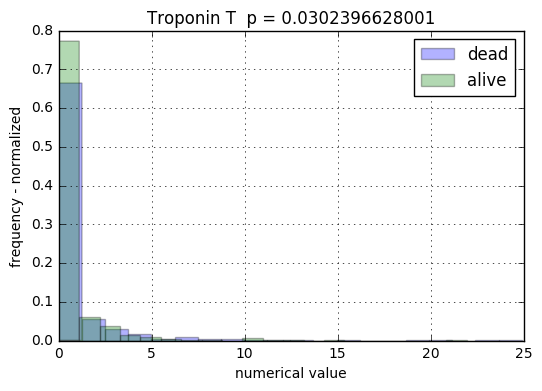

51005 Uptake Ratio
Uptake Ratio 0.0
n =  67


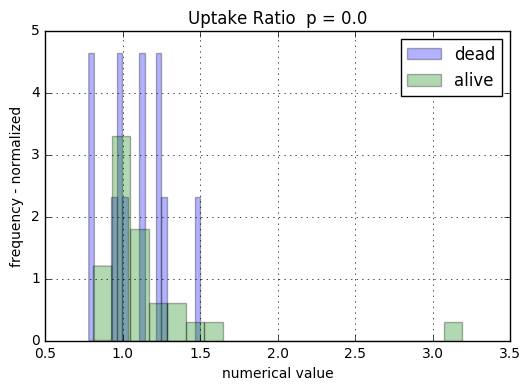

51006 Urea Nitrogen
Urea Nitrogen 4.22560788178e-49
n =  6932


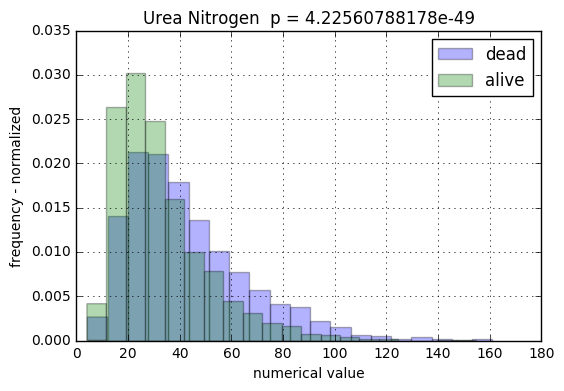

51007 Uric Acid
Uric Acid 1.59365353212e-219
n =  728


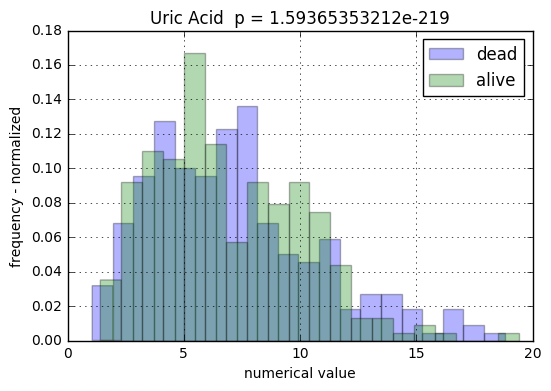

51008 Valproic Acid
Valproic Acid 0.0
n =  57


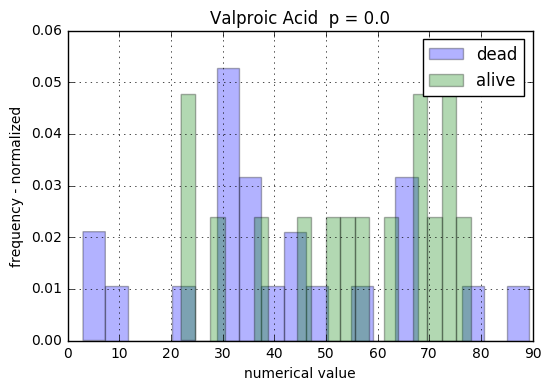

51009 Vancomycin
Vancomycin 3.20536797626e-06
n =  1903


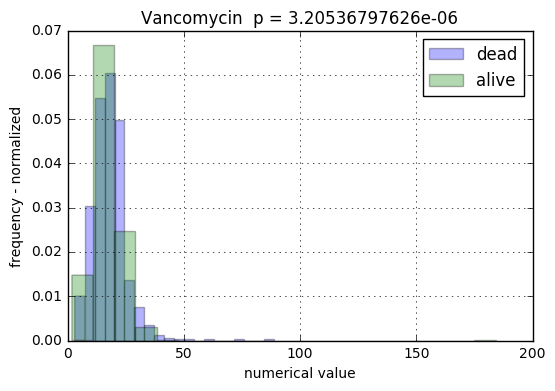

51010 Vitamin B12
Vitamin B12 4.30399406724e-209
n =  1464


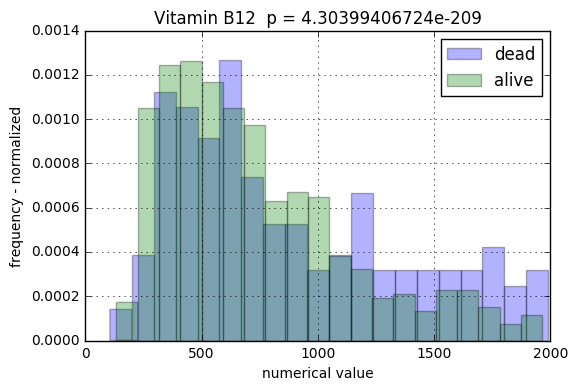

51011 <Albumin>
<Albumin> 0.0
n =  5


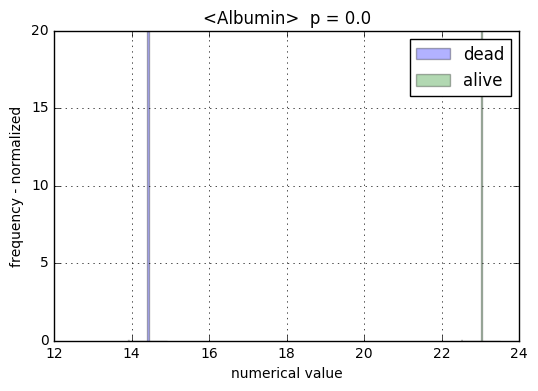

51014 Glucose, CSF
Glucose, CSF 0.0
n =  218


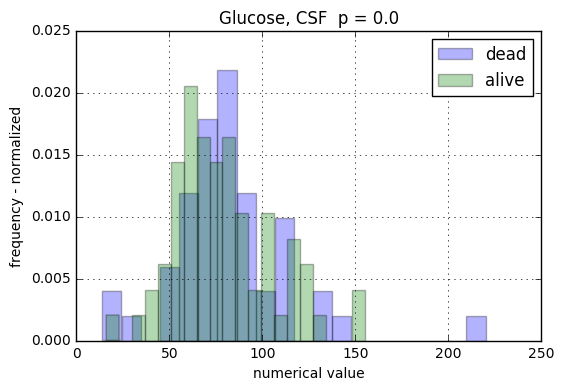

51015 Lactate Dehydrogenase, CSF
Lactate Dehydrogenase, CSF 0.0
n =  60


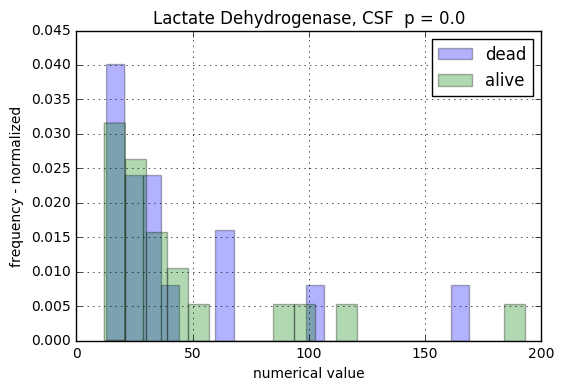

51017 PEP, CSF
Error
51018 Total Protein, CSF
Total Protein, CSF 0.0
n =  223


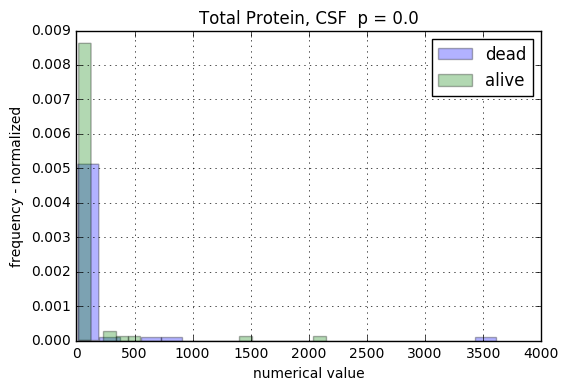

51020 Amylase, Joint Fluid
Amylase, Joint Fluid 0.0
n =  1


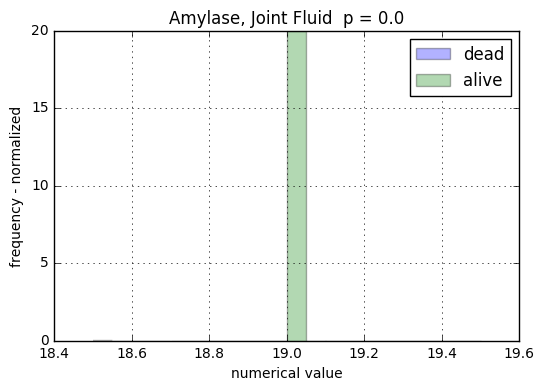

51022 Glucose, Joint Fluid
Glucose, Joint Fluid 0.0
n =  6


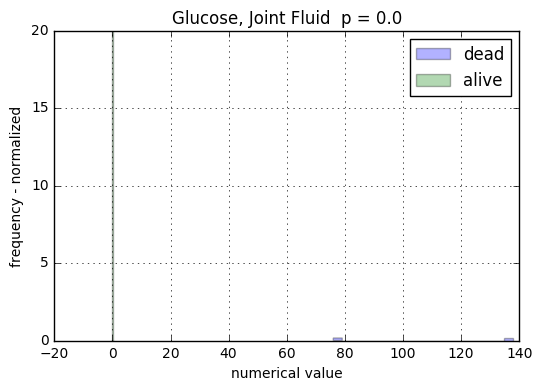

51025 Albumin, Body Fluid
Albumin, Body Fluid 0.0
n =  39


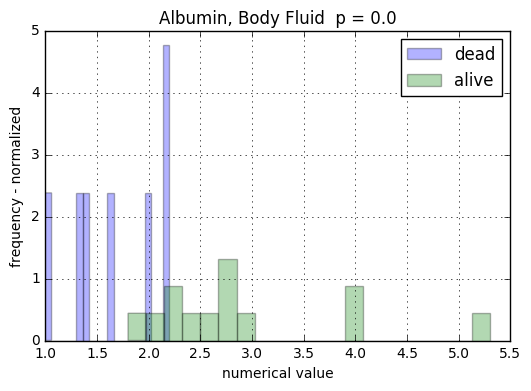

51026 Amylase, Body Fluid
Amylase, Body Fluid 0.0
n =  53


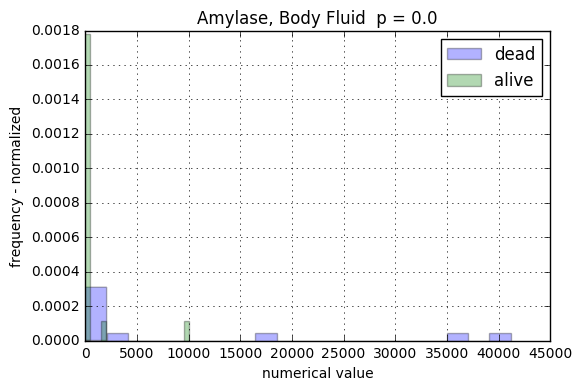

51027 Bicarbonate, Other Fluid
Bicarbonate, Other Fluid 0.0
n =  6


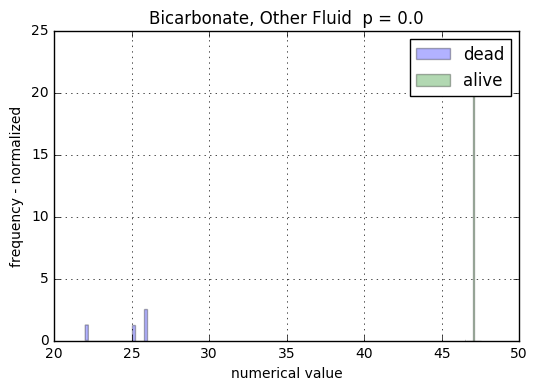

51028 Bilirubin, Total, Body Fluid
Bilirubin, Total, Body Fluid 0.0
n =  15


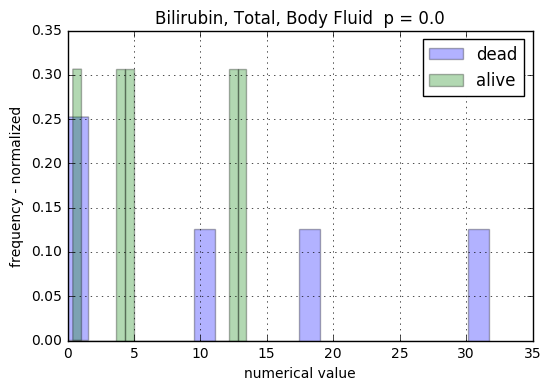

51030 Chloride, Body Fluid
Chloride, Body Fluid 0.0
n =  6


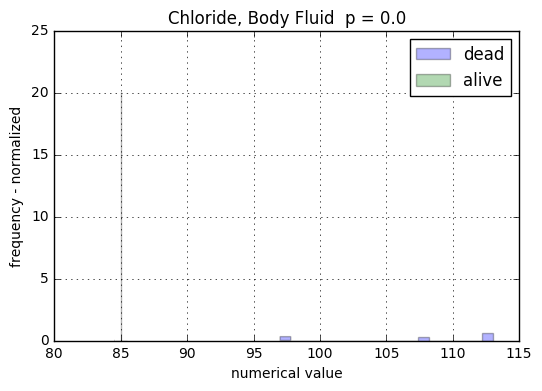

51032 Creatinine, Body Fluid
Creatinine, Body Fluid 0.0
n =  20


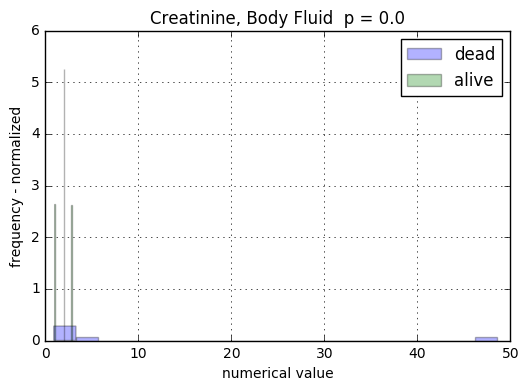

51034 Glucose, Body Fluid
Glucose, Body Fluid 0.0
n =  45


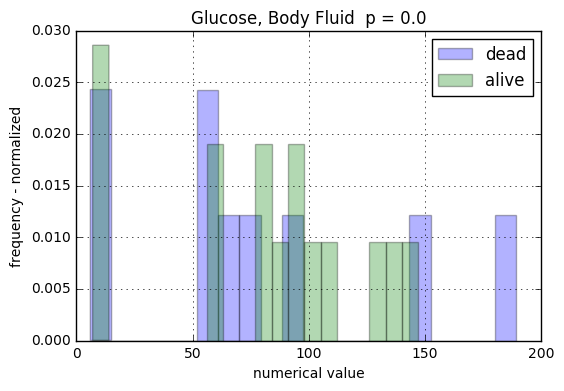

51035 LD, Body Fluid
LD, Body Fluid 0.0
n =  43


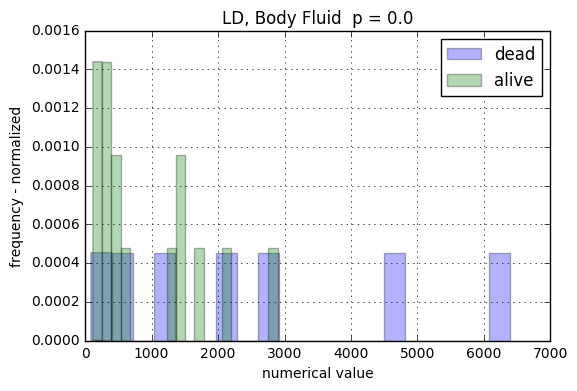

51036 Lipase, Body Fluid
Lipase, Body Fluid 0.0
n =  3


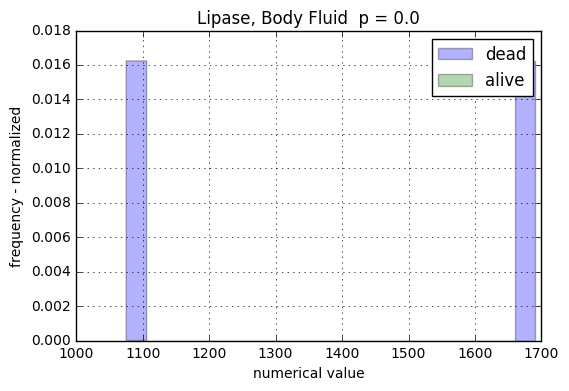

51039 Osmolality, Body Fluid
Osmolality, Body Fluid 0.0
n =  2


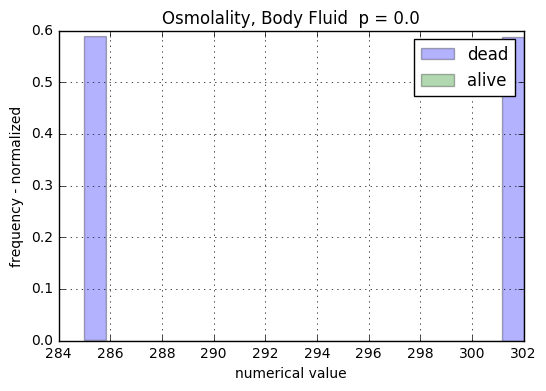

51040 Phosphate, Body Fluid
Phosphate, Body Fluid 0.0
n =  4


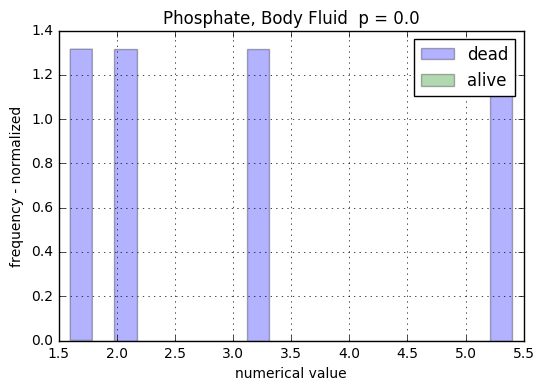

51041 Potassium, Body Fluid
Potassium, Body Fluid 0.0
n =  7


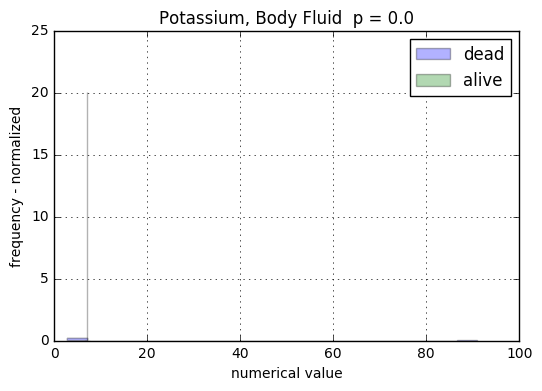

51042 Sodium, Body Fluid
Sodium, Body Fluid 0.0
n =  7


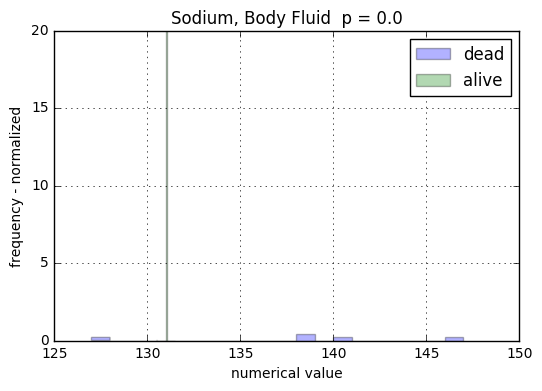

51043 Total Protein, Body Fluid
Total Protein, Body Fluid 0.0
n =  45


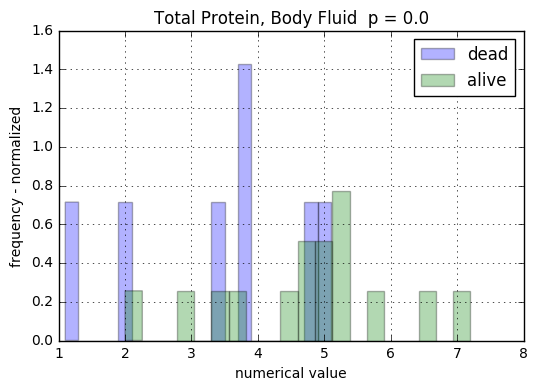

51044 Triglycer
Triglycer 0.0
n =  1


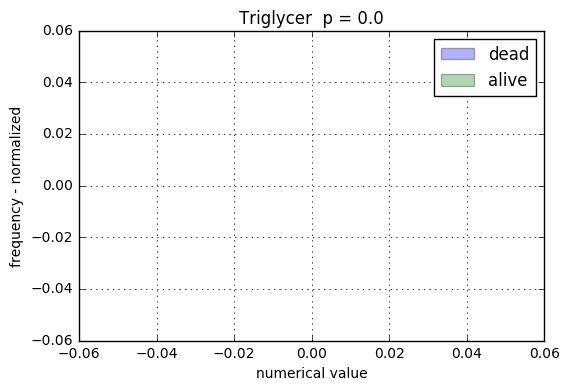

51045 Urea Nitrogen, Body Fluid
Urea Nitrogen, Body Fluid 0.0
n =  12


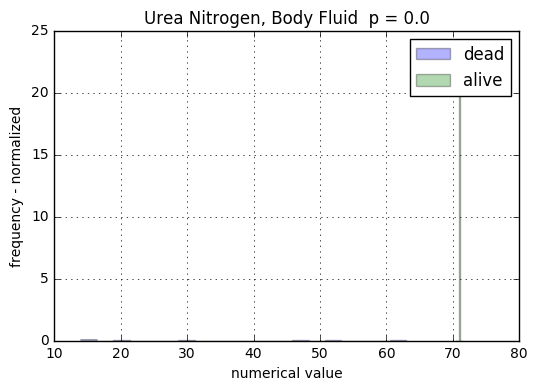

51046 Albumin, Pleural
Albumin, Pleural 0.0
n =  143


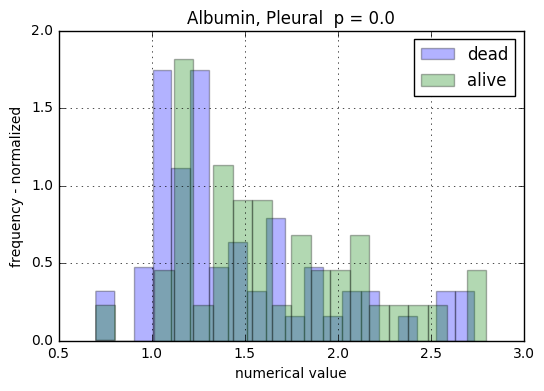

51047 Amylase, Pleural
Amylase, Pleural 0.0
n =  106


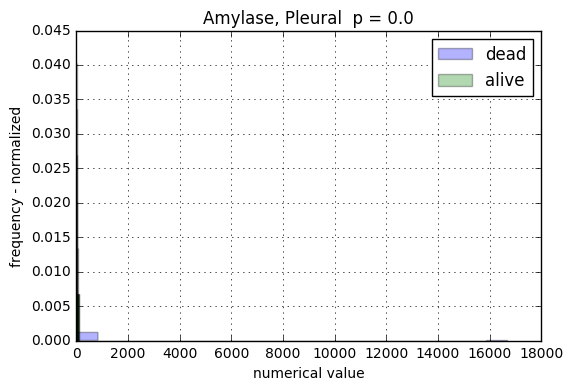

51049 Bilirubin, Total, Pleural
Bilirubin, Total, Pleural 0.0
n =  8


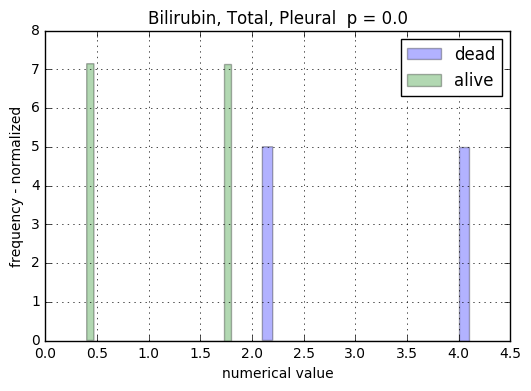

51051 Cholesterol, Pleural
Cholesterol, Pleural 0.0
n =  45


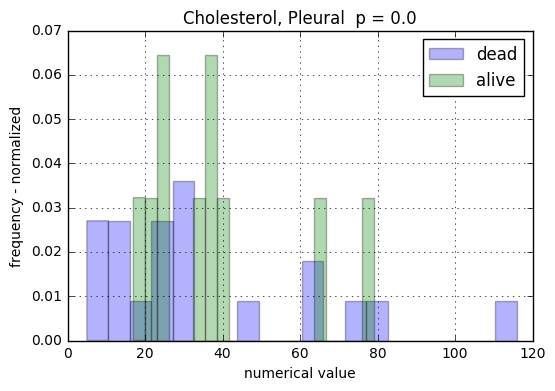

51052 Creatinine, Pleural
Creatinine, Pleural 0.0
n =  56


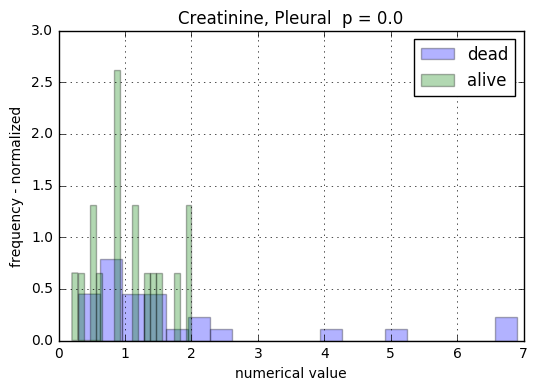

51053 Glucose, Pleural
Glucose, Pleural 0.0
n =  320


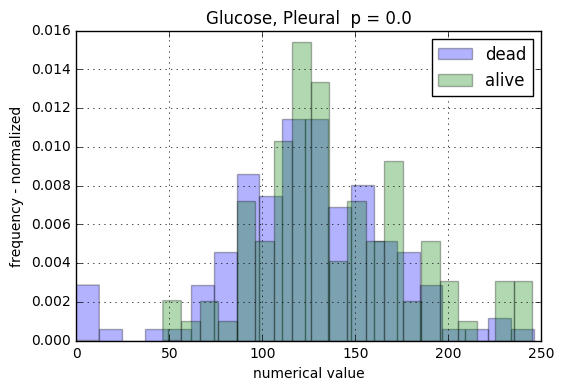

51054 Lactate Dehydrogenase, Pleural
Lactate Dehydrogenase, Pleural 9.80598240203e-298
n =  362


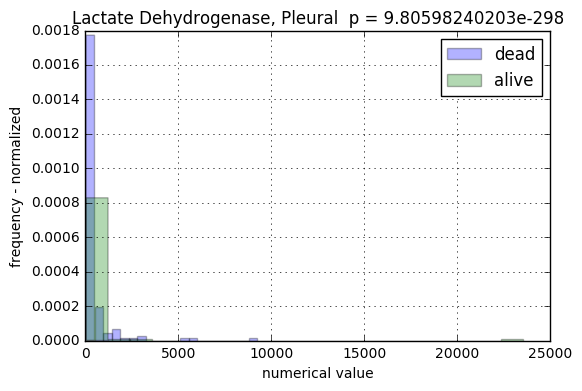

51056 Miscellaneous, Pleural
Error
51057 Potassium, Pleural
Potassium, Pleural 0.0
n =  1


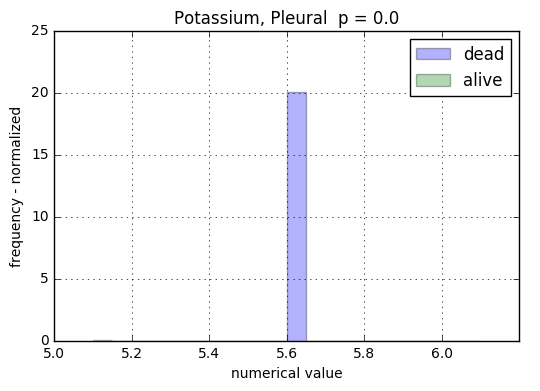

51058 Sodium, Pleural
Sodium, Pleural 0.0
n =  1


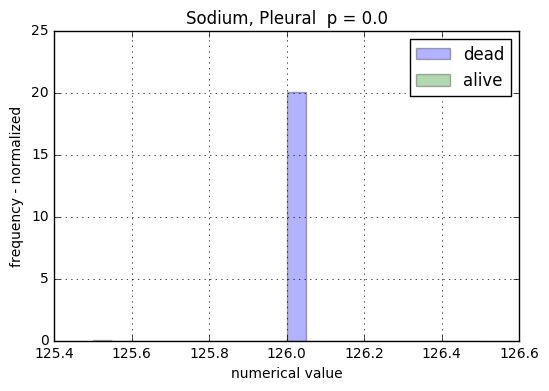

51059 Total Protein, Pleural
Total Protein, Pleural 1.49020827638e-294
n =  364


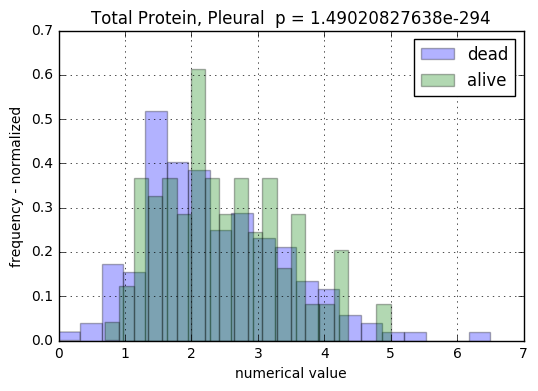

51060 Triglycerides, Pleural
Triglycerides, Pleural 0.0
n =  27


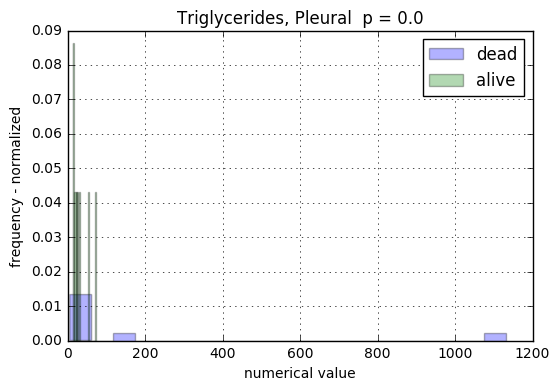

51063 Osmolality, Stool
Osmolality, Stool 0.0
n =  7


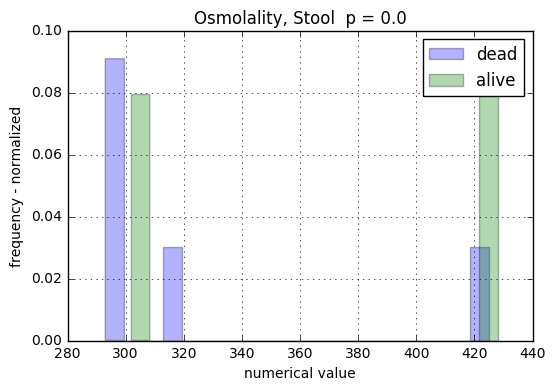

51064 Potassium, Stool
Potassium, Stool 0.0
n =  10


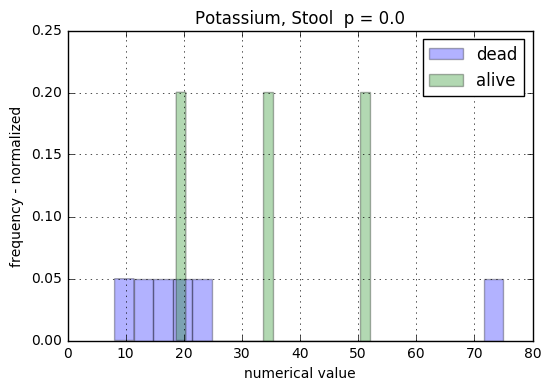

51065 Sodium, Stool
Sodium, Stool 0.0
n =  10


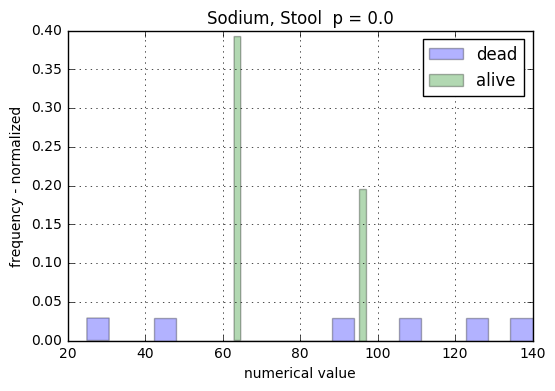

51067 24 hr Creatinine
24 hr Creatinine 0.0
n =  70


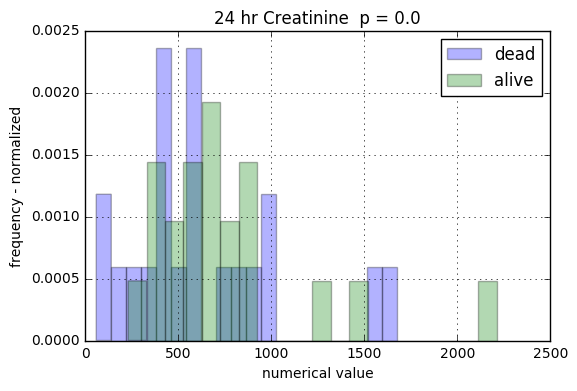

51068 24 hr Protein
24 hr Protein 0.0
n =  27


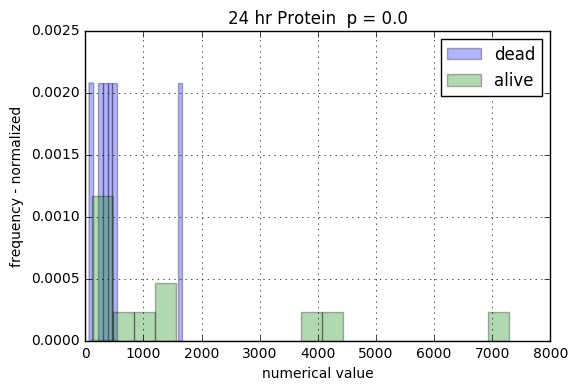

51069 Albumin, Urine
Albumin, Urine 0.0
n =  187


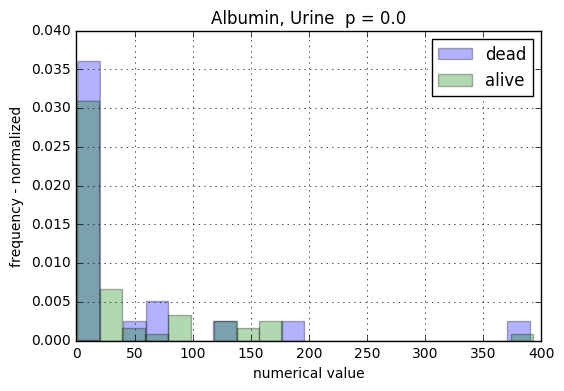

51070 Albumin/Creatinine, Urine
Albumin/Creatinine, Urine 0.0
n =  200


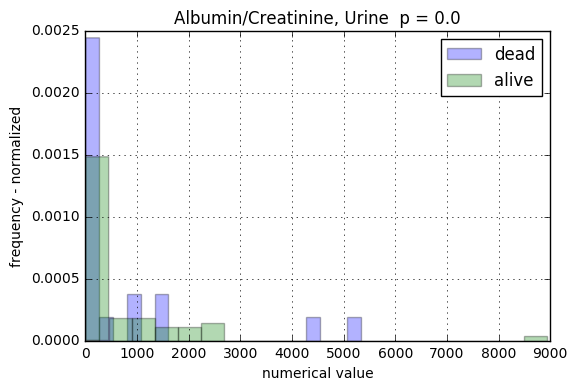

51071 Amphetamine Screen, Urine
Error
51072 Amylase, Urine
Amylase, Urine 0.0
n =  9


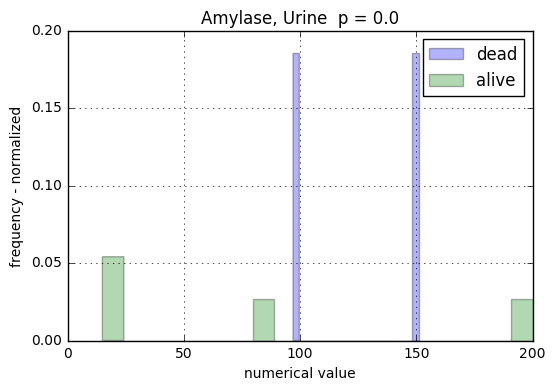

51073 Amylase/Creatinine Ratio, Urine
Amylase/Creatinine Ratio, Urine 0.0
n =  9


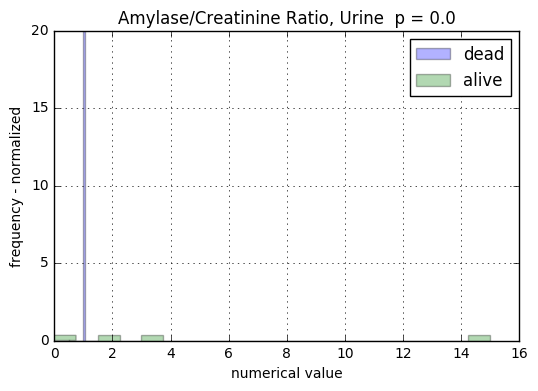

51074 Barbiturate Screen, Urine
Error
51075 Benzodiazepine Screen, Urine
Error
51076 Bicarbonate, Urine
Bicarbonate, Urine 0.0
n =  3


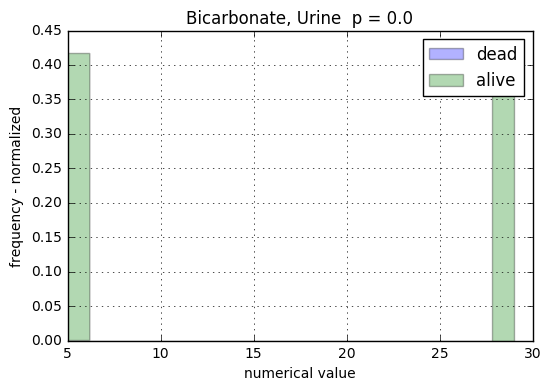

51077 Calcium, Urine
Calcium, Urine 0.0
n =  106


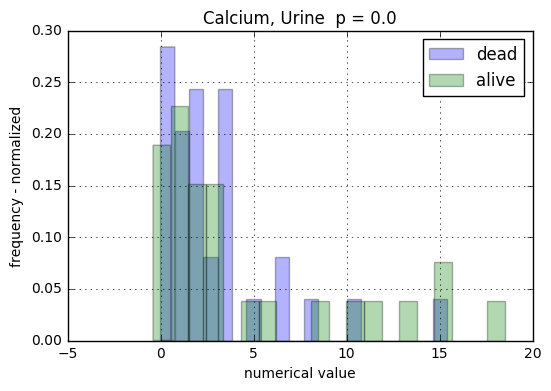

51078 Chloride, Urine
Chloride, Urine 9.64949094925e-146
n =  996


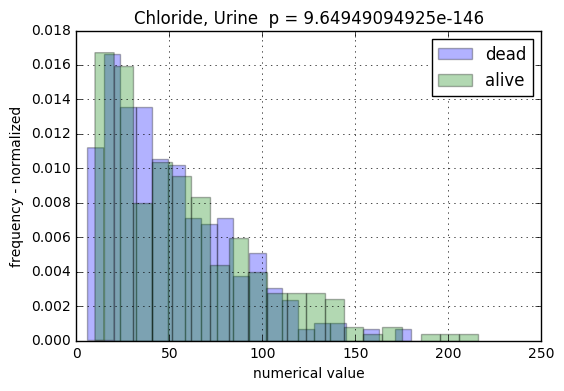

51079 Cocaine, Urine
Error
51080 Creatinine Clearance
Creatinine Clearance 0.0
n =  10


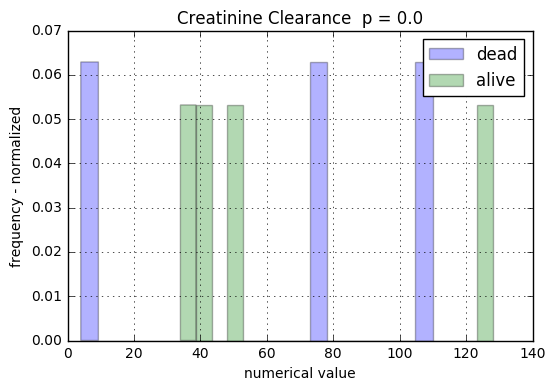

51081 Creatinine, Serum
Creatinine, Serum 0.0
n =  10


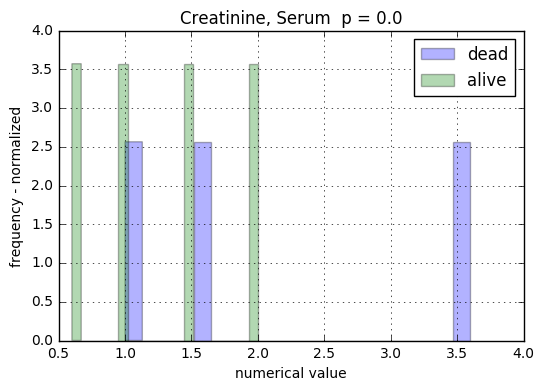

51082 Creatinine, Urine
Creatinine, Urine 0.140860639112
n =  2807


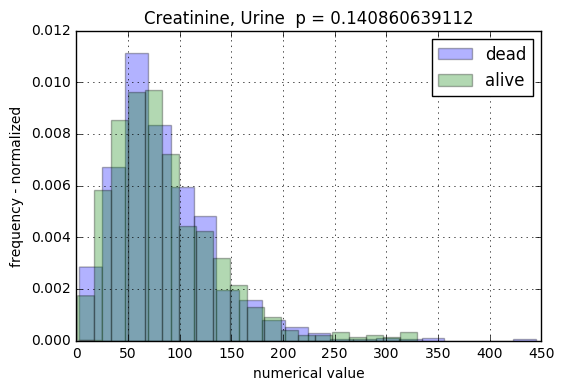

51084 Glucose, Urine
Glucose, Urine 0.0
n =  5


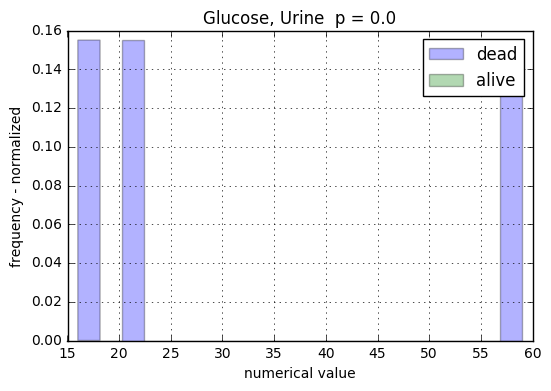

51085 HCG, Urine, Qualitative
Error
51086 Immunofixation, Urine
Error
51087 Length of Urine Collection
Length of Urine Collection 0.0
n =  37


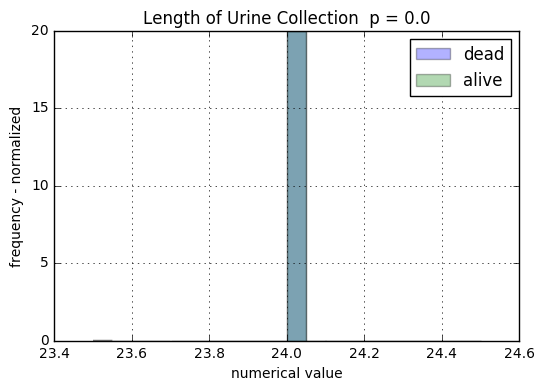

51088 Magnesium, Urine
Magnesium, Urine 0.0
n =  58


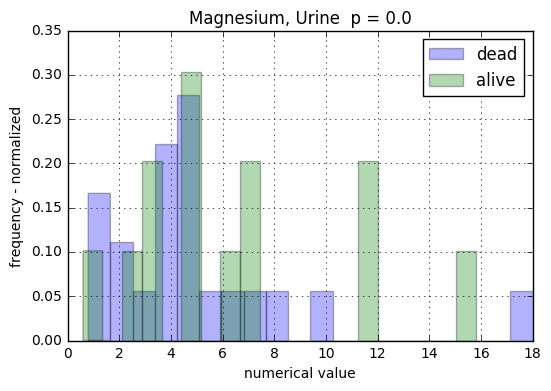

51089 Marijuana
Error
51090 Methadone, Urine
Error
51091 Myoglobin, Urine
Error
51092 Opiate Screen, Urine
Error
51093 Osmolality, Urine
Osmolality, Urine 8.60221795625e-15
n =  1992


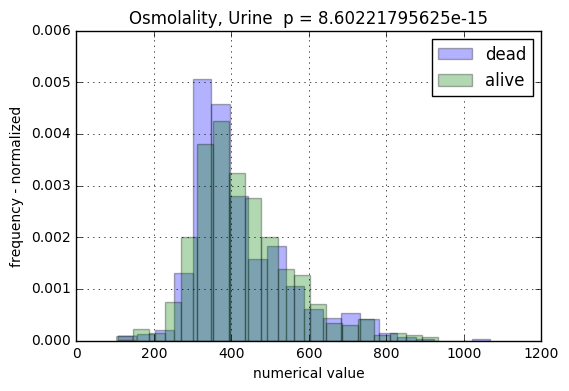

51094 pH
pH 0.0
n =  109


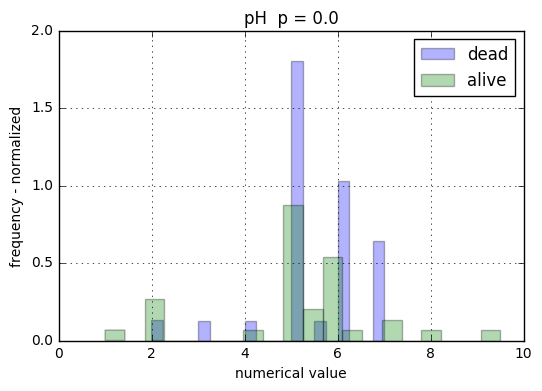

51095 Phosphate, Urine
Phosphate, Urine 0.0
n =  119


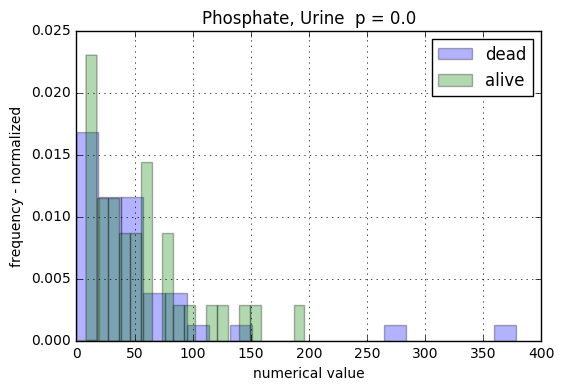

51097 Potassium, Urine
Potassium, Urine 1.17791975396e-96
n =  1154


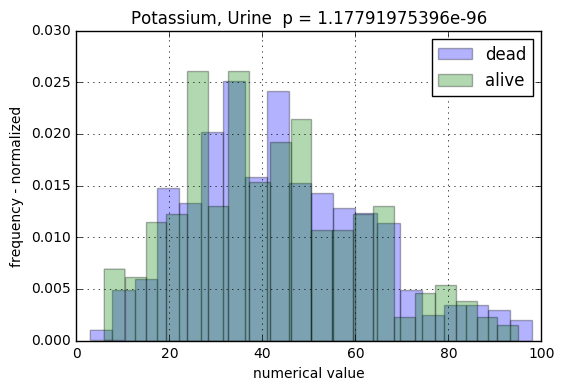

51098 Prot. Electrophoresis, Urine
Error
51099 Protein/Creatinine Ratio
Protein/Creatinine Ratio 5.76675949644e-295
n =  595


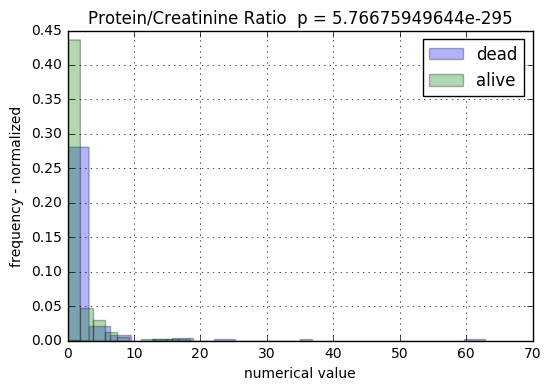

51100 Sodium, Urine
Sodium, Urine 1.11230685472e-15
n =  2248


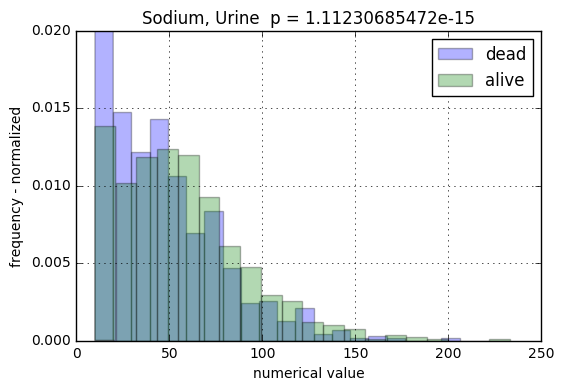

51101 Total Collection Time
Total Collection Time 0.0
n =  10


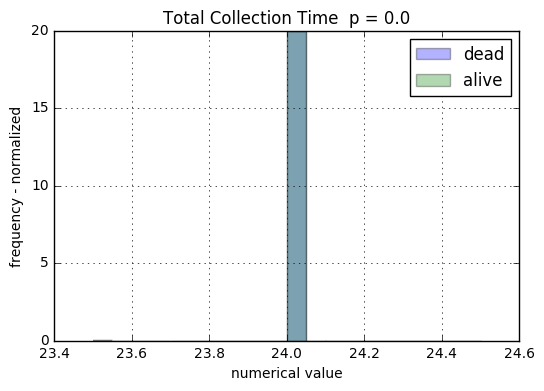

51102 Total Protein, Urine
Total Protein, Urine 5.75609836333e-273
n =  673


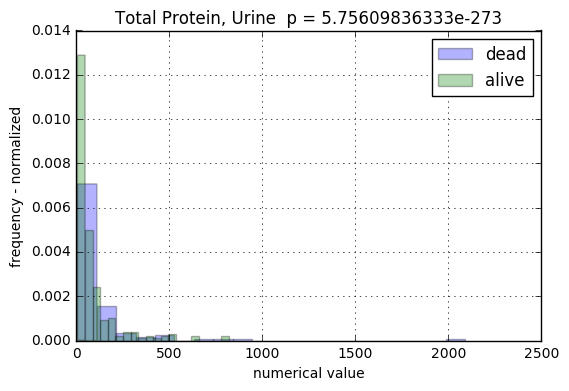

51103 Uhold
Error
51104 Urea Nitrogen, Urine
Urea Nitrogen, Urine 3.99419921641e-19
n =  1896


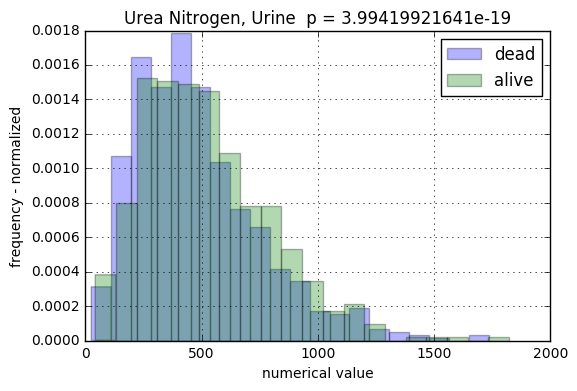

51105 Uric Acid, Urine
Uric Acid, Urine 0.0
n =  78


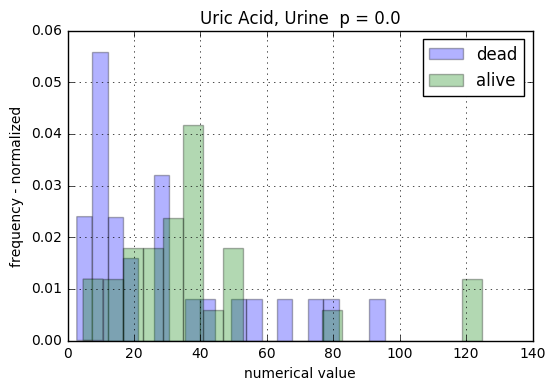

51106 Urine Creatinine
Urine Creatinine 0.0
n =  10


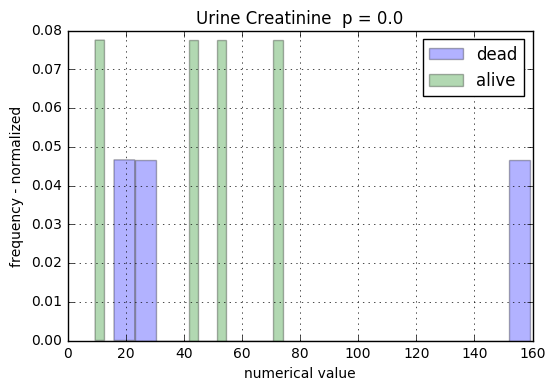

51108 Urine Volume
Urine Volume 0.0
n =  111


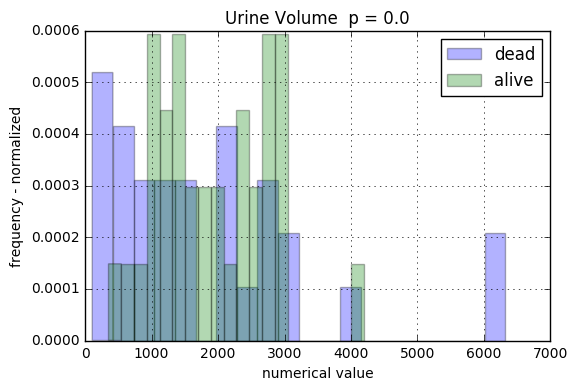

51109 Urine Volume, Total
Urine Volume, Total 0.0
n =  10


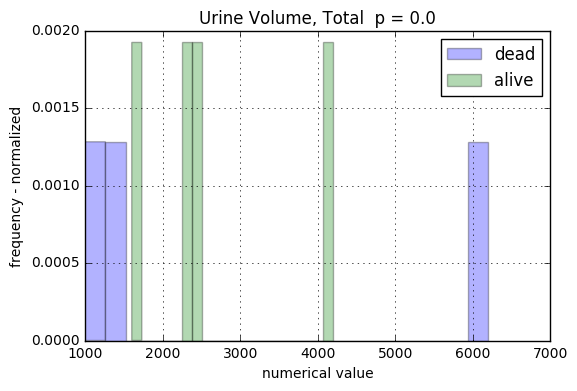

51110 Atypical Lymphocytes
Atypical Lymphocytes 0.0
n =  15


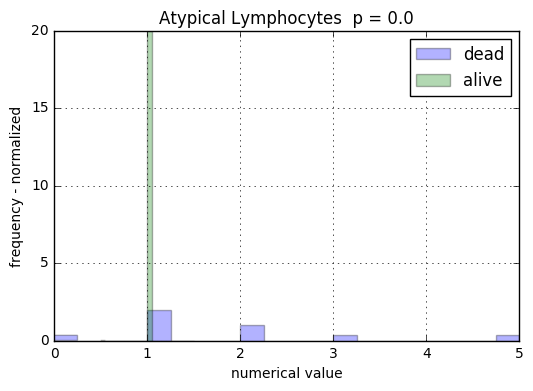

51111 Bands
Bands 0.0
n =  8


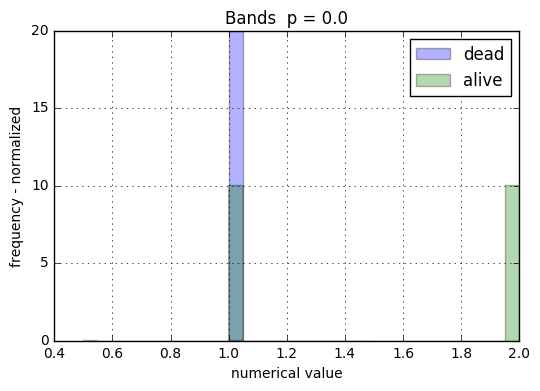

51112 Basophils
Basophils 0.0
n =  6


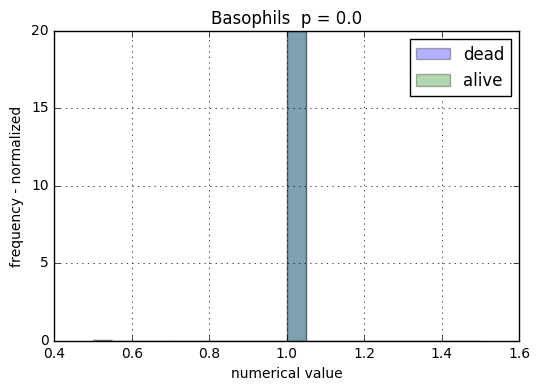

51113 Blasts
Blasts 0.0
n =  1


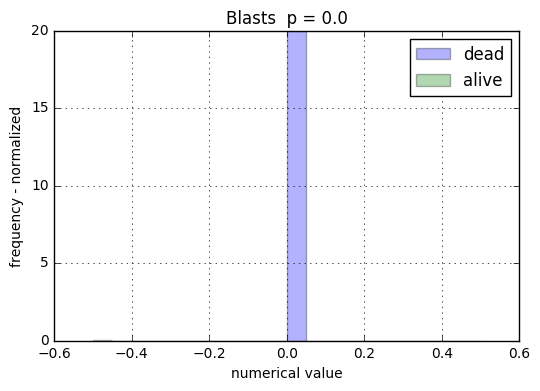

51114 Eosinophils
Eosinophils 0.0
n =  44


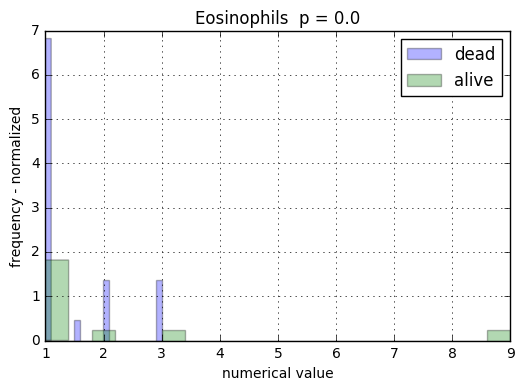

51115 Hematocrit, Ascites
Hematocrit, Ascites 0.0
n =  15


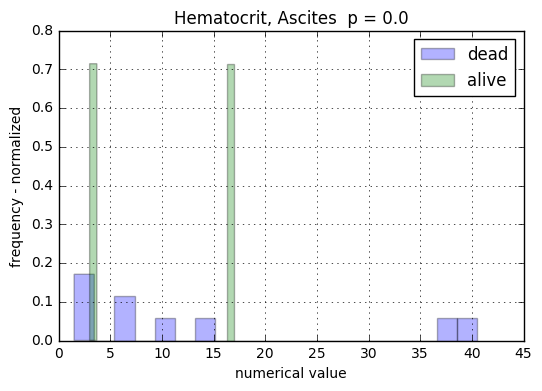

51116 Lymphocytes
Lymphocytes 0.0
n =  135


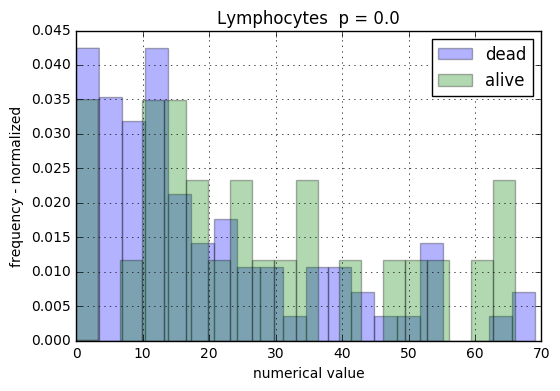

51117 Macrophage
Macrophage 0.0
n =  96


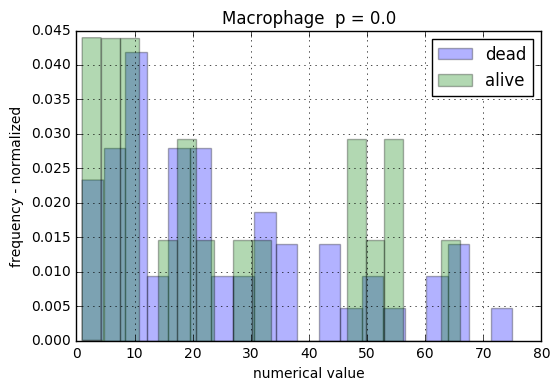

51118 Mesothelial Cell
Mesothelial Cell 0.0
n =  100


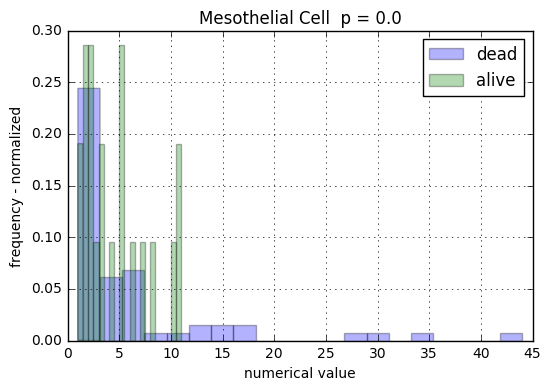

51120 Monocytes
Monocytes 0.0
n =  135


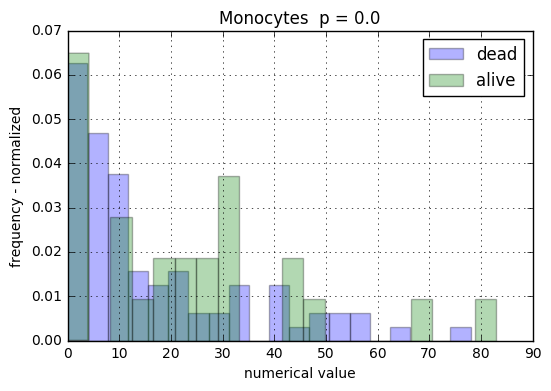

51122 Nucleated RBC
Nucleated RBC 0.0
n =  4


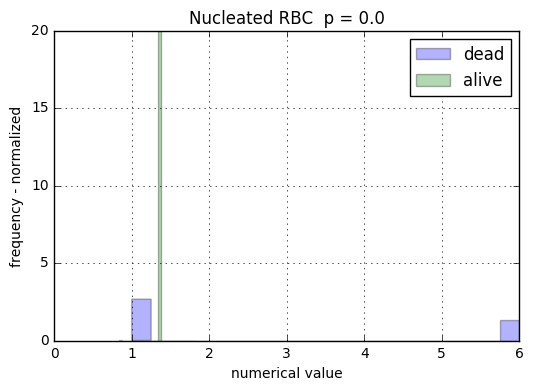

51123 Other
Other 0.0
n =  35


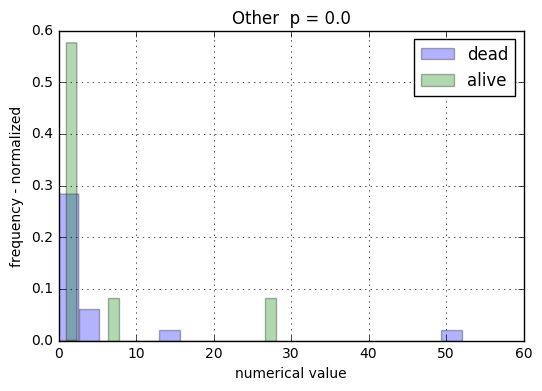

51124 Plasma
Plasma 0.0
n =  7


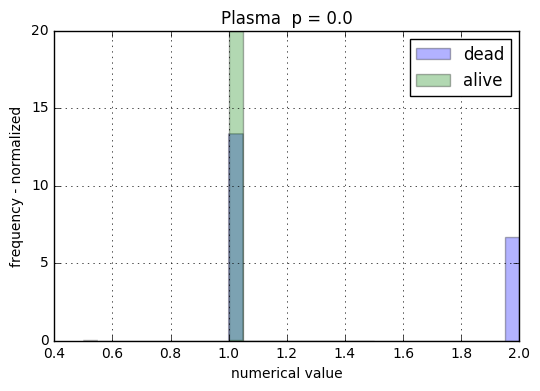

51125 Polys
Polys 0.0
n =  135


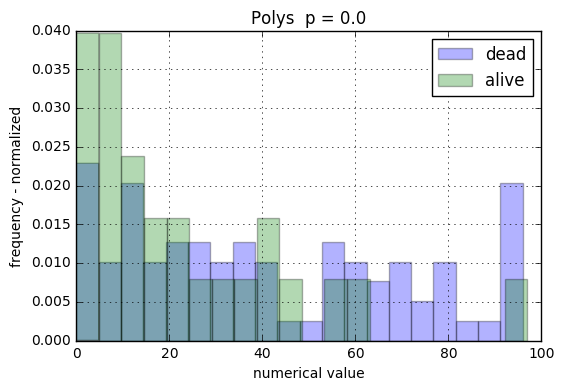

51127 RBC, Ascites
RBC, Ascites 0.0
n =  130


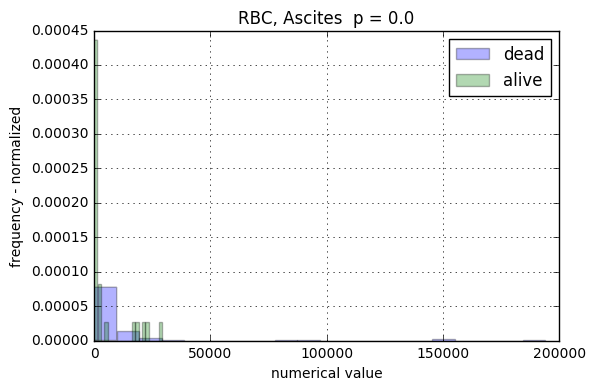

51128 WBC, Ascites
WBC, Ascites 0.0
n =  135


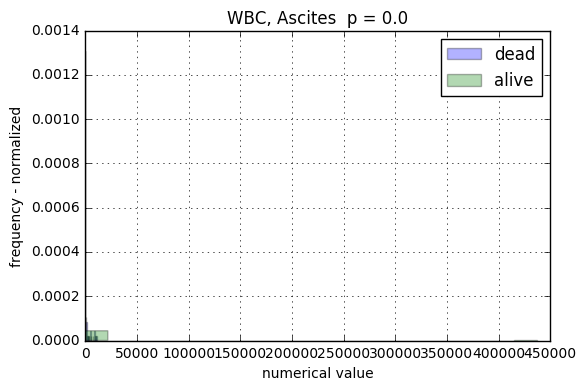

51130 Absolute CD3 Count
Absolute CD3 Count 0.0
n =  59


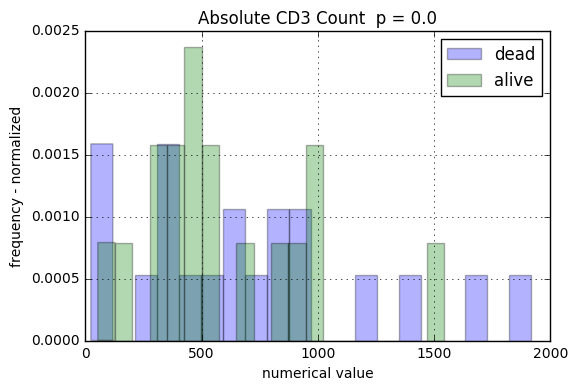

51131 Absolute CD4 Count
Absolute CD4 Count 0.0
n =  71


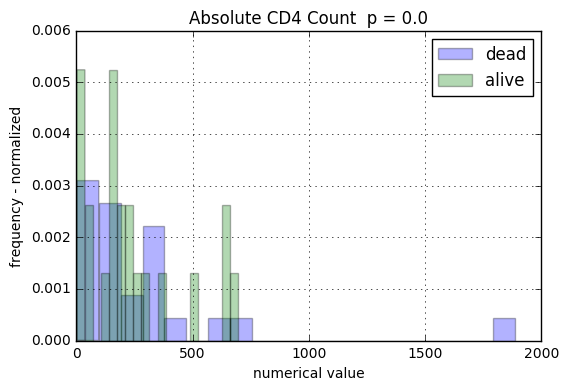

51132 Absolute CD8 Count
Absolute CD8 Count 0.0
n =  59


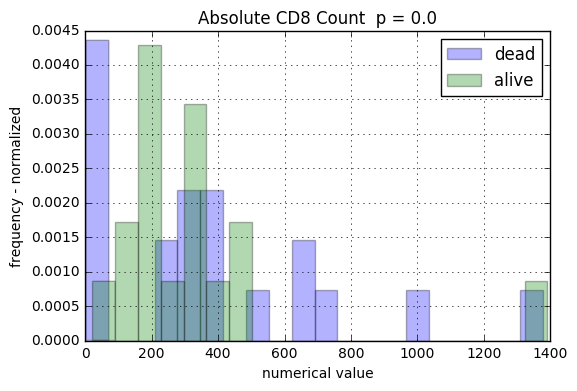

51133 Absolute Lymphocyte Count
Absolute Lymphocyte Count 0.0
n =  71


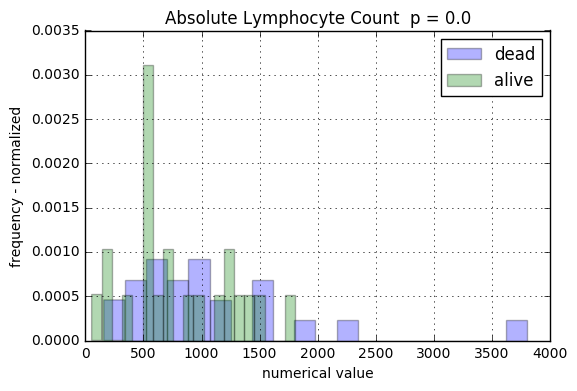

51134 Acanthocytes
Error
51137 Anisocytosis
Error
51138 Anticardiolipin Antibody IgG
Anticardiolipin Antibody IgG 0.0
n =  45


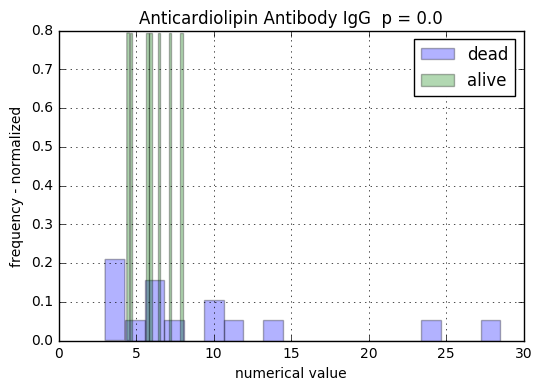

51139 Anticardiolipin Antibody IgM
Anticardiolipin Antibody IgM 0.0
n =  44


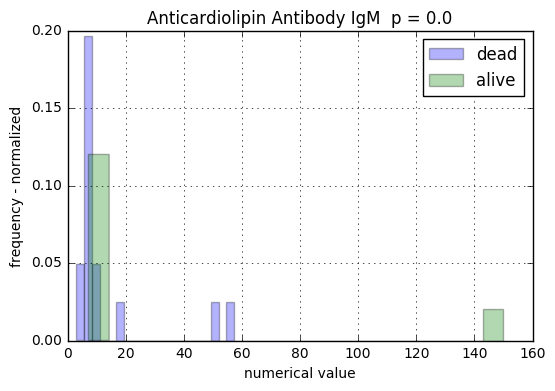

51140 Antithrombin
Antithrombin 0.0
n =  24


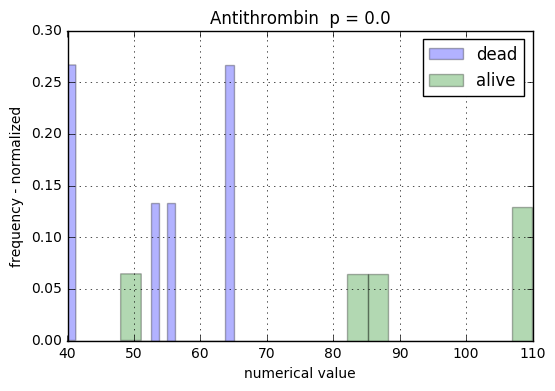

51143 Atypical Lymphocytes
Atypical Lymphocytes 0.239578005881
n =  2298


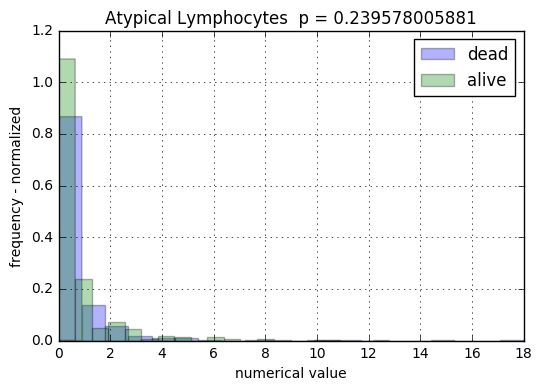

51144 Bands
Bands 0.0203334117316
n =  3060


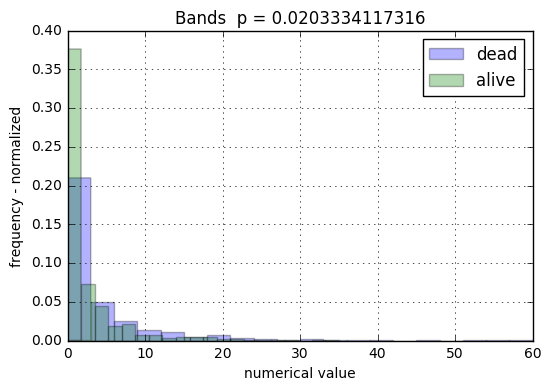

51145 Basophilic Stippling
Error
51146 Basophils
Basophils 5.76041884299e-46
n =  5821


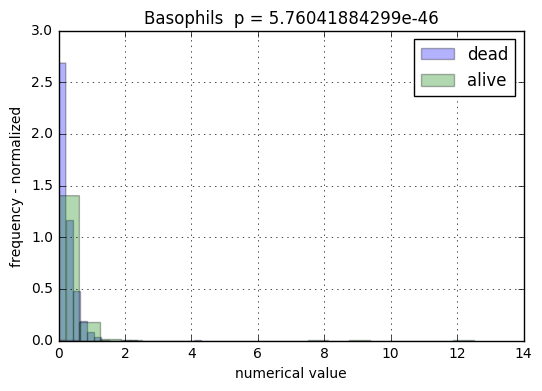

51147 Bite Cells
Error
51148 Blasts
Blasts 0.0
n =  66


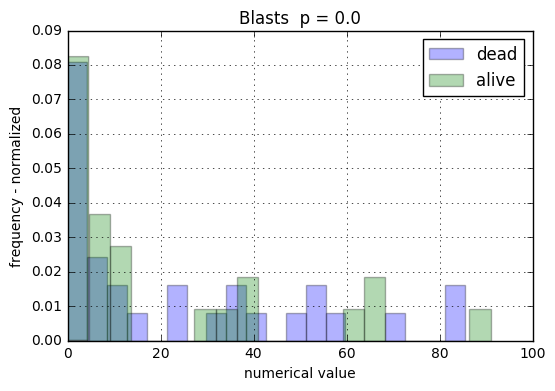

51150 Blood Parasite Smear
Blood Parasite Smear 0.0
n =  0


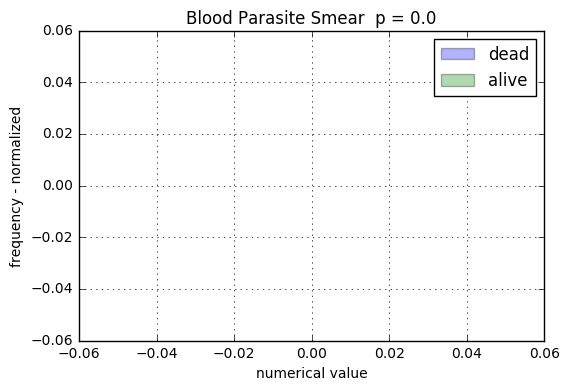

51151 Burr Cells
Error
51152 CD10
Error
51154 CD117
Error
51155 CD11c
Error
51156 CD13
Error
51158 CD14
Error
51159 CD15
Error
51160 CD16/56
CD16/56 0.0
n =  1


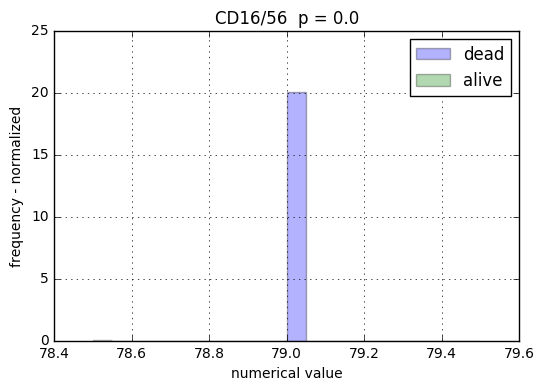

51164 CD19
CD19 0.0
n =  2


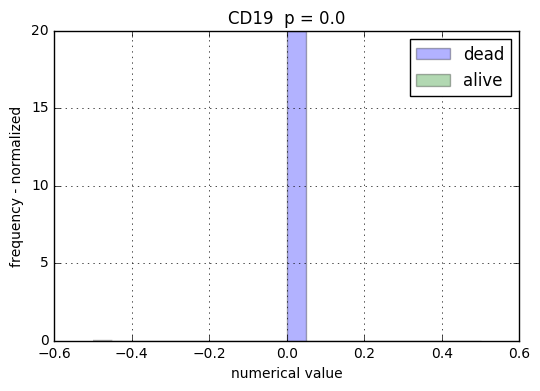

51167 CD2
Error
51168 CD20
CD20 0.0
n =  0


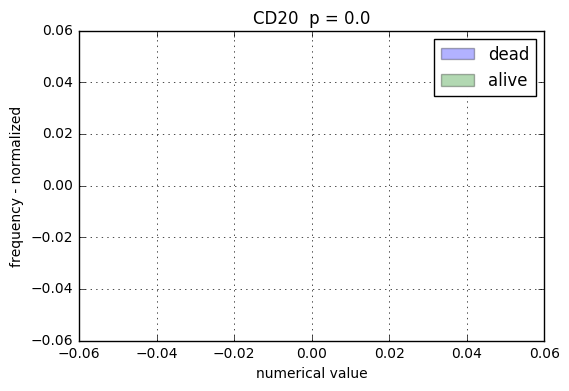

51172 CD23
Error
51176 CD3 Cells, Percent
CD3 Cells, Percent 0.0
n =  56


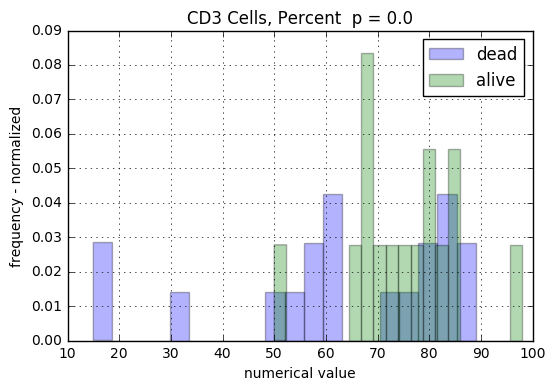

51177 CD33
Error
51178 CD34
Error
51179 CD38
Error
51180 CD4 Cells, Percent
CD4 Cells, Percent 0.0
n =  69


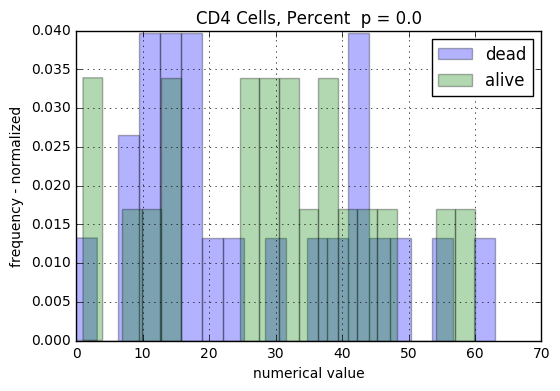

51181 CD4/CD8 Ratio
CD4/CD8 Ratio 0.0
n =  59


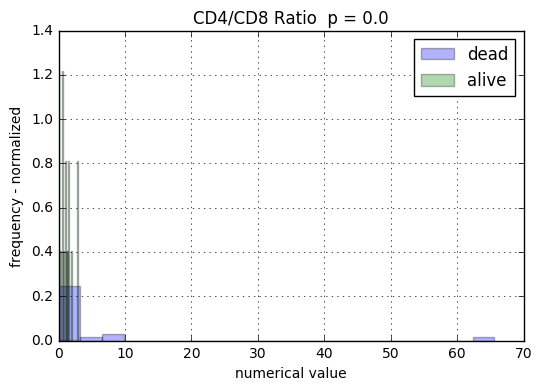

51182 CD41
Error
51183 CD45
Error
51184 CD5
CD5 0.0
n =  1


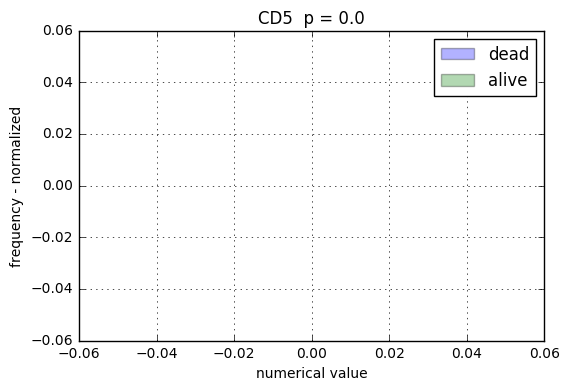

51187 CD55
Error
51188 CD56
CD56 0.0
n =  1


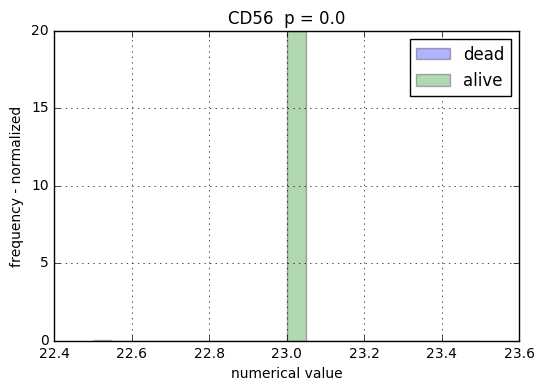

51190 CD59
Error
51191 CD64
Error
51192 CD7
Error
51193 CD71
Error
51194 CD8 Cells, Percent
CD8 Cells, Percent 0.0
n =  57


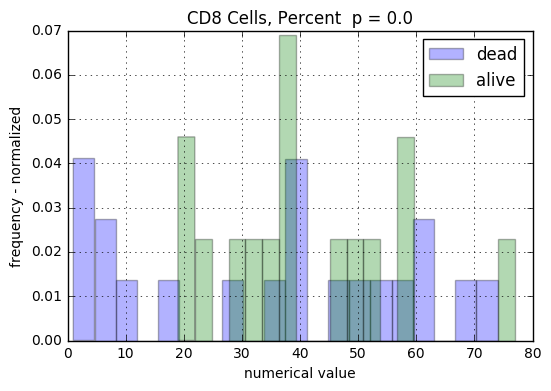

51196 D-Dimer
D-Dimer 2.77106269714e-300
n =  375


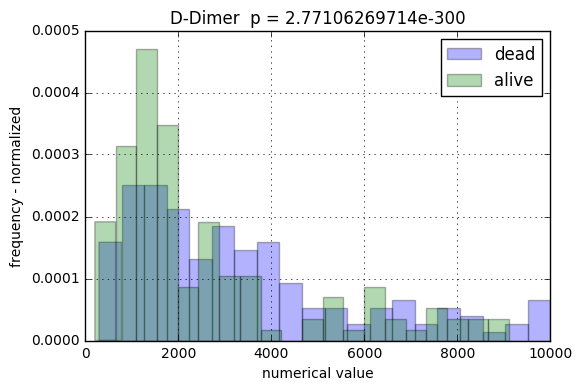

51197 Elliptocytes
Error
51198 Envelope Cells
Error
51199 Eosinophil Count
Eosinophil Count 0.0
n =  39


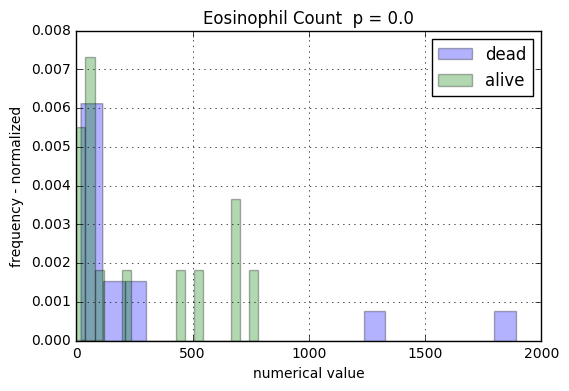

51200 Eosinophils
Eosinophils 3.30240251467e-53
n =  5821


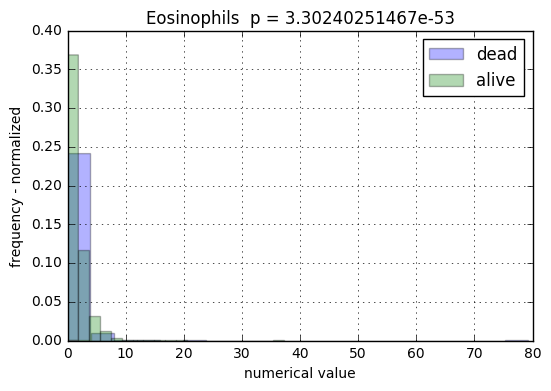

51203 Factor IX
Factor IX 0.0
n =  6


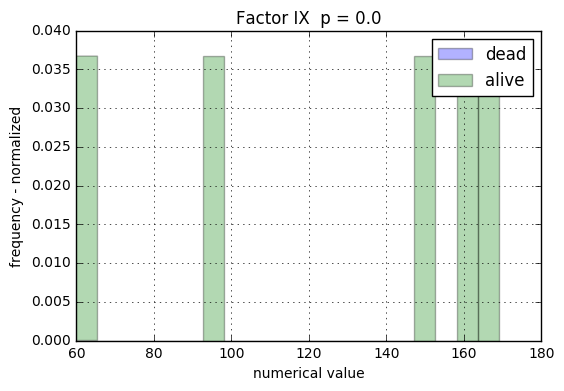

51206 Factor VIII
Factor VIII 0.0
n =  24


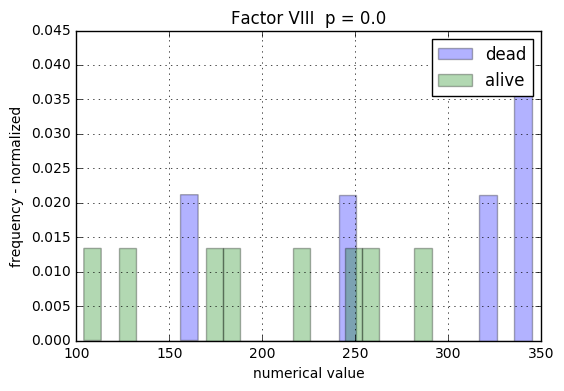

51213 Fibrin Degradation Products
Error
51214 Fibrinogen, Functional
Fibrinogen, Functional 9.55518012377e-08
n =  2525


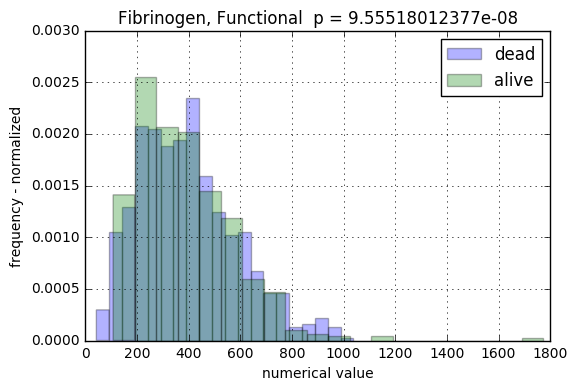

51215 FMC-7
Error
51216 Fragmented Cells
Error
51217 Glyco A
Error
51218 Granulocyte Count
Granulocyte Count 0.0
n =  275


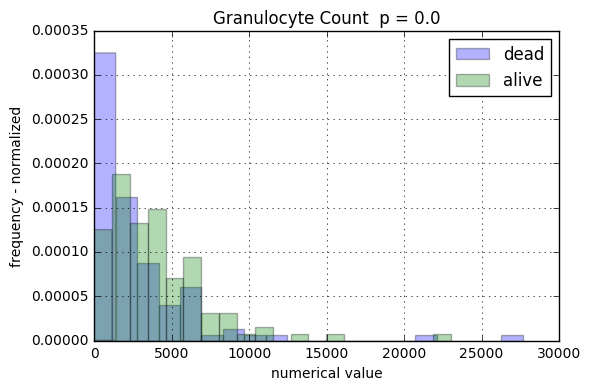

51219 H/O Smear
Error
51220 Heinz Body Prep
Error
51221 Hematocrit
Hematocrit 0.000328132099408
n =  6923


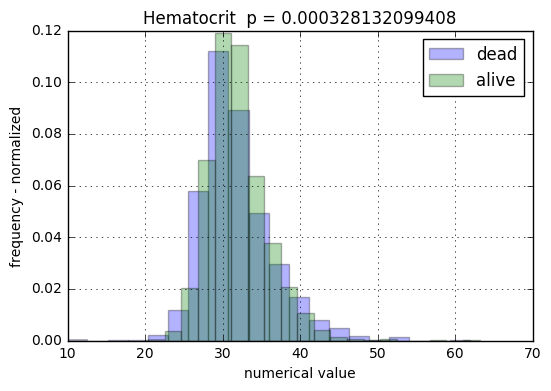

51222 Hemoglobin
Hemoglobin 2.08907449363e-08
n =  6920


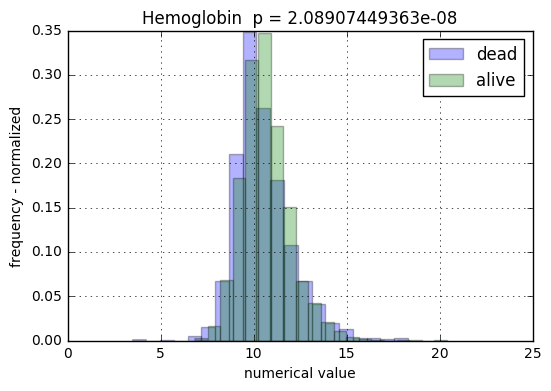

51223 Hemoglobin A2
Hemoglobin A2 0.0
n =  13


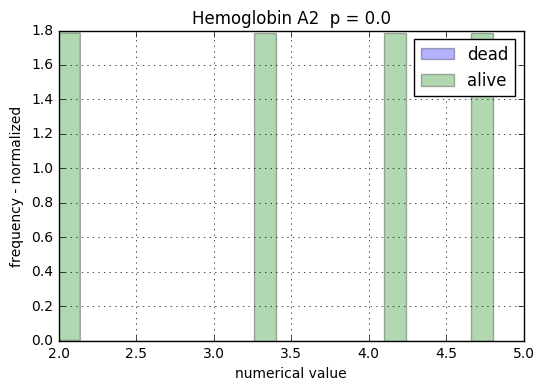

51224 Hemoglobin C
Hemoglobin C 0.0
n =  33


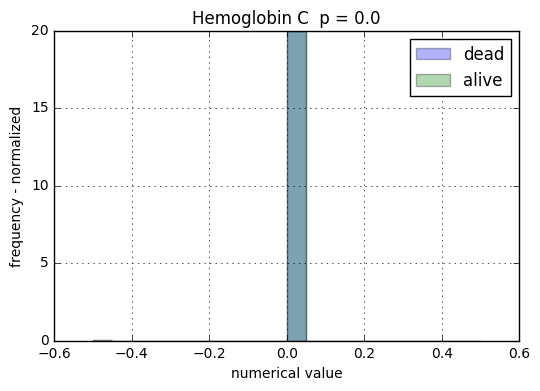

51225 Hemoglobin F
Hemoglobin F 0.0
n =  4


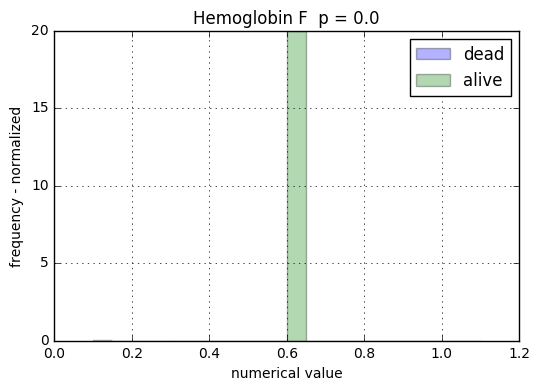

51226 Hemogloblin A
Hemogloblin A 0.0
n =  33


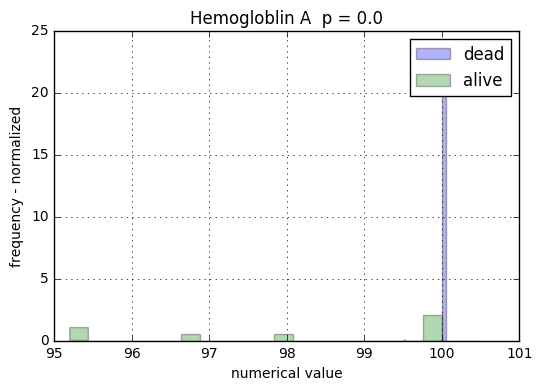

51227 Hemogloblin S
Hemogloblin S 0.0
n =  33


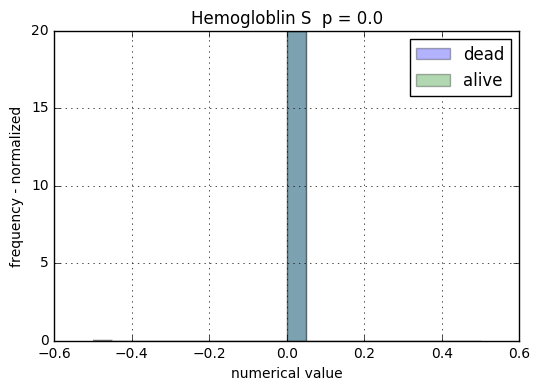

51228 Heparin
Heparin 0.0
n =  12


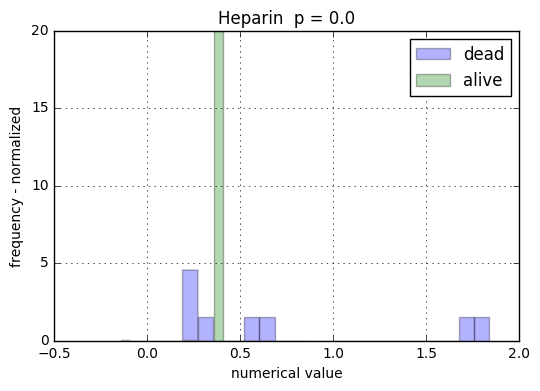

51229 Heparin, LMW
Heparin, LMW 0.0
n =  36


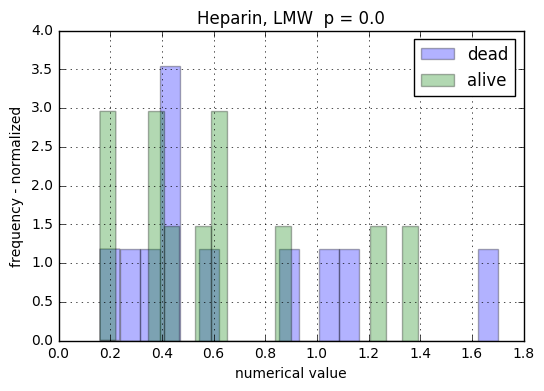

51230 HLA-DR
Error
51231 Howell-Jolly Bodies
Error
51232 Hypersegmented Neutrophils
Hypersegmented Neutrophils 0.0
n =  35


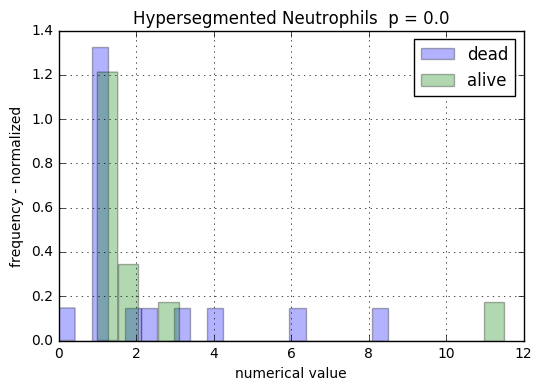

51233 Hypochromia
Hypochromia 0.0
n =  0


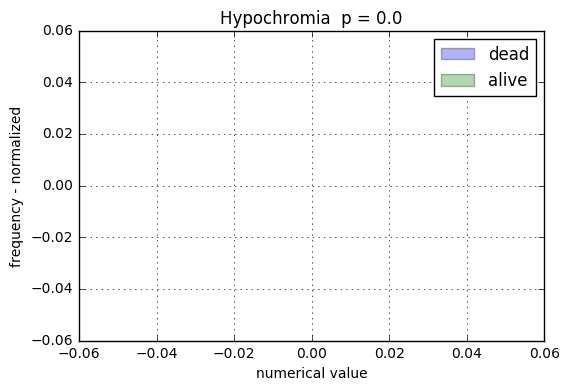

51234 Immunophenotyping
Error
51235 Inhibitor Screen
Error
51237 INR(PT)
INR(PT) 4.62961767207e-22
n =  6828


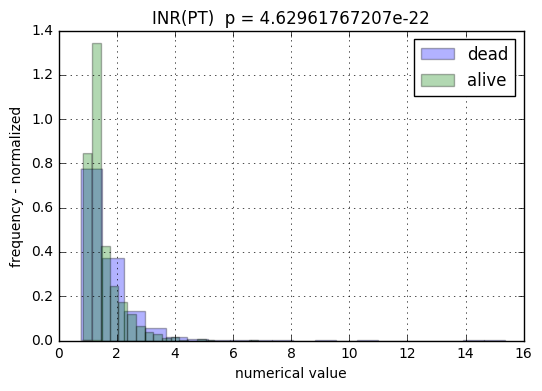

51238 Kappa
Error
51239 Lambda
Error
51240 Large Platelets
Large Platelets 0.0
n =  1


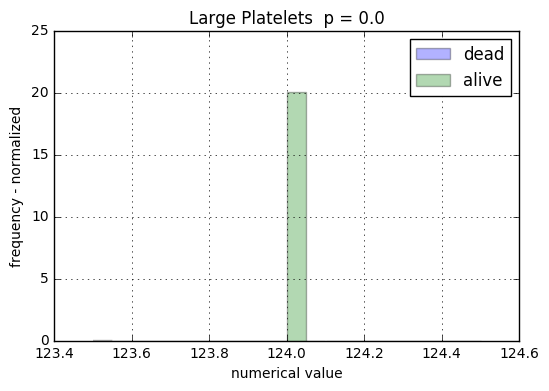

51241 Leukocyte Alkaline Phosphatase
Leukocyte Alkaline Phosphatase 0.0
n =  11


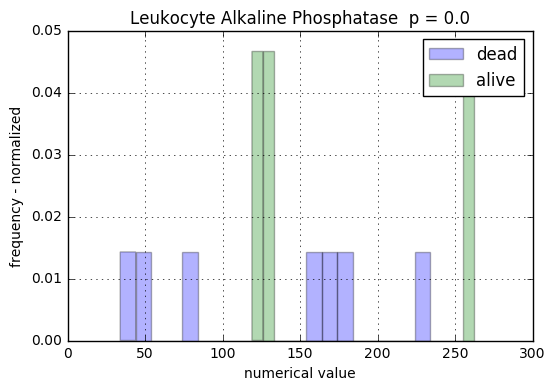

51243 Lupus Anticoagulant
Error
51244 Lymphocytes
Lymphocytes 2.28720197061e-49
n =  5822


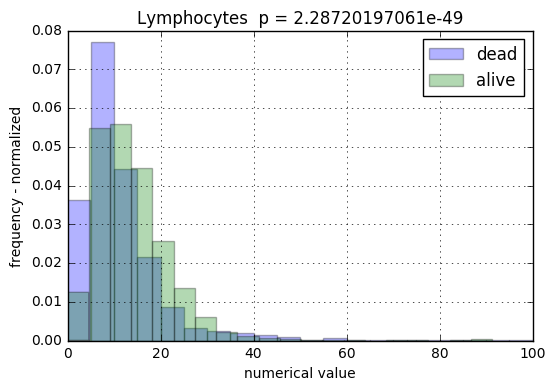

51245 Lymphocytes, Percent
Lymphocytes, Percent 0.0
n =  71


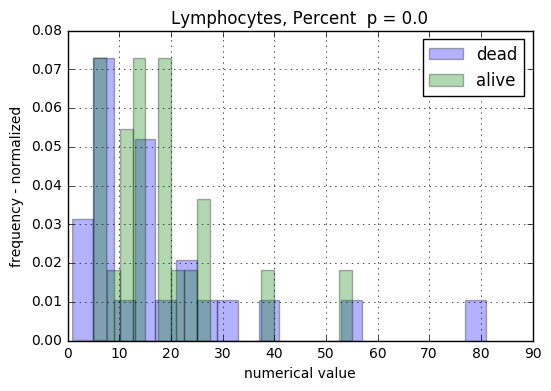

51246 Macrocytes
Error
51247 MacroOvalocytes
Error
51248 MCH
MCH 0.389229072941
n =  6906


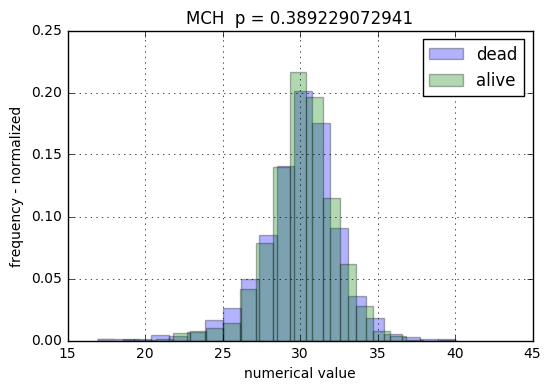

51249 MCHC
MCHC 5.25127349012e-14
n =  6916


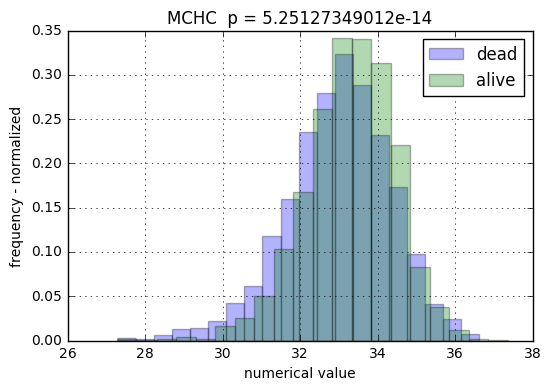

51250 MCV
MCV 0.000752307737435
n =  6904


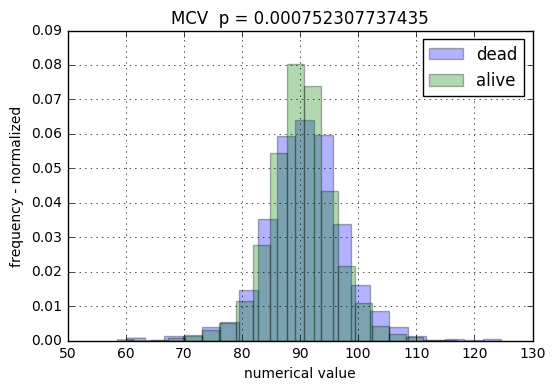

51251 Metamyelocytes
Metamyelocytes 0.159911565121
n =  2292


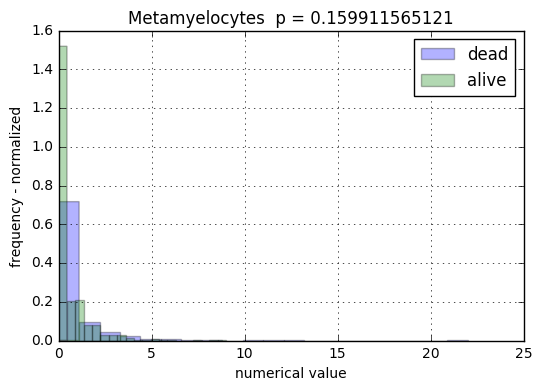

51252 Microcytes
Error
51254 Monocytes
Monocytes 1.15047243939e-17
n =  5822


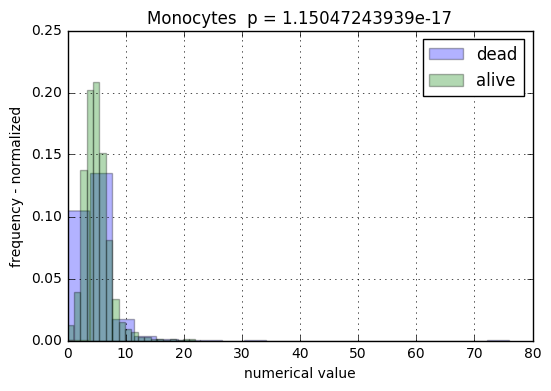

51255 Myelocytes
Myelocytes 0.309873927138
n =  2291


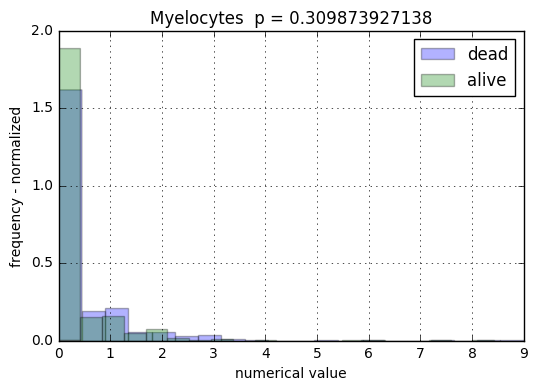

51256 Neutrophils
Neutrophils 3.594445211e-06
n =  5822


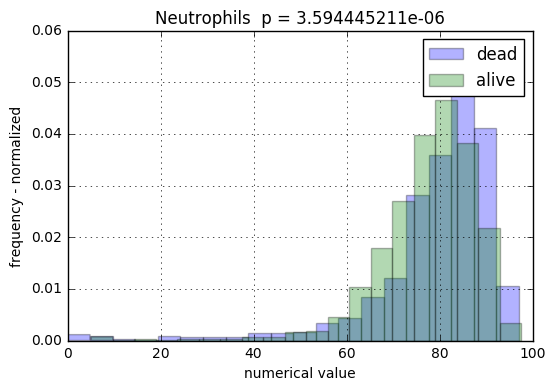

51257 Nucleated Red Cells
Nucleated Red Cells 6.60768910658e-188
n =  537


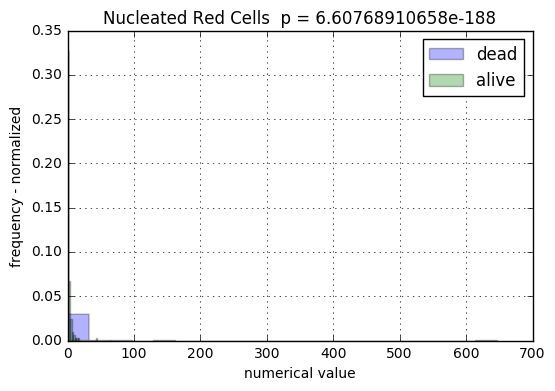

51259 Other Cells
Other Cells 0.0
n =  97


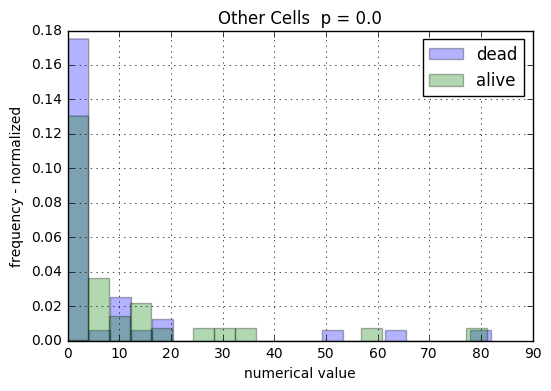

51260 Ovalocytes
Error
51261 Pappenheimer Bodies
Error
51262 Pencil Cells
Error
51263 Plasma Cells
Plasma Cells 0.0
n =  40


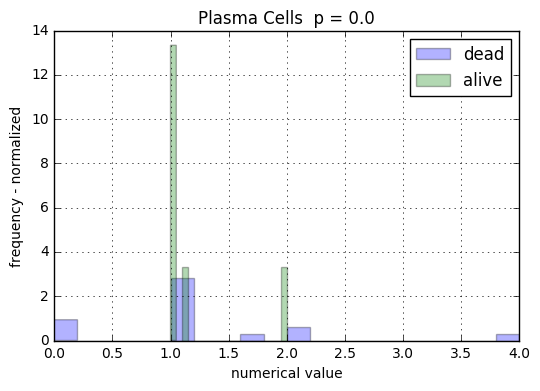

51264 Platelet Clumps
Error
51265 Platelet Count
Platelet Count 8.06291820336e-11
n =  6913


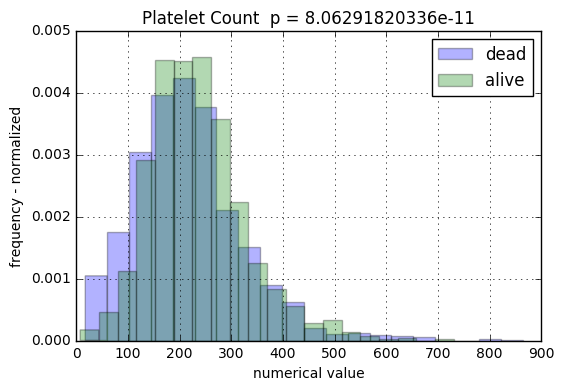

51266 Platelet Smear
Error
51267 Poikilocytosis
Error
51268 Polychromasia
Error
51269 Promyelocytes
Promyelocytes 0.0
n =  173


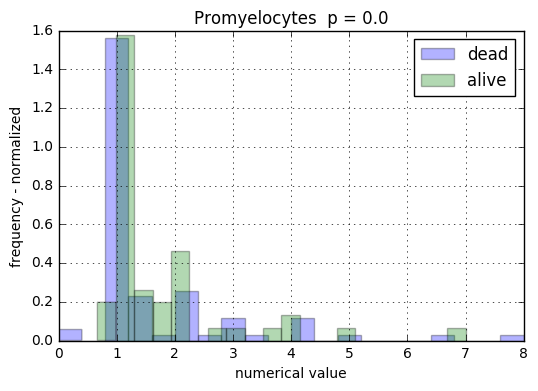

51271 Protein C, Functional
Protein C, Functional 0.0
n =  26


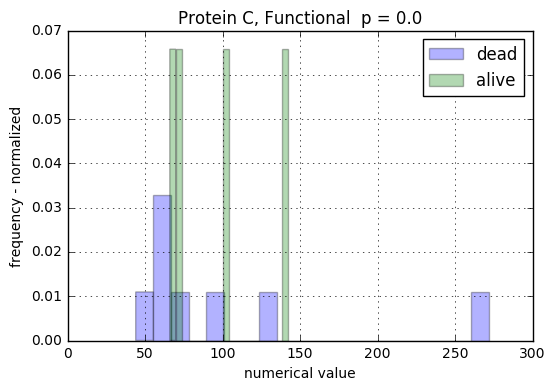

51272 Protein S, Antigen
Protein S, Antigen 0.0
n =  7


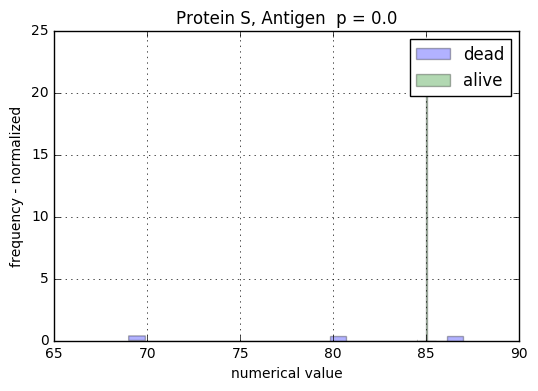

51273 Protein S, Functional
Protein S, Functional 0.0
n =  10


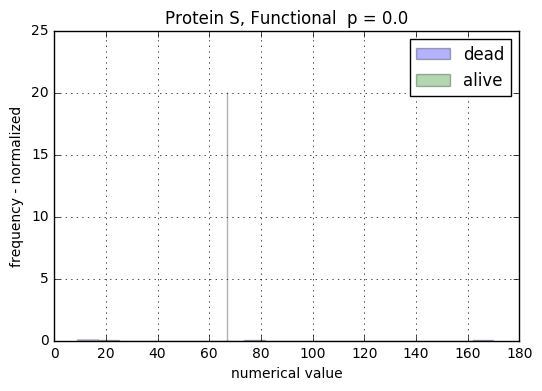

51274 PT
PT 3.89923585488e-25
n =  6850


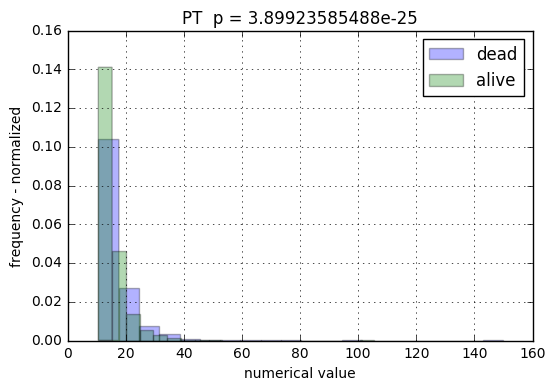

51275 PTT
PTT 2.56227054134e-14
n =  6603


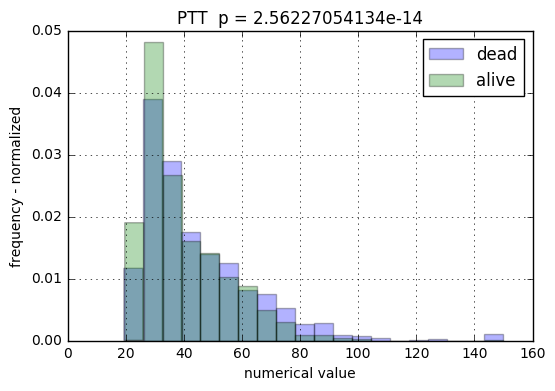

51276 Quantitative G6PD
Quantitative G6PD 0.0
n =  21


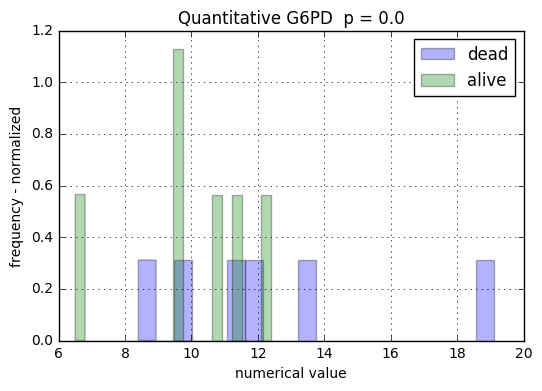

51277 RDW
RDW 4.48082901417e-28
n =  6907


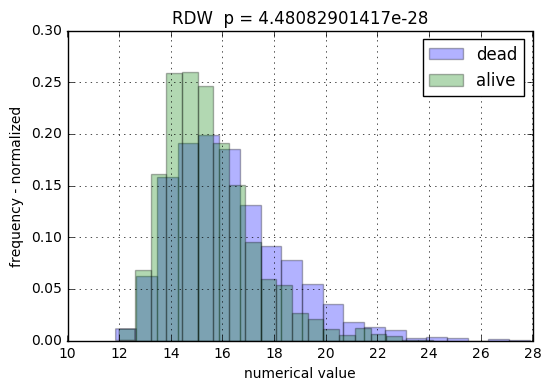

51278 Red Blood Cell Fragments
Error
51279 Red Blood Cells
Red Blood Cells 0.000102513105363
n =  6906


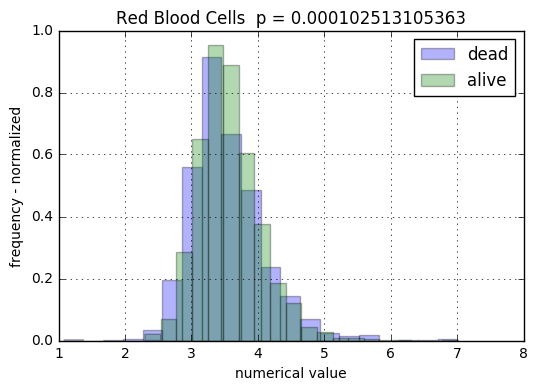

51280 Reptilase Time
Reptilase Time 0.0
n =  3


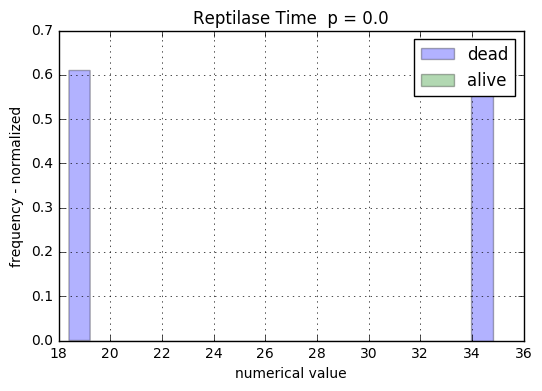

51281 Reptilase Time Control
Reptilase Time Control 0.0
n =  3


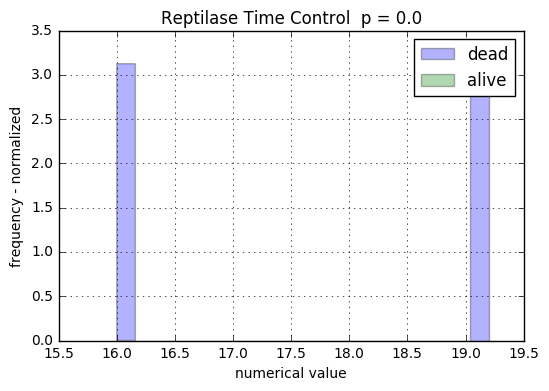

51283 Reticulocyte Count, Automated
Reticulocyte Count, Automated 1.44019533882e-191
n =  1066


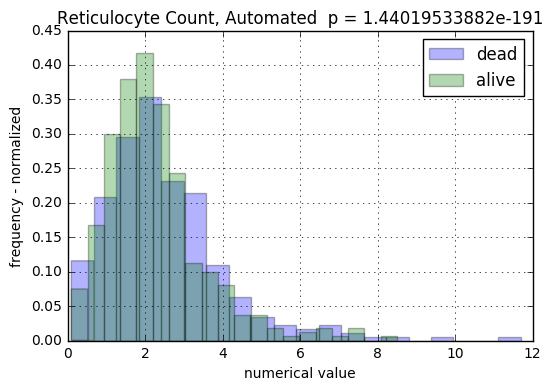

51284 Reticulocyte Count, Manual
Reticulocyte Count, Manual 0.0
n =  150


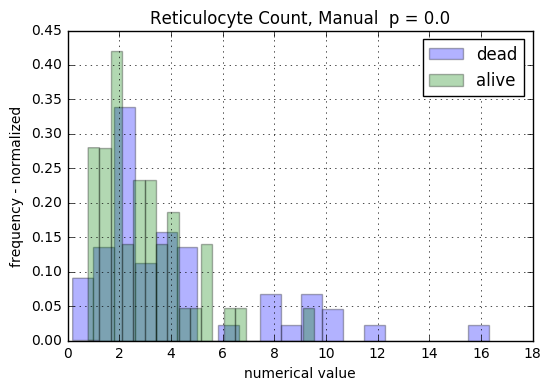

51287 Schistocytes
Error
51288 Sedimentation Rate
Sedimentation Rate 0.0
n =  641


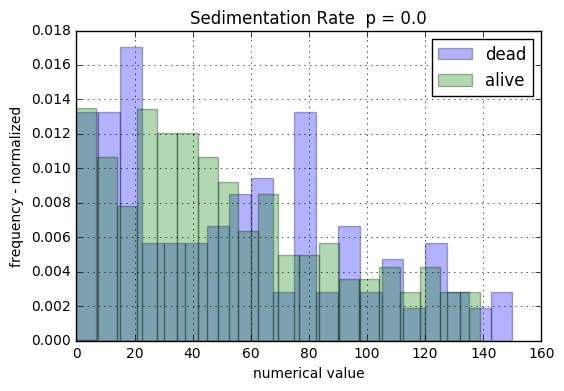

51292 Spherocytes
Error
51294 Target Cells
Error
51296 Teardrop Cells
Error
51297 Thrombin
Thrombin 0.0
n =  82


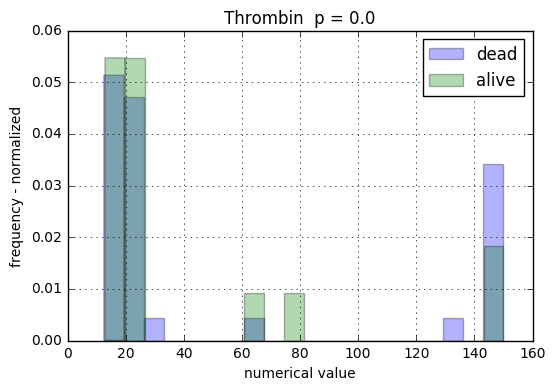

51298 Von Willebrand Factor Activity
Von Willebrand Factor Activity 0.0
n =  10


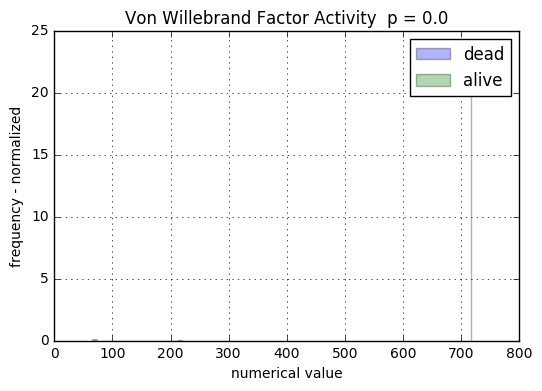

51299 Von Willebrand Factor Antigen
Von Willebrand Factor Antigen 0.0
n =  7


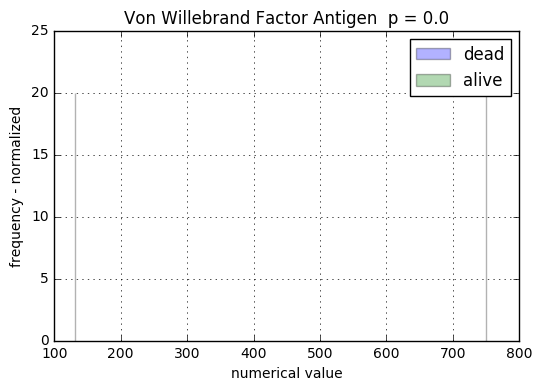

51300 WBC Count
WBC Count 0.0
n =  71


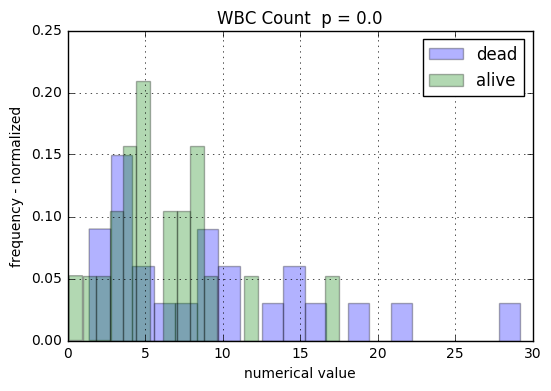

51301 White Blood Cells
White Blood Cells 2.76052372077e-51
n =  6913


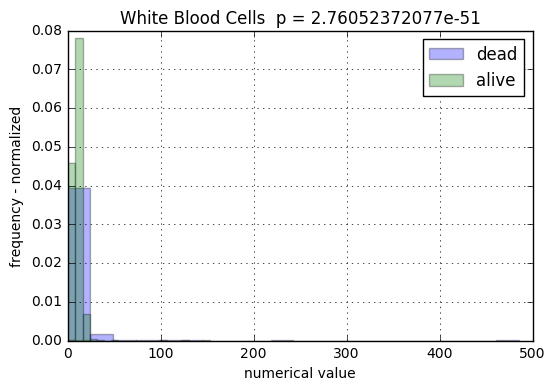

51302 Young Cells
Young Cells 0.0
n =  14


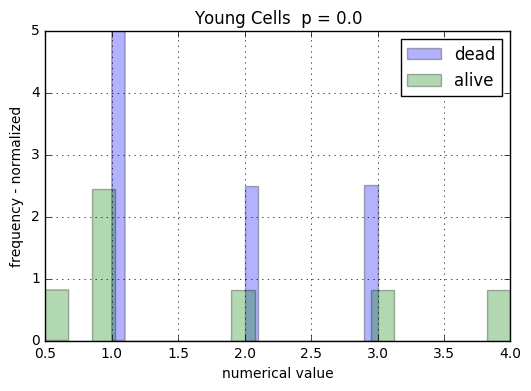

51303 CD10
Error
51305 CD117
Error
51306 CD11c
Error
51307 CD13
Error
51309 CD14
Error
51310 CD15
Error
51313 CD19
Error
51314 CD2
Error
51315 CD20
Error
51317 CD23
Error
51319 CD3
Error
51320 CD33
Error
51321 CD34
Error
51323 CD4
Error
51324 CD41
Error
51325 CD45
Error
51326 CD5
Error
51328 CD56
Error
51331 CD64
Error
51332 CD7
Error
51333 CD71
Error
51334 CD8
Error
51335 FMC-7
Error
51336 Glyco A
Error
51337 HLA-DR
Error
51338 Immunophenotyping
Error
51339 Iron Stain
Error
51340 Kappa
Error
51341 Lambda
Error
51342 Wright Giemsa
Error
51343 Atypical Lymphocytes
Atypical Lymphocytes 0.0
n =  17


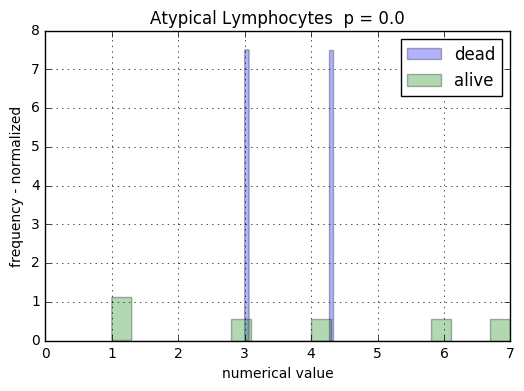

51344 Bands
Bands 0.0
n =  21


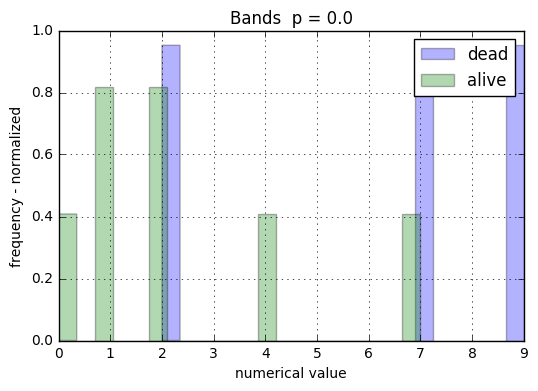

51347 Eosinophils
Eosinophils 0.0
n =  28


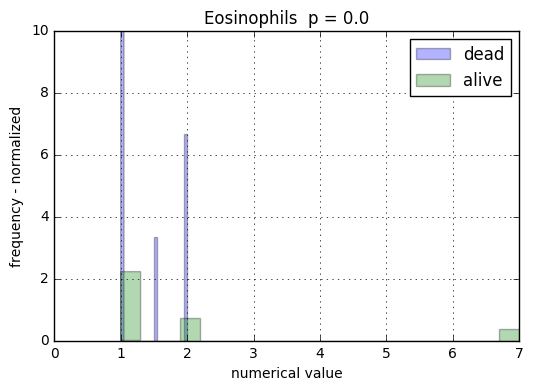

51348 Hematocrit, CSF
Hematocrit, CSF 0.0
n =  2


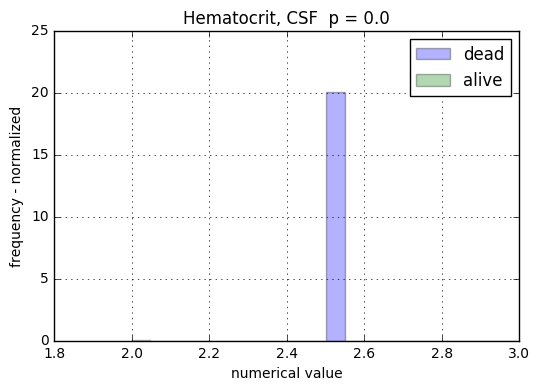

51351 Lymphs
Lymphs 0.0
n =  229


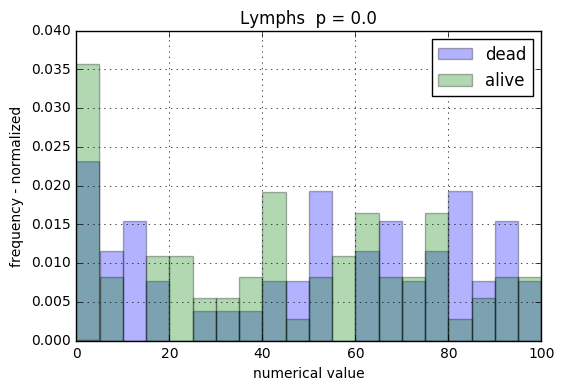

51352 Macrophage
Macrophage 0.0
n =  63


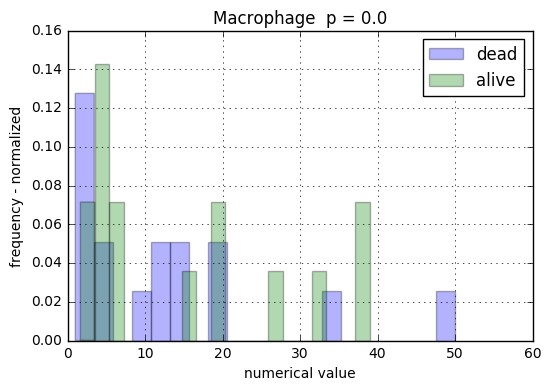

51354 Metamyelocytes
Metamyelocytes 0.0
n =  5


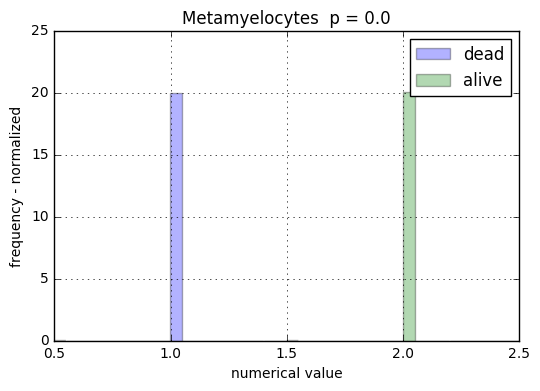

51355 Monocytes
Monocytes 0.0
n =  229


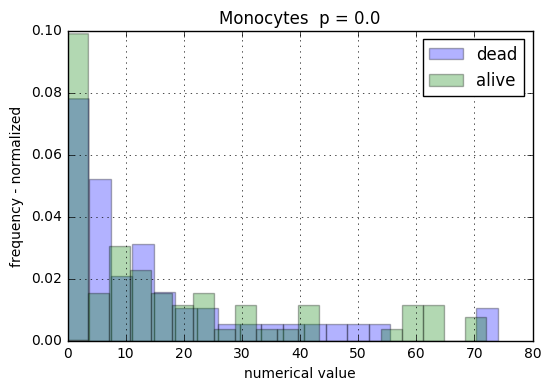

51357 NRBC
NRBC 0.0
n =  8


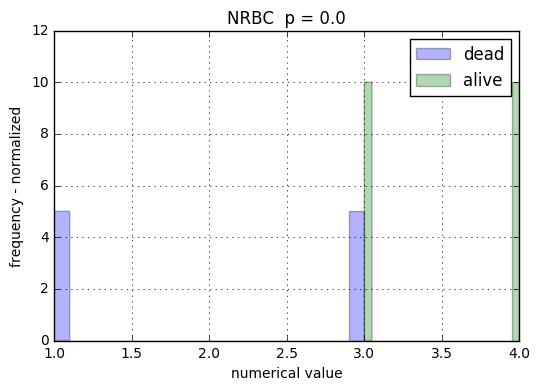

51358 Other
Other 0.0
n =  16


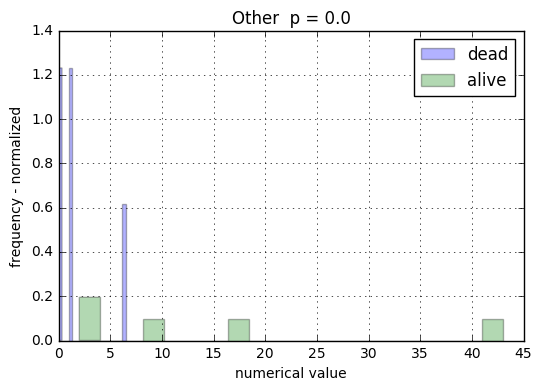

51360 Polys
Polys 0.0
n =  229


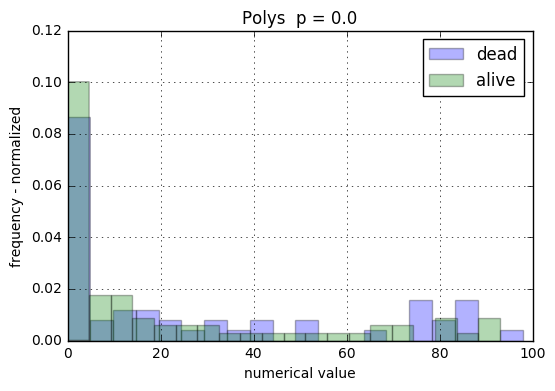

51362 RBC, CSF
RBC, CSF 0.0
n =  228


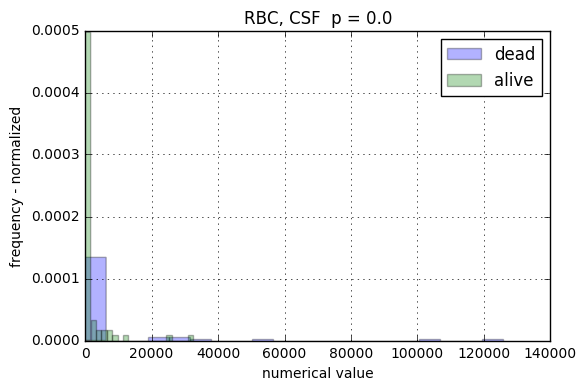

51363 WBC, CSF
WBC, CSF 0.0
n =  229


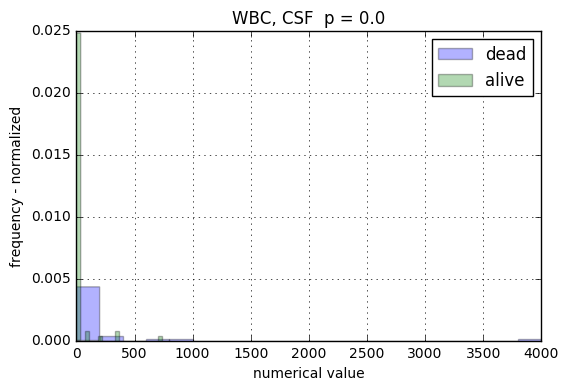

51365 Atypical Lymphocytes
Atypical Lymphocytes 0.0
n =  4


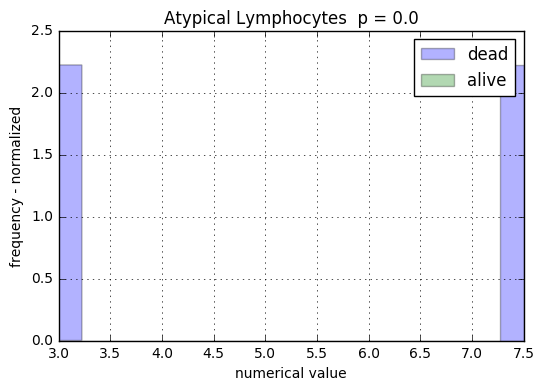

51366 Bands
Bands 0.0
n =  10


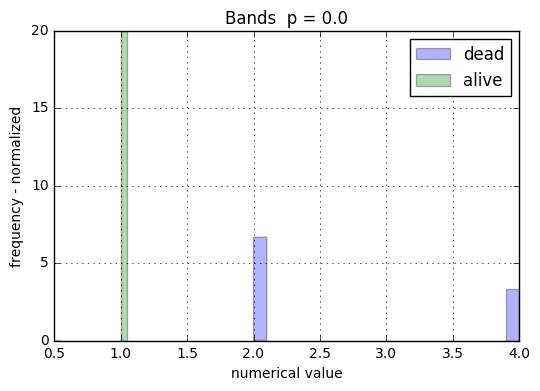

51368 Eosinophils
Eosinophils 0.0
n =  10


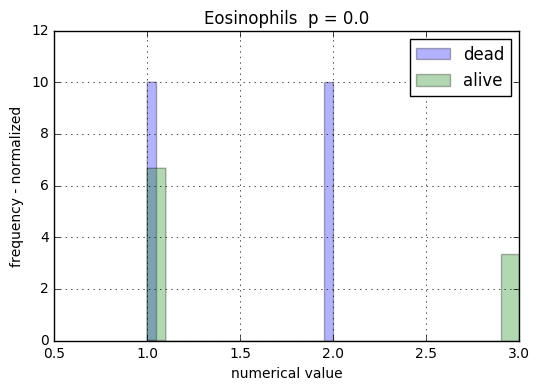

51369 Hematocrit, Joint Fluid
Hematocrit, Joint Fluid 0.0
n =  13


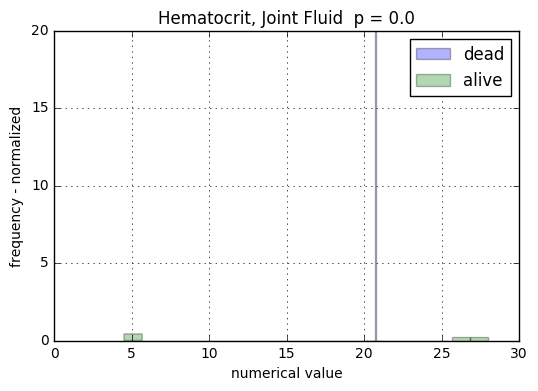

51370 Joint Crystals, Birefringence
Error
51372 Joint Crystals, Location
Error
51373 Joint Crystals, Number
Error
51374 Joint Crystals, Shape
Error
51375 Lymphocytes
Lymphocytes 0.0
n =  78


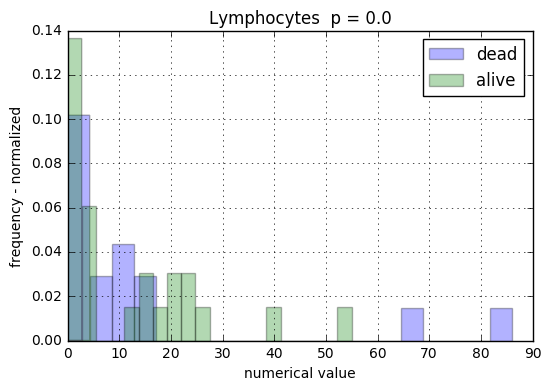

51376 Macrophage
Macrophage 0.0
n =  32


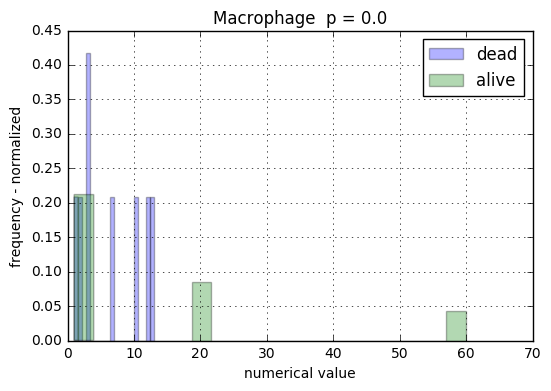

51378 Metamyelocytes
Metamyelocytes 0.0
n =  1


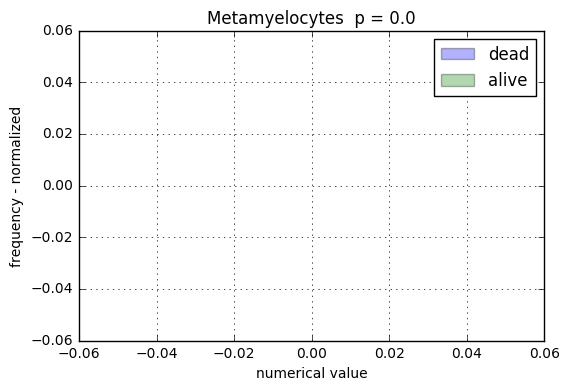

51379 Monocytes
Monocytes 0.0
n =  78


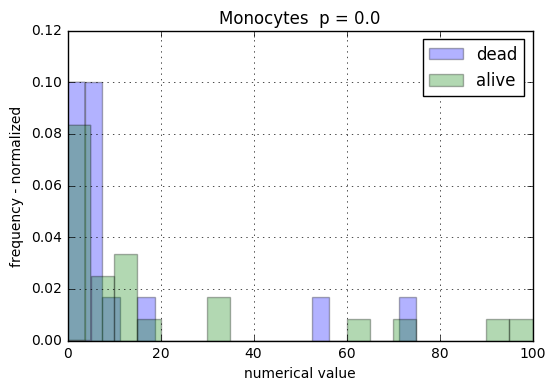

51380 NRBC
NRBC 0.0
n =  1


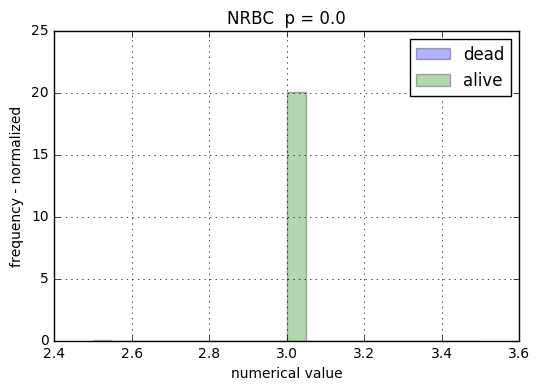

51381 Other
Other 0.0
n =  6


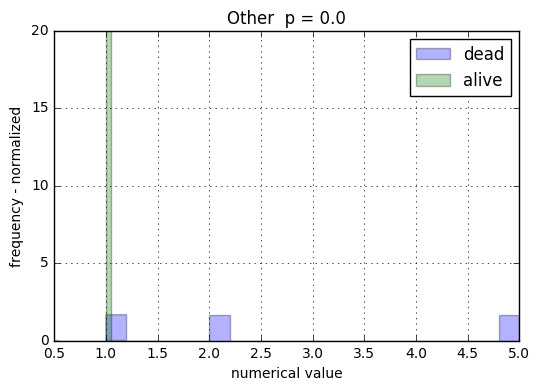

51382 Polys
Polys 0.0
n =  78


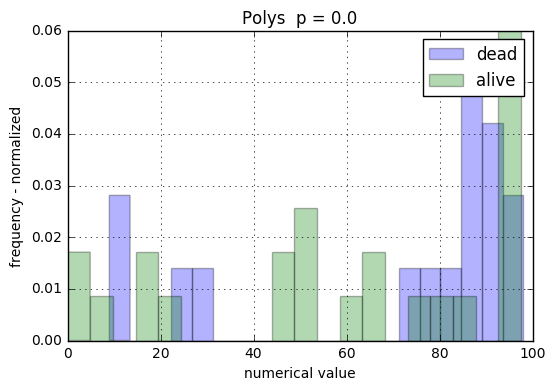

51383 RBC, Joint Fluid
RBC, Joint Fluid 0.0
n =  68


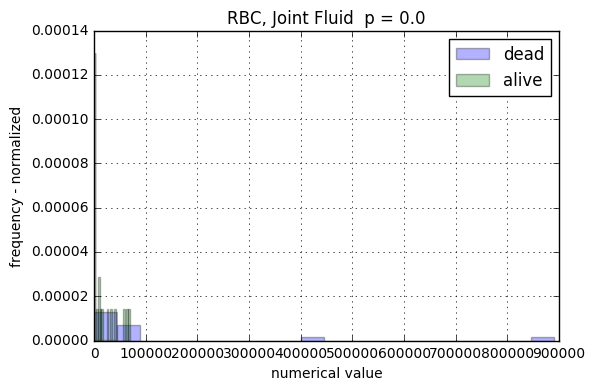

51384 WBC, Joint Fluid
WBC, Joint Fluid 0.0
n =  78


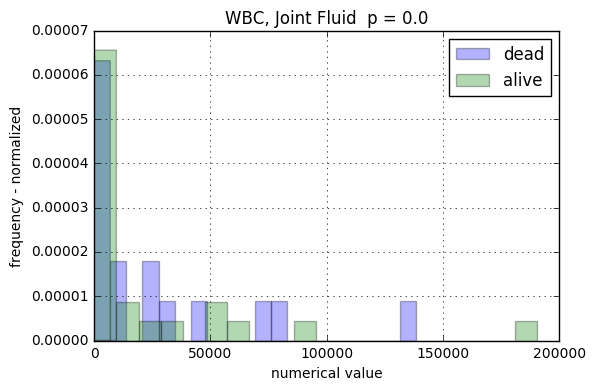

51385 Atypical Lymphocytes
Atypical Lymphocytes 0.0
n =  9


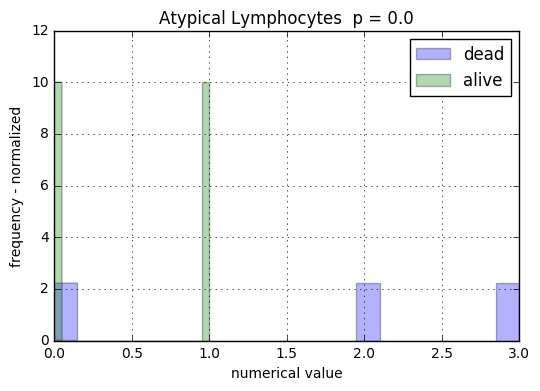

51386 Bands
Bands 0.0
n =  17


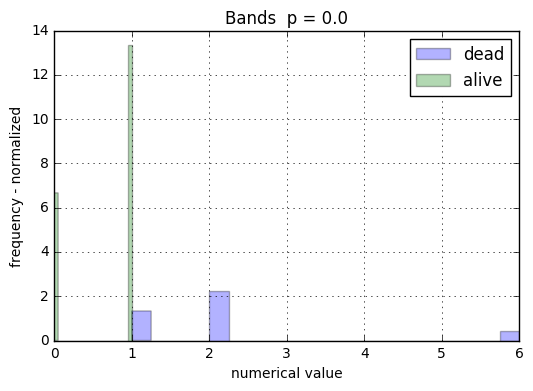

51387 Basophils
Basophils 0.0
n =  11


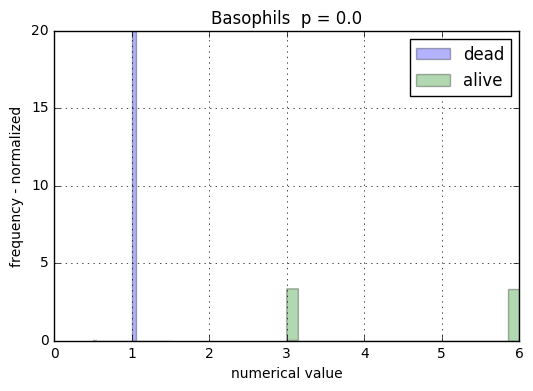

51388 CD10
Error
51390 CD117
Error
51391 CD11c
Error
51392 CD13
Error
51394 CD14
Error
51395 CD15
Error
51397 CD16/56
Error
51398 CD19
CD19 0.0
n =  14


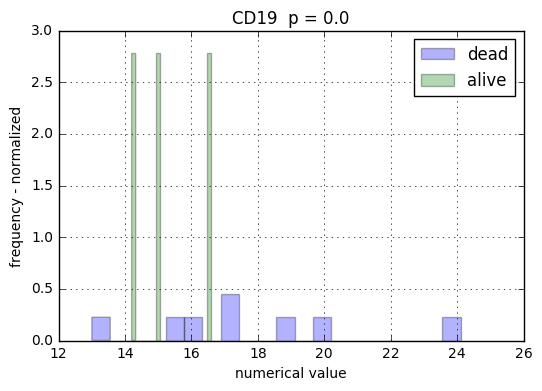

51399 CD2
Error
51400 CD20
Error
51402 CD23
Error
51404 CD3
CD3 0.0
n =  16


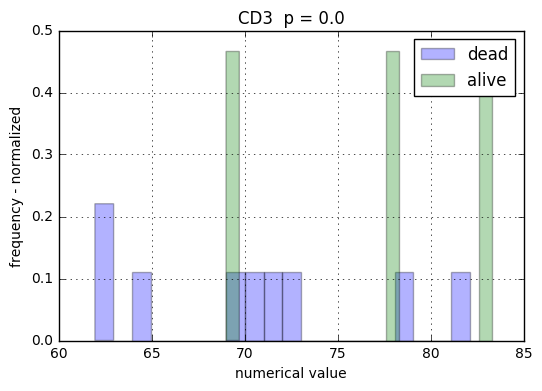

51405 CD33
Error
51406 CD34
CD34 0.0
n =  13


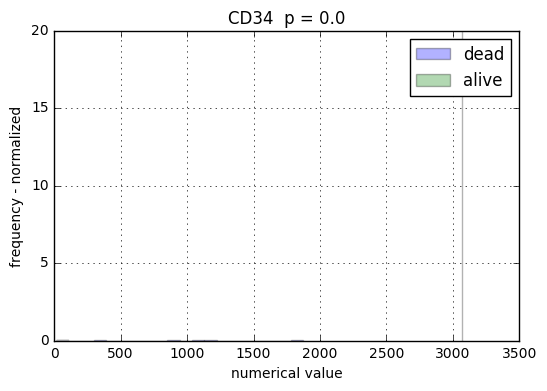

51408 CD4
Error
51411 CD45
Error
51412 CD5
Error
51413 CD56
Error
51415 CD64
Error
51416 CD7
Error
51417 CD71
Error
51418 CD8
Error
51419 Eosinophils
Eosinophils 0.0
n =  71


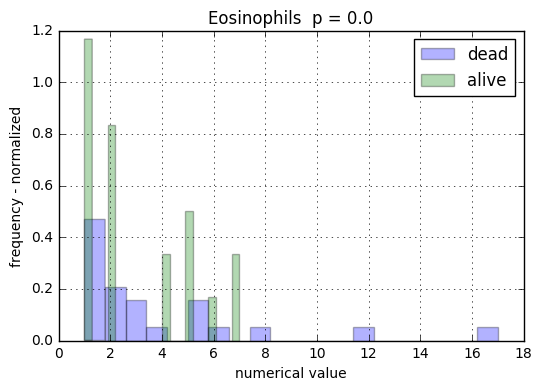

51420 FMC-7
Error
51421 Glyco A
Error
51422 Hematocrit, Other Fluid
Hematocrit, Other Fluid 0.0
n =  32


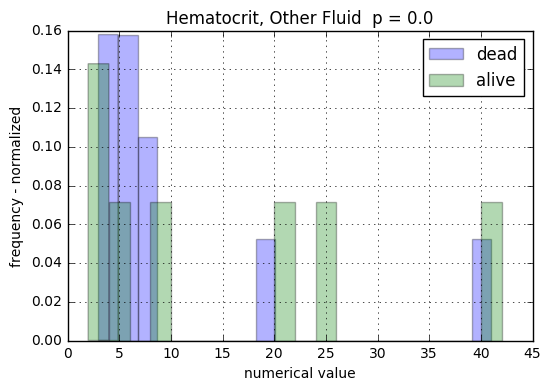

51423 HLA-DR
Error
51424 Immunophenotyping
Error
51425 Kappa
Error
51426 Lambda
Error
51427 Lymphocytes
Lymphocytes 0.0
n =  235


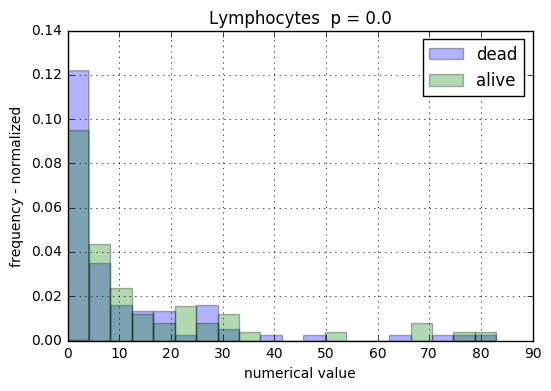

51428 Macrophage
Macrophage 0.0
n =  138


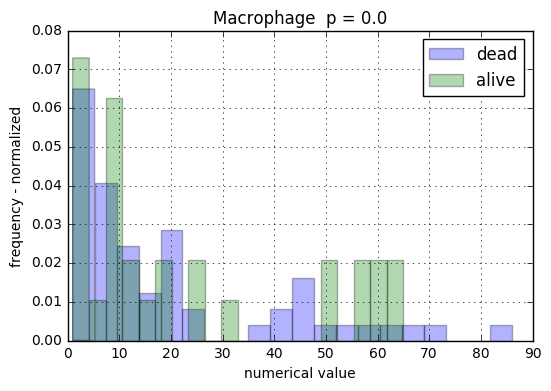

51429 Mesothelial cells
Mesothelial cells 0.0
n =  60


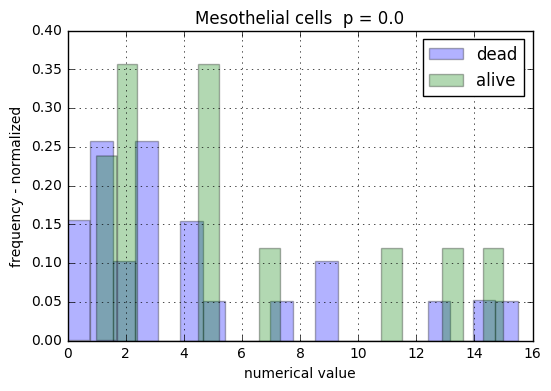

51431 Monos
Monos 0.0
n =  235


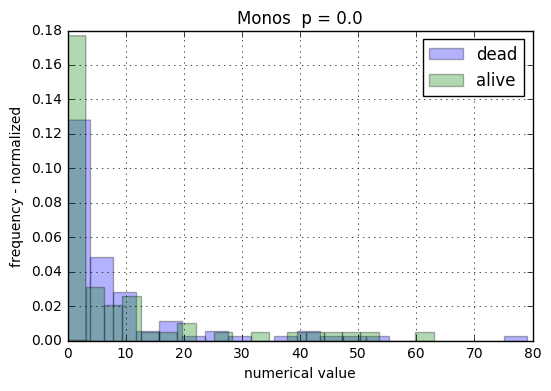

51432 Myelocytes
Myelocytes 0.0
n =  1


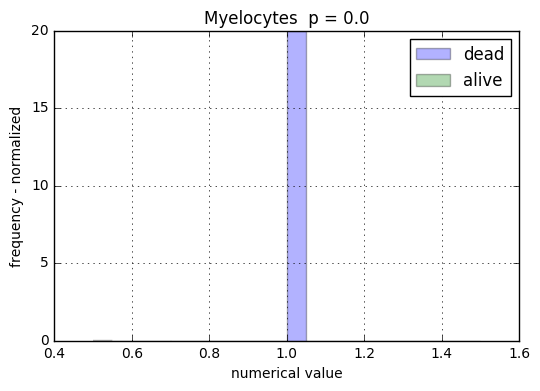

51434 Other Cell
Other Cell 0.0
n =  89


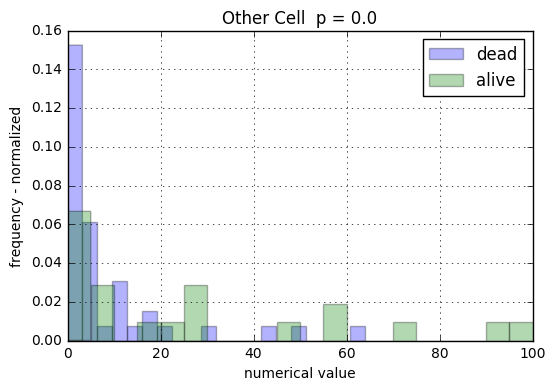

51436 Polys
Polys 0.0
n =  235


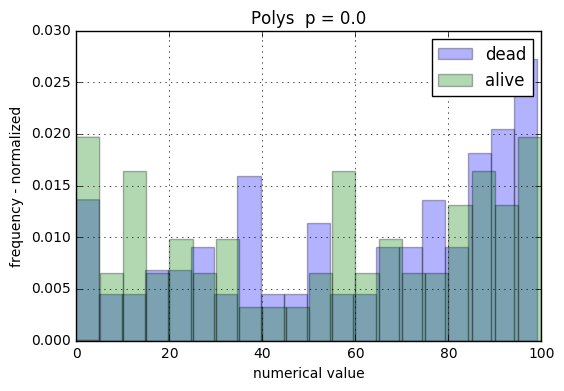

51438 RBC, Other Fluid
RBC, Other Fluid 0.0
n =  162


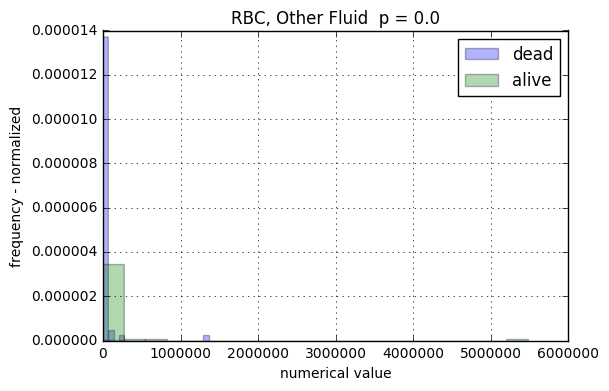

51439 WBC, Other Fluid
WBC, Other Fluid 0.0
n =  174


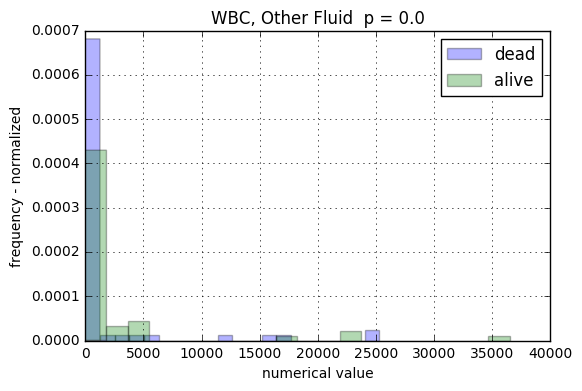

51440 Atypical Lymphocytes
Atypical Lymphocytes 0.0
n =  29


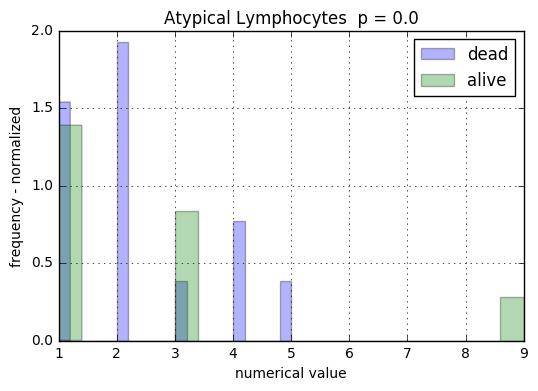

51441 Bands
Bands 0.0
n =  22


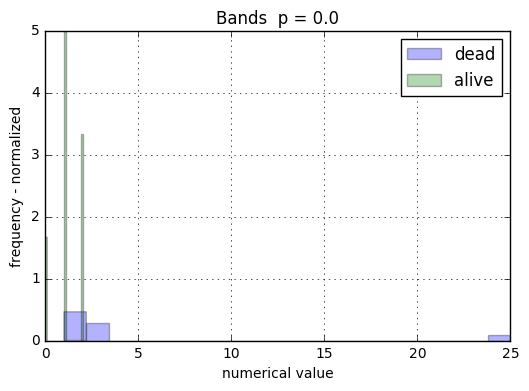

51442 Basophils
Basophils 0.0
n =  26


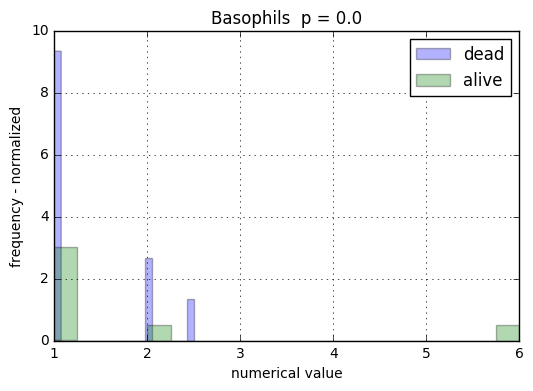

51444 Eosinophils
Eosinophils 0.0
n =  100


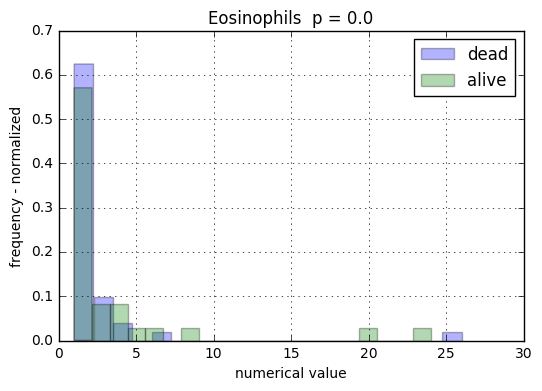

51445 Hematocrit, Pleural
Hematocrit, Pleural 0.0
n =  32


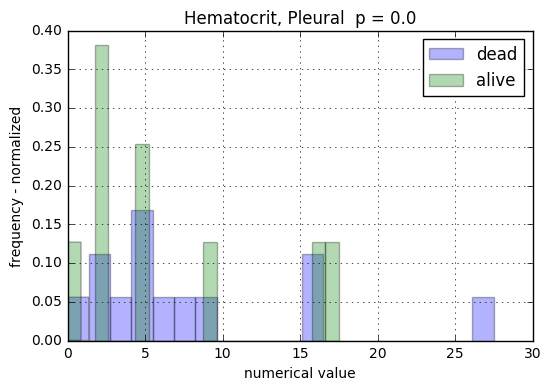

51446 Lymphocytes
Lymphocytes 5.42053752725e-296
n =  362


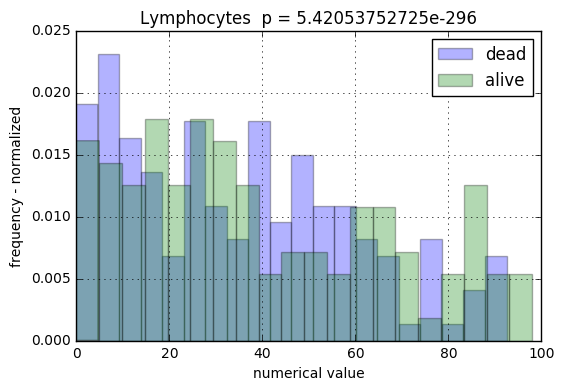

51447 Macrophages
Macrophages 0.0
n =  227


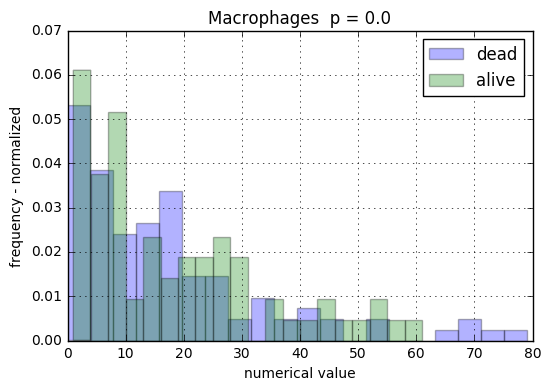

51448 Mesothelial Cells
Mesothelial Cells 0.0
n =  241


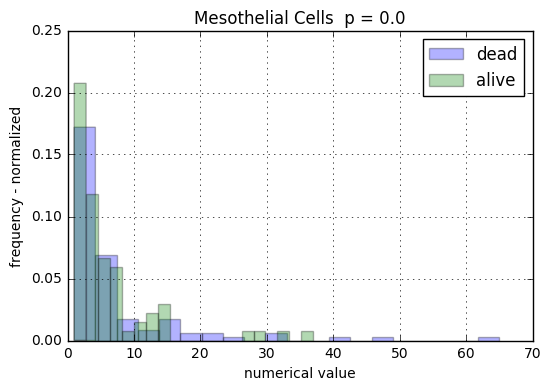

51450 Monos
Monos 1.51279891006e-296
n =  362


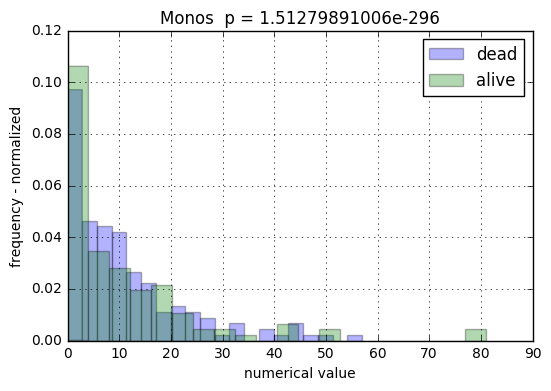

51451 Myelocytes
Myelocytes 0.0
n =  3


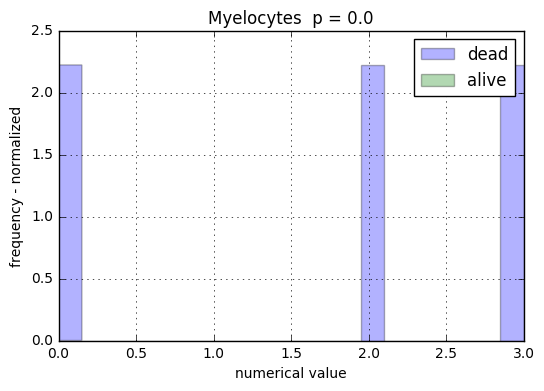

51452 NRBC
NRBC 0.0
n =  6


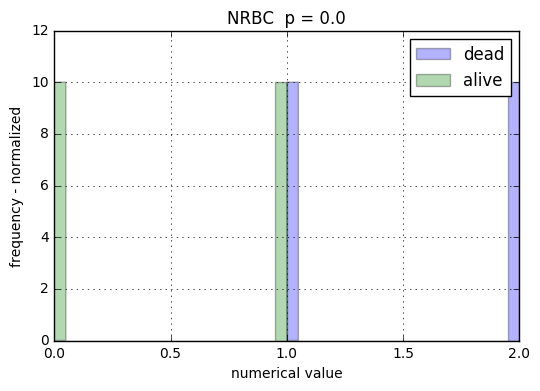

51453 Other
Other 0.0
n =  108


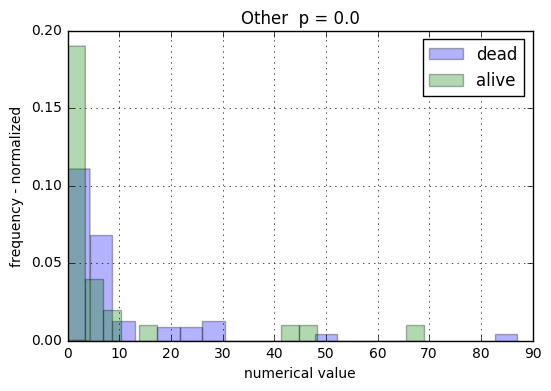

51454 Plasma Cells
Plasma Cells 0.0
n =  13


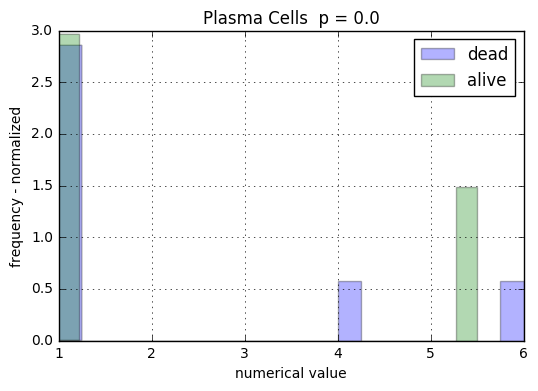

51455 Polys
Polys 1.22162626445e-296
n =  362


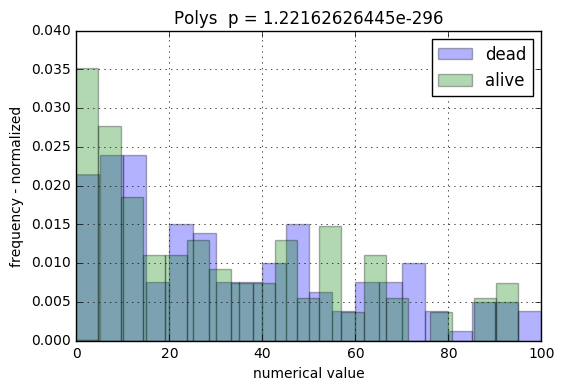

51457 RBC, Pleural
RBC, Pleural 3.93163292911e-302
n =  350


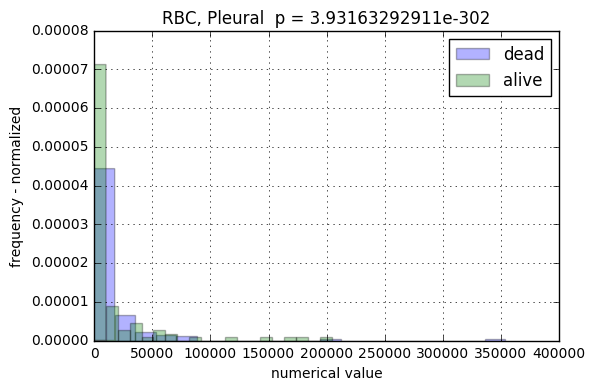

51458 WBC, Pleural
WBC, Pleural 5.98315605335e-296
n =  362


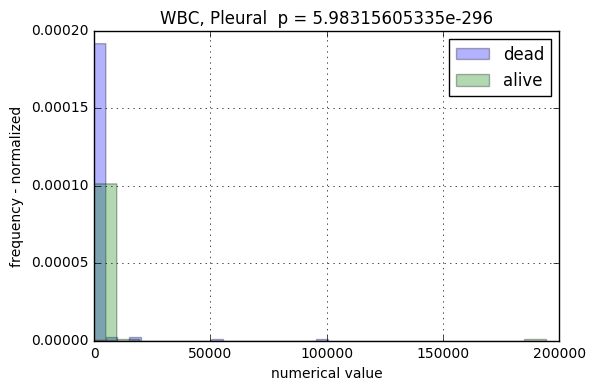

51460 Blood, Occult
Error
51462 Amorphous Crystals
Error
51463 Bacteria
Bacteria 0.0
n =  39


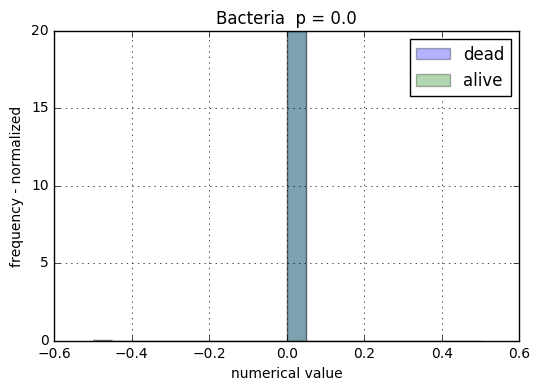

51464 Bilirubin
Error
51466 Blood
Error
51469 Calcium Oxalate Crystals
Error
51470 Calcium Phosphate Crystals
Error
51474 Eosinophils
Error
51476 Epithelial Cells
Epithelial Cells 1.5578976402e-92
n =  1772


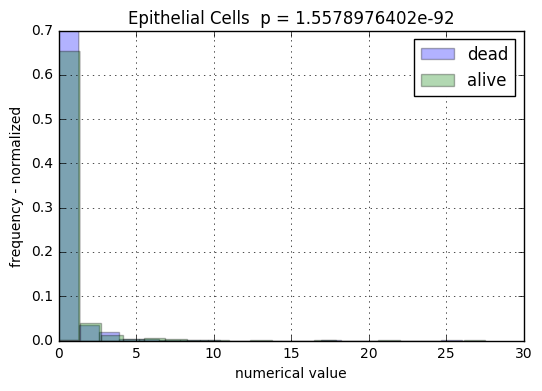

51478 Glucose
Glucose 0.0
n =  296


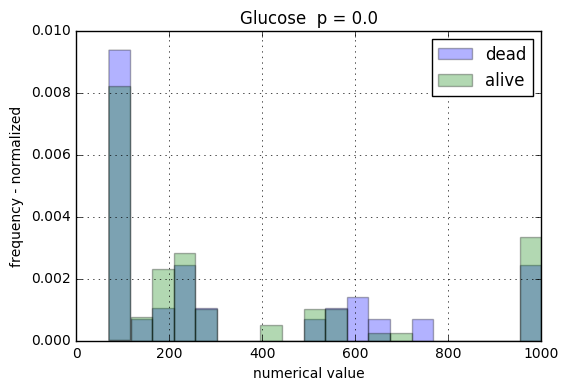

51479 Granular Casts
Granular Casts 0.0
n =  334


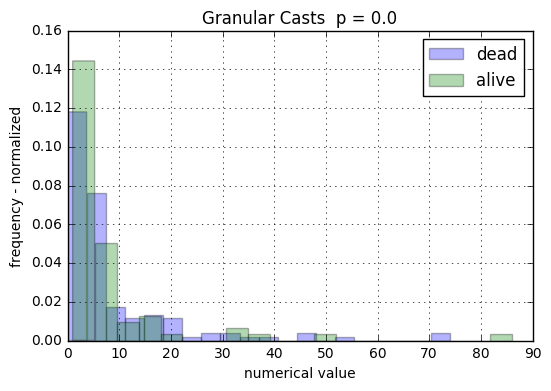

51480 Hematocrit
Hematocrit 0.0
n =  1


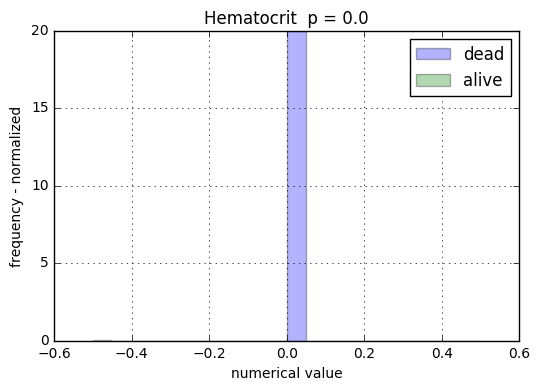

51481 Hemosiderin
Error
51482 Hyaline Casts
Hyaline Casts 9.32569506238e-166
n =  1008


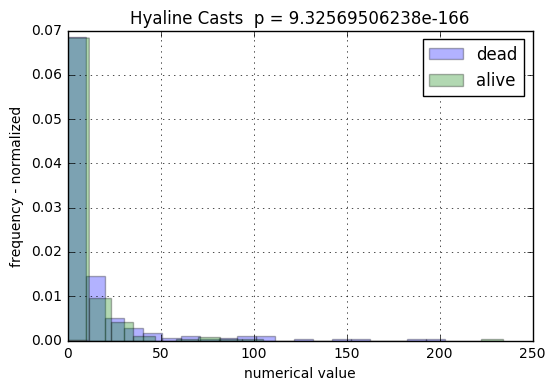

51484 Ketone
Ketone 0.0
n =  268


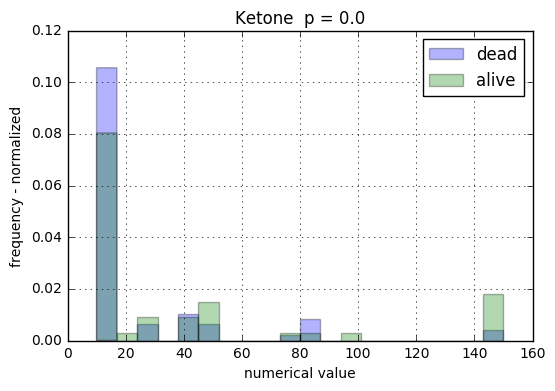

51486 Leukocytes
Leukocytes 0.0
n =  0


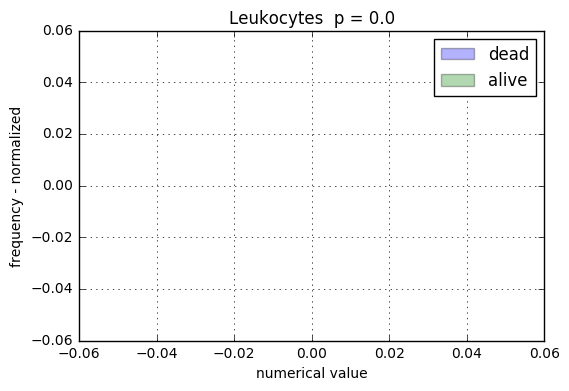

51487 Nitrite
Error
51489 NonSquamous Epithelial Cell
NonSquamous Epithelial Cell 0.0
n =  14


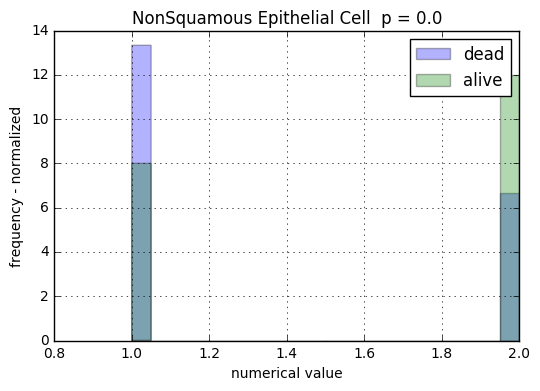

51490 Oval Fat Body
Error
51491 pH
pH 3.17714828123e-07
n =  5910


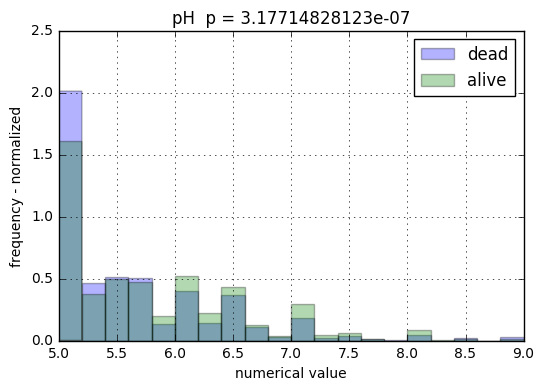

51492 Protein
Protein 6.04910637789e-86
n =  1382


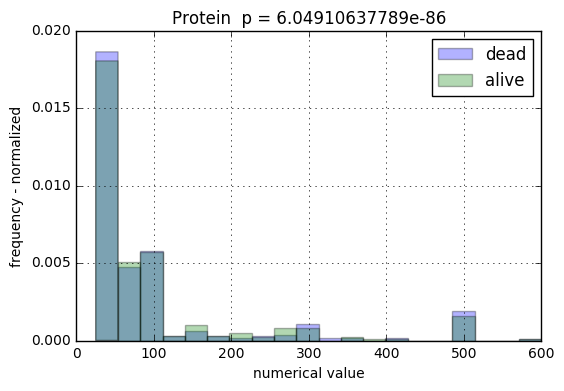

51493 RBC
RBC 9.39497643978e-113
n =  1759


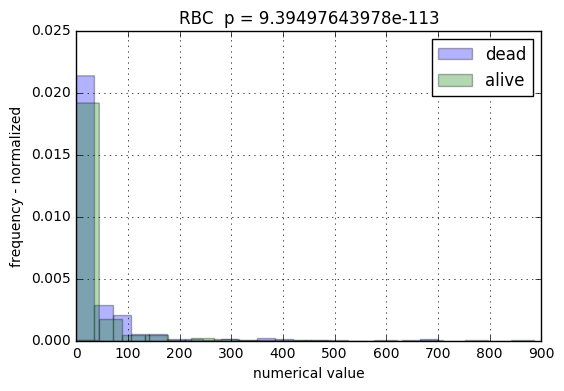

51494 RBC Casts
RBC Casts 0.0
n =  2


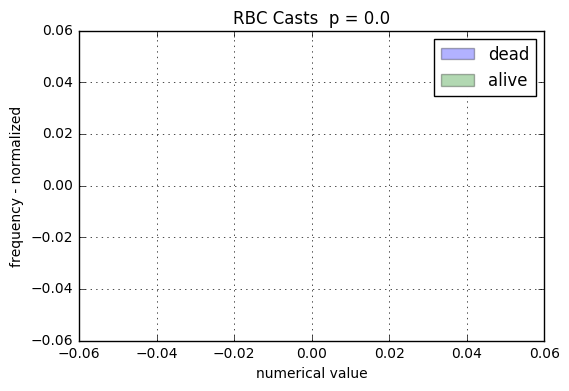

51495 RBC Clumps
Error
51497 Renal Epithelial Cells
Renal Epithelial Cells 0.0
n =  20


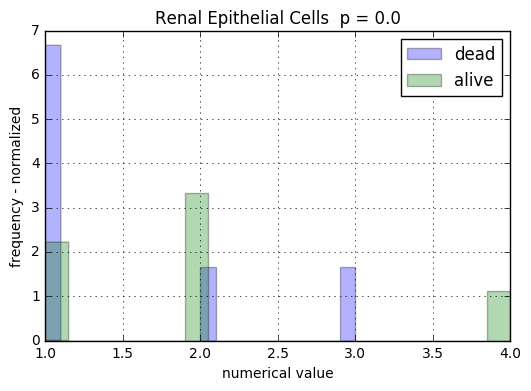

51498 Specific Gravity
Specific Gravity 1.82105260209e-07
n =  5603


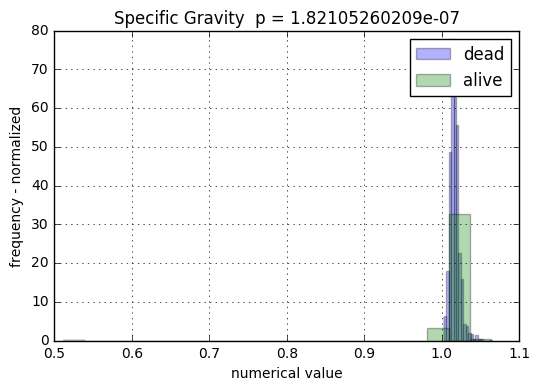

51499 Sperm
Error
51500 Sulfonamides
Error
51501 Transitional Epithelial Cells
Transitional Epithelial Cells 0.0
n =  120


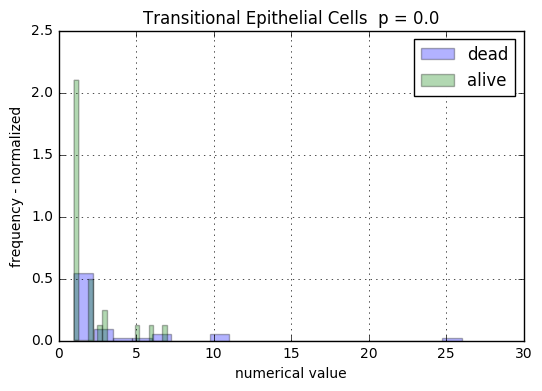

51502 Trichomonas
Error
51503 Triple Phosphate Crystals
Error
51505 Uric Acid Crystals
Error
51506 Urine Appearance
Error
51507 Urine Casts, Other
Urine Casts, Other 0.0
n =  18


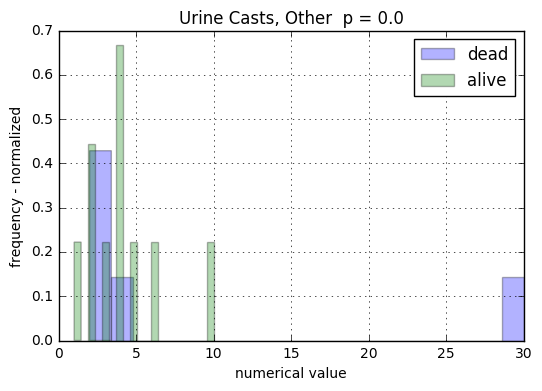

51508 Urine Color
Urine Color 0.0
n =  1


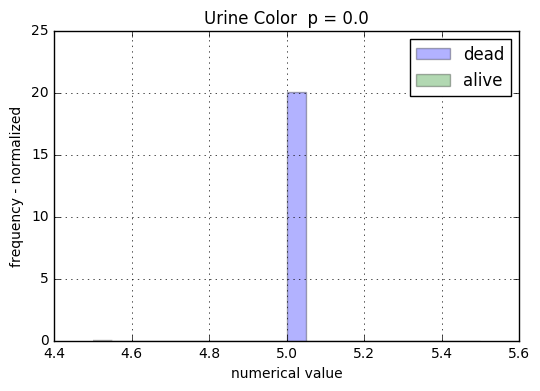

51510 Urine Crystals, Other
Error
51512 Urine Mucous
Error
51513 Urine Specimen Type
Error
51514 Urobilinogen
Urobilinogen 9.16872401252e-195
n =  947


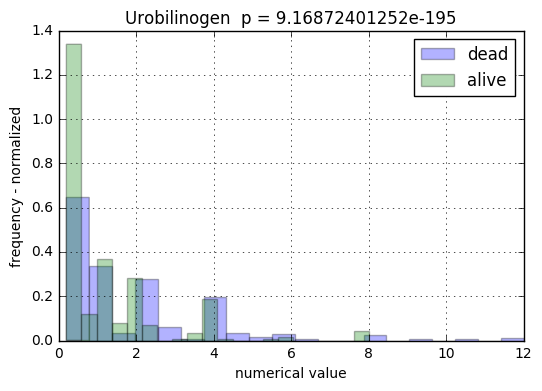

51515 Waxy Casts
Error
51516 WBC
WBC 3.61440286634e-99
n =  1745


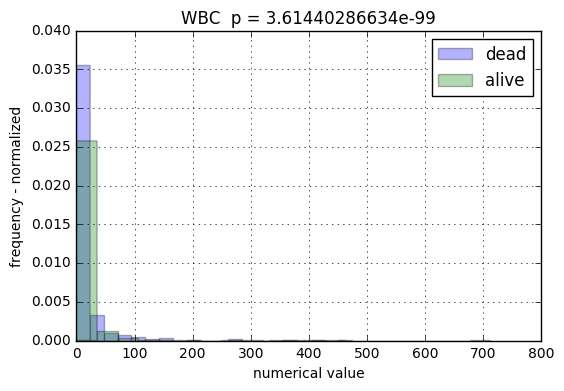

51517 WBC Casts
WBC Casts 0.0
n =  8


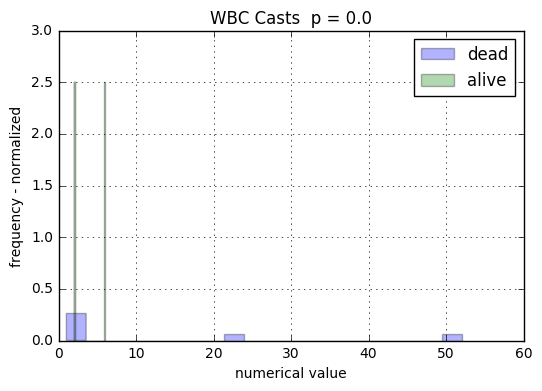

51518 WBC Clumps
WBC Clumps 0.0
n =  0


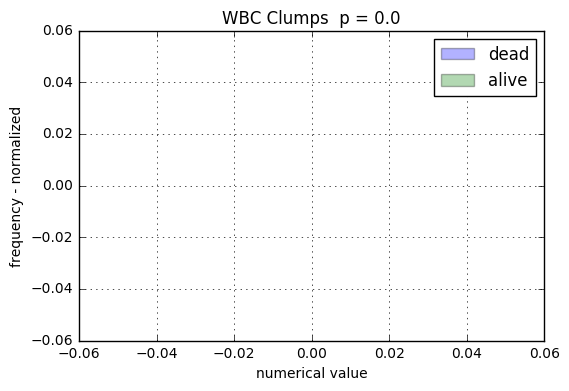

51519 Yeast
Yeast 0.0
n =  0


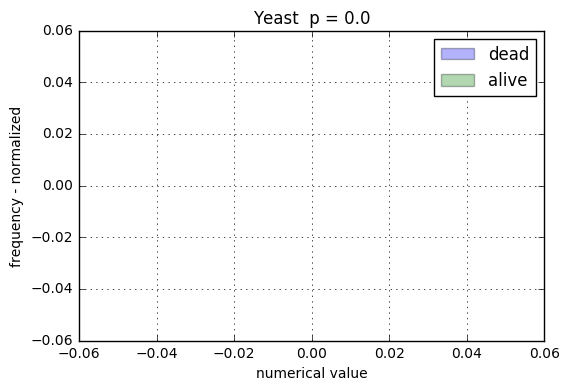

51520 ANTI-MC
Error
51521 ACID PHOSPHATASE, PROSTATIC
ACID PHOSPHATASE, PROSTATIC 0.0
n =  2


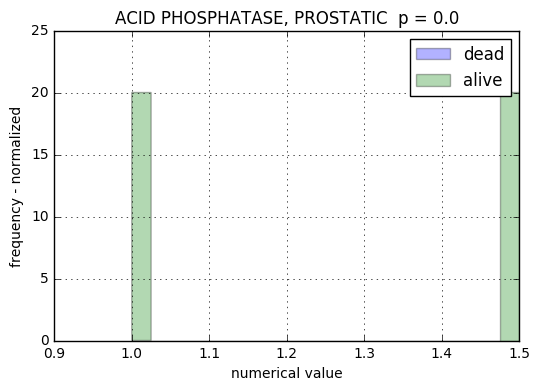

51523 GR HOLD
Error
51525 Billed
Error
51529 Estimated Actual Glucose
Estimated Actual Glucose 0.0
n =  26


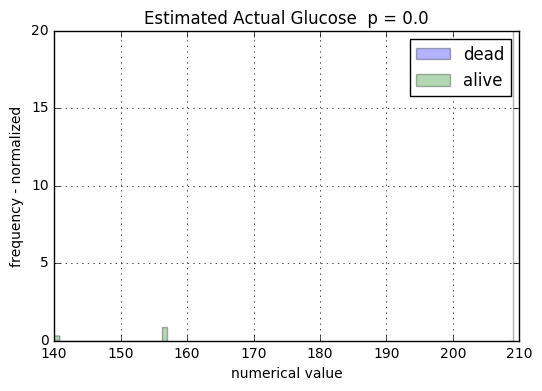

In [89]:
# list of tests
HF_patients_testdata = HF_patients_1.copy()
scores = [['itemid', 'label', 'N', 'P-value']]

#looping through tests, plotting hist and aggregating data
for i in zip(test2['itemid'], test2['label'])[1:]:
    try:
        print i[0], i[1]
        data = plot_30d_mortality(i[0], i[1], patient_list_1, HF_patients_1)
        HF_patients_testdata[i[1]] = data[0].copy()[str(i[1] + '_mean')]
        scores.append([i[0], i[1], data[1], data[2]])
    except:
        print 'Error'
    
    

In [91]:
pd.DataFrame(scores[1:], columns = scores[0])

,itemid,label,N,P-value
0,50801,Alveolar-arterial Gradient,1802,4.210410e-09
1,50802,Base Excess,5575,7.531694e-56
2,50803,"Calculated Bicarbonate, Whole Blood",817,1.123303e-188
3,50804,Calculated Total CO2,5581,6.526426e-46
4,50805,Carboxyhemoglobin,230,0.000000e+00
5,50806,"Chloride, Whole Blood",2791,2.701494e-03
6,50808,Free Calcium,4301,9.861354e-28
7,50809,Glucose,3961,2.405642e-02
8,50810,"Hematocrit, Calculated",3795,1.733186e-01
9,50811,Hemoglobin,3796,8.926555e-03


In [92]:
HF_patients_testdata.head()

,row_id,subject_id,gender,dob,dod,dod_hosp,dod_ssn,expire_flag,num_adm,hadm_id,...,Transitional Epithelial Cells,"Urine Casts, Other",Urine Color,Urobilinogen,WBC,WBC Casts,WBC Clumps,Yeast,"ACID PHOSPHATASE, PROSTATIC",Estimated Actual Glucose
0,2,3,M,2025-04-11,2102-06-14,NaT,2102-06-14,1,1,145834,...,NaN,NaN,NaN,NaN,NaN,NaN,NaN,NaN,NaN,NaN
1,8,9,M,2108-01-26,2149-11-14,2149-11-14,2149-11-14,1,1,150750,...,NaN,NaN,NaN,NaN,NaN,NaN,NaN,NaN,NaN,NaN
2,23,26,M,2054-05-04,2128-02-25,NaT,2128-02-25,1,1,197661,...,NaN,NaN,NaN,4.0,0.0,NaN,NaN,NaN,NaN,NaN
3,26,30,M,1872-10-14 00:00:00,NaT,NaT,NaT,0,1,104557,...,NaN,NaN,NaN,0.2,717.0,NaN,NaN,NaN,NaN,NaN
4,33,37,M,2114-09-17,2185-01-06,2185-01-06,2185-01-06,1,1,188670,...,NaN,NaN,NaN,NaN,NaN,NaN,NaN,NaN,NaN,NaN


In [90]:
# pickling data

import pickle

# HF data with test data
pickle.dump( HF_patients_testdata, open( "20170404_HF_patients_testdata.pickle", "wb" ) )

# Ranks and N of testdata
testdata_scores = pd.DataFrame(scores[1:], columns = scores[0])
pickle.dump( testdata_scores, open( "20170404_testdata_scores.pickle", "wb" ) )

In [93]:
testdata_scores.sort(['N', 'P-value'], ascending=[0, 0])
testdata_scores[testdata_scores['N'] > 1500.].sort(['P-value'], ascending=[1])

/Users/jdschonhoft/anaconda/lib/python2.7/site-packages/ipykernel/__main__.py:1: FutureWarning: sort(columns=....) is deprecated, use sort_values(by=.....)
  if __name__ == '__main__':
/Users/jdschonhoft/anaconda/lib/python2.7/site-packages/ipykernel/__main__.py:2: FutureWarning: sort(columns=....) is deprecated, use sort_values(by=.....)
  from ipykernel import kernelapp as app


,itemid,label,N,P-value
37,50852,% Hemoglobin A1c,1927,2.893341e-242
83,50924,Ferritin,1904,3.854427e-126
369,51493,RBC,1759,9.394976e-113
377,51516,WBC,1745,3.614403e-99
69,50904,"Cholesterol, HDL",1975,1.294155e-93
359,51476,Epithelial Cells,1772,1.557898e-92
97,50952,Iron,2026,6.521778e-90
133,50998,Transferrin,1958,4.794797e-88
98,50953,"Iron Binding Capacity, Total",1961,3.320995e-87
68,50903,Cholesterol Ratio (Total/HDL),1968,1.267591e-80


(1e-250, 100.0)

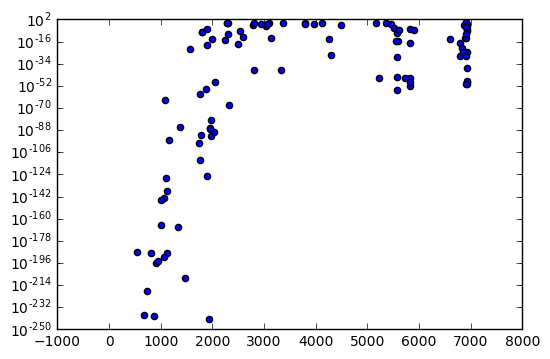

In [83]:
plt.scatter(testdata_scores['N'], testdata_scores['P-value'])
plt.yscale('log')
plt.ylim([1e-250, 10e1])